In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import glob
import os
import seaborn as sns
import warnings
from datetime import datetime
import seaborn as sns
warnings.filterwarnings('ignore')

pd.pandas.set_option('display.max_columns' ,None)

In [2]:
def getdata(path):
    data = pd.DataFrame()
    for i in glob.glob(path):
        data = data.append(pd.read_csv(i), ignore_index=True)
        
    return data

In [3]:
df1 = getdata(r'C:\Users\prati\Project\data\14-03\*')
df1

,dep_date,airline,dep_time,duration,stops,arr_time,price,source,destination,dateofbooking
0,14/03/2022,IndiGo,04:35,01 h 55 m,Non stop,06:30,"₹ 7,308",Mumbai,Chennai,13/03/2022
1,14/03/2022,Go First,05:50,01 h 50 m,Non stop,07:40,"₹ 7,308",Mumbai,Chennai,13/03/2022
2,14/03/2022,SpiceJet,06:00,02 h,Non stop,08:00,"₹ 7,308",Mumbai,Chennai,13/03/2022
3,14/03/2022,IndiGo,15:15,01 h 55 m,Non stop,17:10,"₹ 7,308",Mumbai,Chennai,13/03/2022
4,14/03/2022,IndiGo,16:25,01 h 50 m,Non stop,18:15,"₹ 7,308",Mumbai,Chennai,13/03/2022
...,...,...,...,...,...,...,...,...,...,...
165,"14 Mar, Mon",Vistara,21:55,13h 55m,1 stop - DEL,11:50,"₹12,914","Mumbai, BOM - Chatrapati Shivaji Airport, India","Bangalore, BLR - Kempegowda International Airp...",13/03/2022
166,"14 Mar, Mon",Vistara,20:55,14h 55m,1 stop - DEL,11:50,"₹12,914","Mumbai, BOM - Chatrapati Shivaji Airport, India","Bangalore, BLR - Kempegowda International Airp...",13/03/2022
167,"14 Mar, Mon",Vistara,17:35,15h 5m,1 stop - DEL,08:40,"₹12,914","Mumbai, BOM - Chatrapati Shivaji Airport, India","Bangalore, BLR - Kempegowda International Airp...",13/03/2022
168,"14 Mar, Mon",Vistara,19:45,15h 5m,1 stop - DEL,10:50,"₹12,914","Mumbai, BOM - Chatrapati Shivaji Airport, India","Bangalore, BLR - Kempegowda International Airp...",13/03/2022


In [4]:
df1.source = df1.source.map({'Mumbai, BOM - Chatrapati Shivaji Airport, India' : 'Mumbai', 'Mumbai' : 'Mumbai'})
df1.destination = df1.destination.map({
    'Bangalore, BLR - Kempegowda International Airport, India' : 'Bangalore',
    'Hyderabad, HYD - Rajiv Gandhi International, India' : 'Hyderabad',
    'Chennai' : 'Chennai',
    'Bengaluru' : 'Bangalore'
})

In [5]:
df1.destination.value_counts()

Bangalore    104
Hyderabad     50
Chennai       16
Name: destination, dtype: int64

In [6]:
df1

,dep_date,airline,dep_time,duration,stops,arr_time,price,source,destination,dateofbooking
0,14/03/2022,IndiGo,04:35,01 h 55 m,Non stop,06:30,"₹ 7,308",Mumbai,Chennai,13/03/2022
1,14/03/2022,Go First,05:50,01 h 50 m,Non stop,07:40,"₹ 7,308",Mumbai,Chennai,13/03/2022
2,14/03/2022,SpiceJet,06:00,02 h,Non stop,08:00,"₹ 7,308",Mumbai,Chennai,13/03/2022
3,14/03/2022,IndiGo,15:15,01 h 55 m,Non stop,17:10,"₹ 7,308",Mumbai,Chennai,13/03/2022
4,14/03/2022,IndiGo,16:25,01 h 50 m,Non stop,18:15,"₹ 7,308",Mumbai,Chennai,13/03/2022
...,...,...,...,...,...,...,...,...,...,...
165,"14 Mar, Mon",Vistara,21:55,13h 55m,1 stop - DEL,11:50,"₹12,914",Mumbai,Bangalore,13/03/2022
166,"14 Mar, Mon",Vistara,20:55,14h 55m,1 stop - DEL,11:50,"₹12,914",Mumbai,Bangalore,13/03/2022
167,"14 Mar, Mon",Vistara,17:35,15h 5m,1 stop - DEL,08:40,"₹12,914",Mumbai,Bangalore,13/03/2022
168,"14 Mar, Mon",Vistara,19:45,15h 5m,1 stop - DEL,10:50,"₹12,914",Mumbai,Bangalore,13/03/2022


In [7]:
df1.isnull().sum()

dep_date         0
airline          0
dep_time         0
duration         0
stops            0
arr_time         0
price            0
source           0
destination      0
dateofbooking    0
dtype: int64

In [8]:
df2 = getdata(r'C:\Users\prati\Project\data\15-03\*')
df2

,dep_date,airline,station,time,duration,stops,price,source,destination,dateofbooking
0,"Wed, 30 Mar",AirAsia (India),BLR - MAA,07:15 - 08:15,1h,Non-stop,"₹ 3,485",Bengaluru - BLR,Chennai - MAA,15/03/2022
1,"Wed, 30 Mar",AirAsia (India),BLR - MAA,16:15 - 17:15,1h,Non-stop,"₹ 3,485",Bengaluru - BLR,Chennai - MAA,15/03/2022
2,"Wed, 30 Mar",IndiGo,BLR - MAA,11:10 - 12:10,1h,Non-stop,"₹ 3,607",Bengaluru - BLR,Chennai - MAA,15/03/2022
3,"Wed, 30 Mar",IndiGo,BLR - MAA,08:05 - 09:05,1h,Non-stop,"₹ 3,607",Bengaluru - BLR,Chennai - MAA,15/03/2022
4,"Wed, 30 Mar",SpiceJet,BLR - MAA,05:45 - 07:00,1h 15m,Non-stop,"₹ 3,237",Bengaluru - BLR,Chennai - MAA,15/03/2022
...,...,...,...,...,...,...,...,...,...,...
4917,"Fri, 29 Apr",Emirates,BOM - BLR,22:20 - 08:55,10h 35m,1 stop,"₹ 50,705",Mumbai - BOM,Bengaluru - BLR,15/03/2022
4918,"Fri, 29 Apr",Emirates,BOM - BLR,15:35 - 02:55,11h 20m,1 stop,"₹ 50,043",Mumbai - BOM,Bengaluru - BLR,15/03/2022
4919,"Fri, 29 Apr",Multiple Airlines,BOM - BLR,10:15 - 21:50,11h 35m,2 stops,"₹ 52,332",Mumbai - BOM,Bengaluru - BLR,15/03/2022
4920,"Fri, 29 Apr",Hahn Air Systems,BOM - BLR,10:15 - 22:30,12h 15m,2 stops,"₹ 51,990",Mumbai - BOM,Bengaluru - BLR,15/03/2022


In [18]:
# for feature in df2.columns :
#     print(feature, "\n ", df2[feature].unique())

dep_date 
  ['Wed, 30 Mar' 'Wed, 16 Mar' '16/03/2022' 'Thu, 14 Apr' 'Fri, 15 Apr'
 'Tue, 15 Mar' 'Wed, 27 Apr' '30/03/2022' 'Fri, 29 Apr']
airline 
  ['AirAsia (India)' 'IndiGo' 'SpiceJet' 'Multiple Airlines'
 'Hahn Air Systems' 'Vistara' 'Go First' 'Air India' 'Alaska Seaplane'
 'Malaysia Airlines' 'Emirates' 'Qatar Airways' 'FlexFlight'
 'SriLankan Airlines' '~Z' 'Oman Air' 'Thai Airways International'
 'Kuwait Airways' 'Etihad Airways' 'Nepal Airlines'
 'Mahfooz Aviation (Gambia) Ltd.' 'Singapore Airlines']
station 
  ['BLR - MAA' 'MAA - BLR' 'CCU - BLR' 'BLR - CCU' 'BLR - BOM' 'DEL - BLR'
 'BLR - DEL' 'BOM - BLR' 'MAA - BOM' 'BOM - MAA' 'BOM - DEL' 'BOM - CCU'
 'CCU - BOM']
time 
  ['07:15 - 08:15' '16:15 - 17:15' '11:10 - 12:10' ... '03:10 - 02:30'
 '04:30 - 15:40' '22:20 - 08:55']
duration 
  [' 1h ' ' 1h 15m ' ' 1h 5m ' ' 1h 25m ' ' 4h 50m ' ' 3h 45m ' ' 3h 55m '
 ' 3h 50m ' ' 4h 15m ' ' 4h 45m ' ' 4h ' ' 4h 40m ' ' 5h 10m ' ' 5h 50m '
 ' 7h 15m ' ' 9h 30m ' ' 6h 35m ' ' 9h 45m 

In [9]:
df2[['source','destination']] = df2.station.str.split(" - ", expand=True)

In [10]:
df2.source = df2.source.map({'BLR' : 'Bangalore', 
                             'MAA' : 'Chennai',
                             'DEL' : 'Delhi',
                             'BOM' : 'Mumbai',
                             'CCU' : 'Kolkata'
                            })

df2.destination = df2.destination.map({'BLR' : 'Bangalore', 
                             'MAA' : 'Chennai',
                             'DEL' : 'Delhi',
                             'BOM' : 'Mumbai',
                             'CCU' : 'Kolkata'
                            })

In [11]:
df2[['dep_time', 'arr_time']] = df2.time.str.split(" - ", expand=True)

In [12]:
df2 = df2.drop(['time','station'], axis=1)

In [13]:
df2

,dep_date,airline,duration,stops,price,source,destination,dateofbooking,dep_time,arr_time
0,"Wed, 30 Mar",AirAsia (India),1h,Non-stop,"₹ 3,485",Bangalore,Chennai,15/03/2022,07:15,08:15
1,"Wed, 30 Mar",AirAsia (India),1h,Non-stop,"₹ 3,485",Bangalore,Chennai,15/03/2022,16:15,17:15
2,"Wed, 30 Mar",IndiGo,1h,Non-stop,"₹ 3,607",Bangalore,Chennai,15/03/2022,11:10,12:10
3,"Wed, 30 Mar",IndiGo,1h,Non-stop,"₹ 3,607",Bangalore,Chennai,15/03/2022,08:05,09:05
4,"Wed, 30 Mar",SpiceJet,1h 15m,Non-stop,"₹ 3,237",Bangalore,Chennai,15/03/2022,05:45,07:00
...,...,...,...,...,...,...,...,...,...,...
4917,"Fri, 29 Apr",Emirates,10h 35m,1 stop,"₹ 50,705",Mumbai,Bangalore,15/03/2022,22:20,08:55
4918,"Fri, 29 Apr",Emirates,11h 20m,1 stop,"₹ 50,043",Mumbai,Bangalore,15/03/2022,15:35,02:55
4919,"Fri, 29 Apr",Multiple Airlines,11h 35m,2 stops,"₹ 52,332",Mumbai,Bangalore,15/03/2022,10:15,21:50
4920,"Fri, 29 Apr",Hahn Air Systems,12h 15m,2 stops,"₹ 51,990",Mumbai,Bangalore,15/03/2022,10:15,22:30


In [14]:
df2.isnull().sum()

dep_date         0
airline          0
duration         0
stops            0
price            0
source           0
destination      0
dateofbooking    0
dep_time         0
arr_time         0
dtype: int64

In [15]:
df3 = getdata(r'C:\Users\prati\Project\data\New folder\*')
df3

,dep_date,airline,dep_time,duration,arr_time,price,source,destination,dateofbooking,stops,days_to_dep
0,14/02/2022,IndiGo,08:30,1h 55m,10:25,"6,153",BOM,DEL,13/02/2022,NaN,NaN
1,14/02/2022,IndiGo,07:45,2h 05m,09:50,"5,943",BOM,DEL,13/02/2022,NaN,NaN
2,14/02/2022,Vistara,12:25,2h 05m,14:30,"6,249",BOM,DEL,13/02/2022,NaN,NaN
3,14/02/2022,IndiGo,10:05,2h 10m,12:15,"5,943",BOM,DEL,13/02/2022,NaN,NaN
4,14/02/2022,IndiGo,13:40,2h 10m,15:50,"5,943",BOM,DEL,13/02/2022,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...
209676,31/03/2022,Vistara,07:05,13h 50m,20:55,"7,697",Chennai,Hyderabad,11/02/2022,1-stop\n\t\t\t\t\t\t\t\t\t\t\t\t\n\t\t\t\t\t\t...,48.0
209677,31/03/2022,Vistara,07:05,13h 50m,20:55,"7,709",Chennai,Hyderabad,11/02/2022,1-stop\n\t\t\t\t\t\t\t\t\t\t\t\t\n\t\t\t\t\t\t...,48.0
209678,31/03/2022,Vistara,12:30,20h 35m,09:05,"8,640",Chennai,Hyderabad,11/02/2022,1-stop\n\t\t\t\t\t\t\t\t\t\t\t\t\n\t\t\t\t\t\t...,48.0
209679,31/03/2022,Vistara,09:45,23h 20m,09:05,"8,640",Chennai,Hyderabad,11/02/2022,1-stop\n\t\t\t\t\t\t\t\t\t\t\t\t\n\t\t\t\t\t\t...,48.0


In [26]:
# for feature in df3.columns :
#     print(feature, "\n ", df3[feature].unique())

dep_date 
  ['14/02/2022' '15/02/2022' '16/02/2022' '17/02/2022' '18/02/2022'
 '19/02/2022' '20/02/2022' '21/02/2022' '22/02/2022' '23/02/2022'
 '24/02/2022' '25/02/2022' '26/02/2022' '27/02/2022' '28/02/2022'
 '11/02/2022' '12/02/2022' '13/02/2022' '01/03/2022' '02/03/2022'
 '03/03/2022' '04/03/2022' '05/03/2022' '06/03/2022' '07/03/2022'
 '08/03/2022' '09/03/2022' '10/03/2022' '11/03/2022' '12/03/2022'
 '13/03/2022' '14/03/2022' '15/03/2022' '16/03/2022' '17/03/2022'
 '18/03/2022' '19/03/2022' '20/03/2022' '21/03/2022' '22/03/2022'
 '23/03/2022' '24/03/2022' '25/03/2022' '26/03/2022' '27/03/2022'
 '28/03/2022' '29/03/2022' '30/03/2022' '31/03/2022']
airline 
  ['IndiGo ' 'Vistara ' 'Air India ' 'SpiceJet ' 'AirAsia India '
 'Go First ' 'SpiceJet' 'AirAsia' 'Vistara' 'GO FIRST' 'Indigo'
 'Air India' 'Trujet' 'StarAir']
dep_time 
  ['08:30' '07:45' '12:25' '10:05' '13:40' '09:20' '08:00' '10:00' '11:55'
 '11:45' '07:20' '10:15' '10:25' '14:40' '08:45' '07:05' '07:00' '18:00'
 '15:30' '

In [16]:
df3.isnull().sum()

dep_date            0
airline             0
dep_time            0
duration            0
arr_time            0
price               0
source              0
destination         0
dateofbooking       0
stops            2907
days_to_dep      2907
dtype: int64

In [17]:
df3.source = df3.source.map({'BOM' : 'Mumbai',
                             'DEL' : 'Delhi',
                             'BLR' : 'Bangalore',
                             'HYD' : 'Hyderabad',
                             'CCU' : 'Kolkata',
                             'MAA' : 'Chennai',
                             'Delhi' : 'Delhi',
                             'Mumbai' : 'Mumbai',
                             'Bangalore' : 'Bangalore',
                             'Kolkata' : 'Kolkata',
                             'Hyderabad' : 'Hyderabad',
                             'Chennai' : 'Chennai'
                            })

df3.destination = df3.destination.map({'BOM' : 'Mumbai',
                             'DEL' : 'Delhi',
                             'BLR' : 'Bangalore',
                             'HYD' : 'Hyderabad',
                             'CCU' : 'Kolkata',
                             'MAA' : 'Chennai',
                             'Delhi' : 'Delhi',
                             'Mumbai' : 'Mumbai',
                             'Bangalore' : 'Bangalore',
                             'Kolkata' : 'Kolkata',
                             'Hyderabad' : 'Hyderabad',
                             'Chennai' : 'Chennai'
                            })

In [18]:
df3['stops'] = df3['stops'].str.split('-').str[0]

In [19]:
df3

,dep_date,airline,dep_time,duration,arr_time,price,source,destination,dateofbooking,stops,days_to_dep
0,14/02/2022,IndiGo,08:30,1h 55m,10:25,"6,153",Mumbai,Delhi,13/02/2022,NaN,NaN
1,14/02/2022,IndiGo,07:45,2h 05m,09:50,"5,943",Mumbai,Delhi,13/02/2022,NaN,NaN
2,14/02/2022,Vistara,12:25,2h 05m,14:30,"6,249",Mumbai,Delhi,13/02/2022,NaN,NaN
3,14/02/2022,IndiGo,10:05,2h 10m,12:15,"5,943",Mumbai,Delhi,13/02/2022,NaN,NaN
4,14/02/2022,IndiGo,13:40,2h 10m,15:50,"5,943",Mumbai,Delhi,13/02/2022,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...
209676,31/03/2022,Vistara,07:05,13h 50m,20:55,"7,697",Chennai,Hyderabad,11/02/2022,1,48.0
209677,31/03/2022,Vistara,07:05,13h 50m,20:55,"7,709",Chennai,Hyderabad,11/02/2022,1,48.0
209678,31/03/2022,Vistara,12:30,20h 35m,09:05,"8,640",Chennai,Hyderabad,11/02/2022,1,48.0
209679,31/03/2022,Vistara,09:45,23h 20m,09:05,"8,640",Chennai,Hyderabad,11/02/2022,1,48.0


In [20]:
df4 = df1.merge(df2, how = 'outer')
df4

,dep_date,airline,dep_time,duration,stops,arr_time,price,source,destination,dateofbooking
0,14/03/2022,IndiGo,04:35,01 h 55 m,Non stop,06:30,"₹ 7,308",Mumbai,Chennai,13/03/2022
1,14/03/2022,Go First,05:50,01 h 50 m,Non stop,07:40,"₹ 7,308",Mumbai,Chennai,13/03/2022
2,14/03/2022,SpiceJet,06:00,02 h,Non stop,08:00,"₹ 7,308",Mumbai,Chennai,13/03/2022
3,14/03/2022,IndiGo,15:15,01 h 55 m,Non stop,17:10,"₹ 7,308",Mumbai,Chennai,13/03/2022
4,14/03/2022,IndiGo,16:25,01 h 50 m,Non stop,18:15,"₹ 7,308",Mumbai,Chennai,13/03/2022
...,...,...,...,...,...,...,...,...,...,...
5087,"Fri, 29 Apr",Emirates,22:20,10h 35m,1 stop,08:55,"₹ 50,705",Mumbai,Bangalore,15/03/2022
5088,"Fri, 29 Apr",Emirates,15:35,11h 20m,1 stop,02:55,"₹ 50,043",Mumbai,Bangalore,15/03/2022
5089,"Fri, 29 Apr",Multiple Airlines,10:15,11h 35m,2 stops,21:50,"₹ 52,332",Mumbai,Bangalore,15/03/2022
5090,"Fri, 29 Apr",Hahn Air Systems,10:15,12h 15m,2 stops,22:30,"₹ 51,990",Mumbai,Bangalore,15/03/2022


In [21]:
df5 = df4.merge(df3, how = 'outer')
df5

,dep_date,airline,dep_time,duration,stops,arr_time,price,source,destination,dateofbooking,days_to_dep
0,14/03/2022,IndiGo,04:35,01 h 55 m,Non stop,06:30,"₹ 7,308",Mumbai,Chennai,13/03/2022,NaN
1,14/03/2022,Go First,05:50,01 h 50 m,Non stop,07:40,"₹ 7,308",Mumbai,Chennai,13/03/2022,NaN
2,14/03/2022,SpiceJet,06:00,02 h,Non stop,08:00,"₹ 7,308",Mumbai,Chennai,13/03/2022,NaN
3,14/03/2022,IndiGo,15:15,01 h 55 m,Non stop,17:10,"₹ 7,308",Mumbai,Chennai,13/03/2022,NaN
4,14/03/2022,IndiGo,16:25,01 h 50 m,Non stop,18:15,"₹ 7,308",Mumbai,Chennai,13/03/2022,NaN
...,...,...,...,...,...,...,...,...,...,...,...
214768,31/03/2022,Vistara,07:05,13h 50m,1,20:55,"7,697",Chennai,Hyderabad,11/02/2022,48.0
214769,31/03/2022,Vistara,07:05,13h 50m,1,20:55,"7,709",Chennai,Hyderabad,11/02/2022,48.0
214770,31/03/2022,Vistara,12:30,20h 35m,1,09:05,"8,640",Chennai,Hyderabad,11/02/2022,48.0
214771,31/03/2022,Vistara,09:45,23h 20m,1,09:05,"8,640",Chennai,Hyderabad,11/02/2022,48.0


In [22]:
df5.isnull().sum()

dep_date            0
airline             0
dep_time            0
duration            0
stops            2907
arr_time            0
price               0
source              0
destination         0
dateofbooking       0
days_to_dep      7999
dtype: int64

In [23]:
df5.dep_date.value_counts()

28/02/2022     4736
23/02/2022     4642
22/02/2022     4625
27/02/2022     4617
24/02/2022     4598
25/02/2022     4593
21/02/2022     4585
16/03/2022     4583
14/03/2022     4576
07/03/2022     4571
08/03/2022     4567
01/03/2022     4560
06/03/2022     4557
13/03/2022     4552
21/03/2022     4545
20/03/2022     4533
26/02/2022     4528
12/03/2022     4525
10/03/2022     4524
15/03/2022     4521
23/03/2022     4519
22/03/2022     4519
04/03/2022     4516
03/03/2022     4512
02/03/2022     4512
24/03/2022     4508
18/03/2022     4499
19/03/2022     4494
25/03/2022     4492
26/03/2022     4480
05/03/2022     4434
11/03/2022     4417
17/03/2022     4386
27/03/2022     4363
09/03/2022     4351
30/03/2022     4351
29/03/2022     4282
31/03/2022     4267
28/03/2022     4226
20/02/2022     4082
16/02/2022     4015
18/02/2022     4007
17/02/2022     3948
19/02/2022     3914
15/02/2022     3682
14/02/2022     3588
13/02/2022     2826
12/02/2022     2625
11/02/2022     1661
Thu, 14 Apr    1592


In [27]:
# s = 'My 3date is 30 03'
# pd.to_datetime(s, format="My 3date is %d %m")

Timestamp('1900-03-30 00:00:00')

In [28]:
# datetime.strptime('2022'+'03', '%Y%m')

datetime.datetime(2022, 3, 1, 0, 0)

In [29]:
# datetime.strptime('2022 ' + '14, mar Mon', '%Y %d, %b %a').strftime('%Y-%m-%d')

'2022-03-14'

In [25]:
def try_parsing_date(text):
    for fmt in ['%d/%m/%Y', '%Y-%m-%d', '%d.%m.%Y', '%Y %d %b, %a', '%Y %a, %d %b']:
        try:
            if fmt in ['%d/%m/%Y', '%Y-%m-%d', '%d.%m.%Y']:
                return datetime.strptime(text, fmt)
            else:
                return datetime.strptime('2022 ' + text, fmt)
        except:
            pass

In [26]:
# for i in df5.dep_date:
#     print(try_parsing_date(i))

2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00


2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00


2022-04-14 00:00:00
2022-04-14 00:00:00
2022-04-14 00:00:00
2022-04-14 00:00:00
2022-04-14 00:00:00
2022-04-14 00:00:00
2022-04-14 00:00:00
2022-04-14 00:00:00
2022-04-14 00:00:00
2022-04-14 00:00:00
2022-04-14 00:00:00
2022-04-14 00:00:00
2022-04-14 00:00:00
2022-04-14 00:00:00
2022-04-14 00:00:00
2022-04-14 00:00:00
2022-04-14 00:00:00
2022-04-14 00:00:00
2022-04-14 00:00:00
2022-04-14 00:00:00
2022-04-14 00:00:00
2022-04-14 00:00:00
2022-04-14 00:00:00
2022-04-14 00:00:00
2022-04-14 00:00:00
2022-04-14 00:00:00
2022-04-14 00:00:00
2022-04-14 00:00:00
2022-04-14 00:00:00
2022-04-14 00:00:00
2022-04-14 00:00:00
2022-04-14 00:00:00
2022-04-14 00:00:00
2022-04-14 00:00:00
2022-04-14 00:00:00
2022-04-14 00:00:00
2022-04-14 00:00:00
2022-04-14 00:00:00
2022-04-14 00:00:00
2022-04-14 00:00:00
2022-04-14 00:00:00
2022-04-14 00:00:00
2022-04-14 00:00:00
2022-04-14 00:00:00
2022-04-14 00:00:00
2022-04-14 00:00:00
2022-04-14 00:00:00
2022-04-14 00:00:00
2022-04-14 00:00:00
2022-04-14 00:00:00


2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00


2022-04-14 00:00:00
2022-04-14 00:00:00
2022-04-14 00:00:00
2022-04-14 00:00:00
2022-04-14 00:00:00
2022-04-14 00:00:00
2022-04-14 00:00:00
2022-04-14 00:00:00
2022-04-14 00:00:00
2022-04-14 00:00:00
2022-04-14 00:00:00
2022-04-14 00:00:00
2022-04-14 00:00:00
2022-04-14 00:00:00
2022-04-14 00:00:00
2022-04-14 00:00:00
2022-04-14 00:00:00
2022-04-14 00:00:00
2022-04-14 00:00:00
2022-04-14 00:00:00
2022-04-14 00:00:00
2022-04-14 00:00:00
2022-04-14 00:00:00
2022-04-14 00:00:00
2022-04-14 00:00:00
2022-04-14 00:00:00
2022-04-14 00:00:00
2022-04-14 00:00:00
2022-04-14 00:00:00
2022-04-14 00:00:00
2022-04-14 00:00:00
2022-04-14 00:00:00
2022-04-14 00:00:00
2022-04-14 00:00:00
2022-04-14 00:00:00
2022-04-14 00:00:00
2022-04-14 00:00:00
2022-04-14 00:00:00
2022-04-14 00:00:00
2022-04-14 00:00:00
2022-04-14 00:00:00
2022-04-14 00:00:00
2022-04-14 00:00:00
2022-04-14 00:00:00
2022-04-14 00:00:00
2022-04-14 00:00:00
2022-04-14 00:00:00
2022-04-14 00:00:00
2022-04-14 00:00:00
2022-04-14 00:00:00


2022-04-27 00:00:00
2022-04-27 00:00:00
2022-04-27 00:00:00
2022-04-27 00:00:00
2022-04-27 00:00:00
2022-04-27 00:00:00
2022-04-27 00:00:00
2022-04-27 00:00:00
2022-04-27 00:00:00
2022-04-27 00:00:00
2022-04-27 00:00:00
2022-04-27 00:00:00
2022-04-27 00:00:00
2022-04-27 00:00:00
2022-04-27 00:00:00
2022-04-27 00:00:00
2022-04-27 00:00:00
2022-04-27 00:00:00
2022-04-27 00:00:00
2022-04-27 00:00:00
2022-04-27 00:00:00
2022-04-27 00:00:00
2022-04-27 00:00:00
2022-04-27 00:00:00
2022-04-27 00:00:00
2022-04-27 00:00:00
2022-04-27 00:00:00
2022-04-27 00:00:00
2022-04-27 00:00:00
2022-04-27 00:00:00
2022-03-15 00:00:00
2022-03-15 00:00:00
2022-03-15 00:00:00
2022-03-15 00:00:00
2022-03-15 00:00:00
2022-03-15 00:00:00
2022-03-15 00:00:00
2022-03-15 00:00:00
2022-03-15 00:00:00
2022-03-15 00:00:00
2022-03-15 00:00:00
2022-03-15 00:00:00
2022-03-15 00:00:00
2022-03-15 00:00:00
2022-03-15 00:00:00
2022-03-15 00:00:00
2022-03-15 00:00:00
2022-03-15 00:00:00
2022-03-15 00:00:00
2022-03-15 00:00:00


2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00


2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00


2022-02-23 00:00:00
2022-02-23 00:00:00
2022-02-23 00:00:00
2022-02-23 00:00:00
2022-02-23 00:00:00
2022-02-23 00:00:00
2022-02-23 00:00:00
2022-02-23 00:00:00
2022-02-23 00:00:00
2022-02-23 00:00:00
2022-02-23 00:00:00
2022-02-23 00:00:00
2022-02-23 00:00:00
2022-02-23 00:00:00
2022-02-23 00:00:00
2022-02-23 00:00:00
2022-02-23 00:00:00
2022-02-23 00:00:00
2022-02-23 00:00:00
2022-02-23 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00


2022-02-19 00:00:00
2022-02-19 00:00:00
2022-02-19 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00


2022-02-14 00:00:00
2022-02-14 00:00:00
2022-02-15 00:00:00
2022-02-15 00:00:00
2022-02-15 00:00:00
2022-02-15 00:00:00
2022-02-15 00:00:00
2022-02-15 00:00:00
2022-02-15 00:00:00
2022-02-15 00:00:00
2022-02-15 00:00:00
2022-02-15 00:00:00
2022-02-15 00:00:00
2022-02-15 00:00:00
2022-02-15 00:00:00
2022-02-15 00:00:00
2022-02-15 00:00:00
2022-02-15 00:00:00
2022-02-15 00:00:00
2022-02-15 00:00:00
2022-02-15 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-17 00:00:00
2022-02-17 00:00:00


2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00


2022-02-17 00:00:00
2022-02-17 00:00:00
2022-02-17 00:00:00
2022-02-17 00:00:00
2022-02-17 00:00:00
2022-02-17 00:00:00
2022-02-17 00:00:00
2022-02-17 00:00:00
2022-02-17 00:00:00
2022-02-17 00:00:00
2022-02-17 00:00:00
2022-02-17 00:00:00
2022-02-17 00:00:00
2022-02-17 00:00:00
2022-02-17 00:00:00
2022-02-17 00:00:00
2022-02-17 00:00:00
2022-02-17 00:00:00
2022-02-17 00:00:00
2022-02-17 00:00:00
2022-02-17 00:00:00
2022-02-17 00:00:00
2022-02-17 00:00:00
2022-02-17 00:00:00
2022-02-17 00:00:00
2022-02-18 00:00:00
2022-02-18 00:00:00
2022-02-18 00:00:00
2022-02-18 00:00:00
2022-02-18 00:00:00
2022-02-18 00:00:00
2022-02-18 00:00:00
2022-02-18 00:00:00
2022-02-18 00:00:00
2022-02-18 00:00:00
2022-02-18 00:00:00
2022-02-18 00:00:00
2022-02-18 00:00:00
2022-02-18 00:00:00
2022-02-18 00:00:00
2022-02-18 00:00:00
2022-02-18 00:00:00
2022-02-18 00:00:00
2022-02-18 00:00:00
2022-02-18 00:00:00
2022-02-18 00:00:00
2022-02-18 00:00:00
2022-02-18 00:00:00
2022-02-18 00:00:00
2022-02-18 00:00:00


2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00


2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00


2022-03-02 00:00:00
2022-03-02 00:00:00
2022-03-02 00:00:00
2022-03-02 00:00:00
2022-03-02 00:00:00
2022-03-02 00:00:00
2022-03-02 00:00:00
2022-03-02 00:00:00
2022-03-02 00:00:00
2022-03-02 00:00:00
2022-03-02 00:00:00
2022-03-02 00:00:00
2022-03-02 00:00:00
2022-03-02 00:00:00
2022-03-02 00:00:00
2022-03-02 00:00:00
2022-03-02 00:00:00
2022-03-02 00:00:00
2022-03-02 00:00:00
2022-03-02 00:00:00
2022-03-02 00:00:00
2022-03-02 00:00:00
2022-03-02 00:00:00
2022-03-02 00:00:00
2022-03-02 00:00:00
2022-03-02 00:00:00
2022-03-02 00:00:00
2022-03-02 00:00:00
2022-03-02 00:00:00
2022-03-02 00:00:00
2022-03-02 00:00:00
2022-03-02 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00


2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00


2022-03-11 00:00:00
2022-03-11 00:00:00
2022-03-11 00:00:00
2022-03-11 00:00:00
2022-03-11 00:00:00
2022-03-11 00:00:00
2022-03-11 00:00:00
2022-03-11 00:00:00
2022-03-11 00:00:00
2022-03-11 00:00:00
2022-03-11 00:00:00
2022-03-11 00:00:00
2022-03-11 00:00:00
2022-03-11 00:00:00
2022-03-11 00:00:00
2022-03-11 00:00:00
2022-03-11 00:00:00
2022-03-11 00:00:00
2022-03-11 00:00:00
2022-03-11 00:00:00
2022-03-11 00:00:00
2022-03-11 00:00:00
2022-03-11 00:00:00
2022-03-11 00:00:00
2022-03-11 00:00:00
2022-03-11 00:00:00
2022-03-11 00:00:00
2022-03-11 00:00:00
2022-03-11 00:00:00
2022-03-11 00:00:00
2022-03-11 00:00:00
2022-03-11 00:00:00
2022-03-11 00:00:00
2022-03-11 00:00:00
2022-03-11 00:00:00
2022-03-11 00:00:00
2022-03-11 00:00:00
2022-03-11 00:00:00
2022-03-11 00:00:00
2022-03-11 00:00:00
2022-03-11 00:00:00
2022-03-11 00:00:00
2022-03-11 00:00:00
2022-03-11 00:00:00
2022-03-11 00:00:00
2022-03-11 00:00:00
2022-03-11 00:00:00
2022-03-11 00:00:00
2022-03-11 00:00:00
2022-03-11 00:00:00


2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-15 00:00:00
2022-03-15 00:00:00
2022-03-15 00:00:00
2022-03-15 00:00:00
2022-03-15 00:00:00
2022-03-15 00:00:00
2022-03-15 00:00:00
2022-03-15 00:00:00
2022-03-15 00:00:00
2022-03-15 00:00:00
2022-03-15 00:00:00
2022-03-15 00:00:00


2022-03-19 00:00:00
2022-03-19 00:00:00
2022-03-19 00:00:00
2022-03-19 00:00:00
2022-03-19 00:00:00
2022-03-19 00:00:00
2022-03-19 00:00:00
2022-03-19 00:00:00
2022-03-19 00:00:00
2022-03-19 00:00:00
2022-03-19 00:00:00
2022-03-19 00:00:00
2022-03-19 00:00:00
2022-03-19 00:00:00
2022-03-19 00:00:00
2022-03-19 00:00:00
2022-03-19 00:00:00
2022-03-19 00:00:00
2022-03-19 00:00:00
2022-03-19 00:00:00
2022-03-19 00:00:00
2022-03-19 00:00:00
2022-03-19 00:00:00
2022-03-19 00:00:00
2022-03-19 00:00:00
2022-03-19 00:00:00
2022-03-19 00:00:00
2022-03-19 00:00:00
2022-03-19 00:00:00
2022-03-19 00:00:00
2022-03-19 00:00:00
2022-03-19 00:00:00
2022-03-19 00:00:00
2022-03-19 00:00:00
2022-03-19 00:00:00
2022-03-19 00:00:00
2022-03-19 00:00:00
2022-03-19 00:00:00
2022-03-19 00:00:00
2022-03-19 00:00:00
2022-03-19 00:00:00
2022-03-19 00:00:00
2022-03-19 00:00:00
2022-03-19 00:00:00
2022-03-19 00:00:00
2022-03-19 00:00:00
2022-03-19 00:00:00
2022-03-19 00:00:00
2022-03-19 00:00:00
2022-03-19 00:00:00


2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-24 00:00:00
2022-03-24 00:00:00
2022-03-24 00:00:00
2022-03-24 00:00:00
2022-03-24 00:00:00
2022-03-24 00:00:00
2022-03-24 00:00:00
2022-03-24 00:00:00
2022-03-24 00:00:00
2022-03-24 00:00:00
2022-03-24 00:00:00
2022-03-24 00:00:00
2022-03-24 00:00:00
2022-03-24 00:00:00
2022-03-24 00:00:00
2022-03-24 00:00:00
2022-03-24 00:00:00
2022-03-24 00:00:00
2022-03-24 00:00:00
2022-03-24 00:00:00
2022-03-24 00:00:00
2022-03-24 00:00:00
2022-03-24 00:00:00
2022-03-24 00:00:00
2022-03-24 00:00:00
2022-03-24 00:00:00
2022-03-24 00:00:00


2022-03-27 00:00:00
2022-03-27 00:00:00
2022-03-27 00:00:00
2022-03-27 00:00:00
2022-03-27 00:00:00
2022-03-27 00:00:00
2022-03-27 00:00:00
2022-03-27 00:00:00
2022-03-27 00:00:00
2022-03-27 00:00:00
2022-03-28 00:00:00
2022-03-28 00:00:00
2022-03-28 00:00:00
2022-03-28 00:00:00
2022-03-28 00:00:00
2022-03-28 00:00:00
2022-03-28 00:00:00
2022-03-28 00:00:00
2022-03-28 00:00:00
2022-03-28 00:00:00
2022-03-28 00:00:00
2022-03-28 00:00:00
2022-03-28 00:00:00
2022-03-28 00:00:00
2022-03-28 00:00:00
2022-03-28 00:00:00
2022-03-28 00:00:00
2022-03-28 00:00:00
2022-03-28 00:00:00
2022-03-28 00:00:00
2022-03-28 00:00:00
2022-03-28 00:00:00
2022-03-28 00:00:00
2022-03-28 00:00:00
2022-03-28 00:00:00
2022-03-28 00:00:00
2022-03-28 00:00:00
2022-03-28 00:00:00
2022-03-28 00:00:00
2022-03-28 00:00:00
2022-03-28 00:00:00
2022-03-28 00:00:00
2022-03-28 00:00:00
2022-03-28 00:00:00
2022-03-28 00:00:00
2022-03-28 00:00:00
2022-03-28 00:00:00
2022-03-28 00:00:00
2022-03-28 00:00:00
2022-03-28 00:00:00


2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00


2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00


2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00


2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00


2022-02-27 00:00:00
2022-02-27 00:00:00
2022-02-27 00:00:00
2022-02-27 00:00:00
2022-02-27 00:00:00
2022-02-27 00:00:00
2022-02-27 00:00:00
2022-02-27 00:00:00
2022-02-27 00:00:00
2022-02-27 00:00:00
2022-02-27 00:00:00
2022-02-27 00:00:00
2022-02-27 00:00:00
2022-02-27 00:00:00
2022-02-27 00:00:00
2022-02-27 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00


2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00


2022-03-06 00:00:00
2022-03-06 00:00:00
2022-03-06 00:00:00
2022-03-06 00:00:00
2022-03-06 00:00:00
2022-03-06 00:00:00
2022-03-06 00:00:00
2022-03-06 00:00:00
2022-03-06 00:00:00
2022-03-06 00:00:00
2022-03-06 00:00:00
2022-03-06 00:00:00
2022-03-06 00:00:00
2022-03-06 00:00:00
2022-03-06 00:00:00
2022-03-06 00:00:00
2022-03-06 00:00:00
2022-03-06 00:00:00
2022-03-06 00:00:00
2022-03-06 00:00:00
2022-03-06 00:00:00
2022-03-06 00:00:00
2022-03-06 00:00:00
2022-03-06 00:00:00
2022-03-06 00:00:00
2022-03-06 00:00:00
2022-03-06 00:00:00
2022-03-06 00:00:00
2022-03-06 00:00:00
2022-03-06 00:00:00
2022-03-06 00:00:00
2022-03-06 00:00:00
2022-03-06 00:00:00
2022-03-06 00:00:00
2022-03-06 00:00:00
2022-03-06 00:00:00
2022-03-06 00:00:00
2022-03-06 00:00:00
2022-03-06 00:00:00
2022-03-06 00:00:00
2022-03-06 00:00:00
2022-03-06 00:00:00
2022-03-06 00:00:00
2022-03-06 00:00:00
2022-03-06 00:00:00
2022-03-06 00:00:00
2022-03-06 00:00:00
2022-03-06 00:00:00
2022-03-06 00:00:00
2022-03-06 00:00:00


2022-03-09 00:00:00
2022-03-09 00:00:00
2022-03-09 00:00:00
2022-03-09 00:00:00
2022-03-09 00:00:00
2022-03-09 00:00:00
2022-03-09 00:00:00
2022-03-09 00:00:00
2022-03-09 00:00:00
2022-03-09 00:00:00
2022-03-09 00:00:00
2022-03-09 00:00:00
2022-03-09 00:00:00
2022-03-09 00:00:00
2022-03-09 00:00:00
2022-03-09 00:00:00
2022-03-09 00:00:00
2022-03-09 00:00:00
2022-03-09 00:00:00
2022-03-09 00:00:00
2022-03-09 00:00:00
2022-03-09 00:00:00
2022-03-09 00:00:00
2022-03-09 00:00:00
2022-03-09 00:00:00
2022-03-09 00:00:00
2022-03-09 00:00:00
2022-03-09 00:00:00
2022-03-09 00:00:00
2022-03-09 00:00:00
2022-03-09 00:00:00
2022-03-09 00:00:00
2022-03-09 00:00:00
2022-03-09 00:00:00
2022-03-09 00:00:00
2022-03-09 00:00:00
2022-03-09 00:00:00
2022-03-09 00:00:00
2022-03-09 00:00:00
2022-03-09 00:00:00
2022-03-09 00:00:00
2022-03-09 00:00:00
2022-03-09 00:00:00
2022-03-09 00:00:00
2022-03-09 00:00:00
2022-03-09 00:00:00
2022-03-09 00:00:00
2022-03-09 00:00:00
2022-03-09 00:00:00
2022-03-09 00:00:00


2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00


2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00


2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00


2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00


2022-03-28 00:00:00
2022-03-28 00:00:00
2022-03-28 00:00:00
2022-03-28 00:00:00
2022-03-28 00:00:00
2022-03-28 00:00:00
2022-03-28 00:00:00
2022-03-28 00:00:00
2022-03-28 00:00:00
2022-03-28 00:00:00
2022-03-28 00:00:00
2022-03-28 00:00:00
2022-03-28 00:00:00
2022-03-28 00:00:00
2022-03-28 00:00:00
2022-03-28 00:00:00
2022-03-28 00:00:00
2022-03-28 00:00:00
2022-03-28 00:00:00
2022-03-28 00:00:00
2022-03-28 00:00:00
2022-03-28 00:00:00
2022-03-28 00:00:00
2022-03-28 00:00:00
2022-03-28 00:00:00
2022-03-28 00:00:00
2022-03-28 00:00:00
2022-03-28 00:00:00
2022-03-28 00:00:00
2022-03-28 00:00:00
2022-03-28 00:00:00
2022-03-28 00:00:00
2022-03-28 00:00:00
2022-03-28 00:00:00
2022-03-28 00:00:00
2022-03-28 00:00:00
2022-03-28 00:00:00
2022-03-28 00:00:00
2022-03-28 00:00:00
2022-03-28 00:00:00
2022-03-28 00:00:00
2022-03-28 00:00:00
2022-03-28 00:00:00
2022-03-28 00:00:00
2022-03-28 00:00:00
2022-03-28 00:00:00
2022-03-28 00:00:00
2022-03-28 00:00:00
2022-03-28 00:00:00
2022-03-28 00:00:00


2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-12 00:00:00
2022-02-12 00:00:00
2022-02-12 00:00:00
2022-02-12 00:00:00
2022-02-12 00:00:00
2022-02-12 00:00:00
2022-02-12 00:00:00
2022-02-12 00:00:00
2022-02-12 00:00:00
2022-02-12 00:00:00
2022-02-12 00:00:00
2022-02-12 00:00:00


2022-02-18 00:00:00
2022-02-18 00:00:00
2022-02-18 00:00:00
2022-02-18 00:00:00
2022-02-18 00:00:00
2022-02-18 00:00:00
2022-02-18 00:00:00
2022-02-19 00:00:00
2022-02-19 00:00:00
2022-02-19 00:00:00
2022-02-19 00:00:00
2022-02-19 00:00:00
2022-02-19 00:00:00
2022-02-19 00:00:00
2022-02-19 00:00:00
2022-02-19 00:00:00
2022-02-19 00:00:00
2022-02-19 00:00:00
2022-02-19 00:00:00
2022-02-19 00:00:00
2022-02-19 00:00:00
2022-02-19 00:00:00
2022-02-19 00:00:00
2022-02-19 00:00:00
2022-02-19 00:00:00
2022-02-19 00:00:00
2022-02-19 00:00:00
2022-02-19 00:00:00
2022-02-19 00:00:00
2022-02-19 00:00:00
2022-02-19 00:00:00
2022-02-19 00:00:00
2022-02-19 00:00:00
2022-02-19 00:00:00
2022-02-19 00:00:00
2022-02-19 00:00:00
2022-02-19 00:00:00
2022-02-19 00:00:00
2022-02-19 00:00:00
2022-02-19 00:00:00
2022-02-19 00:00:00
2022-02-19 00:00:00
2022-02-19 00:00:00
2022-02-19 00:00:00
2022-02-19 00:00:00
2022-02-19 00:00:00
2022-02-19 00:00:00
2022-02-19 00:00:00
2022-02-19 00:00:00
2022-02-19 00:00:00


2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00


2022-03-01 00:00:00
2022-03-01 00:00:00
2022-03-01 00:00:00
2022-03-01 00:00:00
2022-03-01 00:00:00
2022-03-01 00:00:00
2022-03-01 00:00:00
2022-03-01 00:00:00
2022-03-01 00:00:00
2022-03-01 00:00:00
2022-03-01 00:00:00
2022-03-01 00:00:00
2022-03-01 00:00:00
2022-03-01 00:00:00
2022-03-01 00:00:00
2022-03-01 00:00:00
2022-03-01 00:00:00
2022-03-01 00:00:00
2022-03-01 00:00:00
2022-03-01 00:00:00
2022-03-01 00:00:00
2022-03-01 00:00:00
2022-03-01 00:00:00
2022-03-01 00:00:00
2022-03-01 00:00:00
2022-03-01 00:00:00
2022-03-01 00:00:00
2022-03-01 00:00:00
2022-03-01 00:00:00
2022-03-01 00:00:00
2022-03-01 00:00:00
2022-03-01 00:00:00
2022-03-01 00:00:00
2022-03-01 00:00:00
2022-03-01 00:00:00
2022-03-01 00:00:00
2022-03-01 00:00:00
2022-03-01 00:00:00
2022-03-01 00:00:00
2022-03-01 00:00:00
2022-03-01 00:00:00
2022-03-01 00:00:00
2022-03-01 00:00:00
2022-03-01 00:00:00
2022-03-01 00:00:00
2022-03-01 00:00:00
2022-03-01 00:00:00
2022-03-01 00:00:00
2022-03-01 00:00:00
2022-03-01 00:00:00


2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00


2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00


2022-03-13 00:00:00
2022-03-13 00:00:00
2022-03-13 00:00:00
2022-03-13 00:00:00
2022-03-13 00:00:00
2022-03-13 00:00:00
2022-03-13 00:00:00
2022-03-13 00:00:00
2022-03-13 00:00:00
2022-03-13 00:00:00
2022-03-13 00:00:00
2022-03-13 00:00:00
2022-03-13 00:00:00
2022-03-13 00:00:00
2022-03-13 00:00:00
2022-03-13 00:00:00
2022-03-13 00:00:00
2022-03-13 00:00:00
2022-03-13 00:00:00
2022-03-13 00:00:00
2022-03-13 00:00:00
2022-03-13 00:00:00
2022-03-13 00:00:00
2022-03-13 00:00:00
2022-03-13 00:00:00
2022-03-13 00:00:00
2022-03-13 00:00:00
2022-03-13 00:00:00
2022-03-13 00:00:00
2022-03-13 00:00:00
2022-03-13 00:00:00
2022-03-13 00:00:00
2022-03-13 00:00:00
2022-03-13 00:00:00
2022-03-13 00:00:00
2022-03-13 00:00:00
2022-03-13 00:00:00
2022-03-13 00:00:00
2022-03-13 00:00:00
2022-03-13 00:00:00
2022-03-13 00:00:00
2022-03-13 00:00:00
2022-03-13 00:00:00
2022-03-13 00:00:00
2022-03-13 00:00:00
2022-03-13 00:00:00
2022-03-13 00:00:00
2022-03-13 00:00:00
2022-03-13 00:00:00
2022-03-13 00:00:00


2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00


2022-03-20 00:00:00
2022-03-20 00:00:00
2022-03-20 00:00:00
2022-03-20 00:00:00
2022-03-20 00:00:00
2022-03-20 00:00:00
2022-03-20 00:00:00
2022-03-20 00:00:00
2022-03-20 00:00:00
2022-03-20 00:00:00
2022-03-20 00:00:00
2022-03-20 00:00:00
2022-03-20 00:00:00
2022-03-20 00:00:00
2022-03-20 00:00:00
2022-03-20 00:00:00
2022-03-20 00:00:00
2022-03-20 00:00:00
2022-03-20 00:00:00
2022-03-20 00:00:00
2022-03-20 00:00:00
2022-03-20 00:00:00
2022-03-20 00:00:00
2022-03-20 00:00:00
2022-03-20 00:00:00
2022-03-20 00:00:00
2022-03-20 00:00:00
2022-03-20 00:00:00
2022-03-20 00:00:00
2022-03-20 00:00:00
2022-03-20 00:00:00
2022-03-20 00:00:00
2022-03-20 00:00:00
2022-03-20 00:00:00
2022-03-20 00:00:00
2022-03-20 00:00:00
2022-03-20 00:00:00
2022-03-20 00:00:00
2022-03-20 00:00:00
2022-03-20 00:00:00
2022-03-20 00:00:00
2022-03-20 00:00:00
2022-03-20 00:00:00
2022-03-20 00:00:00
2022-03-20 00:00:00
2022-03-20 00:00:00
2022-03-20 00:00:00
2022-03-20 00:00:00
2022-03-20 00:00:00
2022-03-20 00:00:00


2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00


2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00


2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00


2022-02-23 00:00:00
2022-02-23 00:00:00
2022-02-23 00:00:00
2022-02-23 00:00:00
2022-02-23 00:00:00
2022-02-23 00:00:00
2022-02-23 00:00:00
2022-02-23 00:00:00
2022-02-23 00:00:00
2022-02-23 00:00:00
2022-02-23 00:00:00
2022-02-23 00:00:00
2022-02-23 00:00:00
2022-02-23 00:00:00
2022-02-23 00:00:00
2022-02-23 00:00:00
2022-02-23 00:00:00
2022-02-23 00:00:00
2022-02-23 00:00:00
2022-02-23 00:00:00
2022-02-23 00:00:00
2022-02-23 00:00:00
2022-02-23 00:00:00
2022-02-23 00:00:00
2022-02-23 00:00:00
2022-02-23 00:00:00
2022-02-23 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00


2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00


2022-03-06 00:00:00
2022-03-06 00:00:00
2022-03-06 00:00:00
2022-03-06 00:00:00
2022-03-06 00:00:00
2022-03-06 00:00:00
2022-03-06 00:00:00
2022-03-06 00:00:00
2022-03-06 00:00:00
2022-03-06 00:00:00
2022-03-06 00:00:00
2022-03-06 00:00:00
2022-03-06 00:00:00
2022-03-06 00:00:00
2022-03-06 00:00:00
2022-03-06 00:00:00
2022-03-06 00:00:00
2022-03-06 00:00:00
2022-03-06 00:00:00
2022-03-06 00:00:00
2022-03-06 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00


2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00


2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00


2022-03-24 00:00:00
2022-03-24 00:00:00
2022-03-24 00:00:00
2022-03-24 00:00:00
2022-03-24 00:00:00
2022-03-24 00:00:00
2022-03-24 00:00:00
2022-03-24 00:00:00
2022-03-24 00:00:00
2022-03-24 00:00:00
2022-03-24 00:00:00
2022-03-24 00:00:00
2022-03-24 00:00:00
2022-03-24 00:00:00
2022-03-24 00:00:00
2022-03-24 00:00:00
2022-03-24 00:00:00
2022-03-24 00:00:00
2022-03-24 00:00:00
2022-03-24 00:00:00
2022-03-24 00:00:00
2022-03-24 00:00:00
2022-03-24 00:00:00
2022-03-24 00:00:00
2022-03-24 00:00:00
2022-03-24 00:00:00
2022-03-24 00:00:00
2022-03-24 00:00:00
2022-03-24 00:00:00
2022-03-24 00:00:00
2022-03-24 00:00:00
2022-03-24 00:00:00
2022-03-24 00:00:00
2022-03-24 00:00:00
2022-03-24 00:00:00
2022-03-24 00:00:00
2022-03-24 00:00:00
2022-03-24 00:00:00
2022-03-24 00:00:00
2022-03-24 00:00:00
2022-03-24 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00


2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00


2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00


2022-02-23 00:00:00
2022-02-23 00:00:00
2022-02-23 00:00:00
2022-02-23 00:00:00
2022-02-23 00:00:00
2022-02-23 00:00:00
2022-02-23 00:00:00
2022-02-23 00:00:00
2022-02-23 00:00:00
2022-02-23 00:00:00
2022-02-23 00:00:00
2022-02-23 00:00:00
2022-02-23 00:00:00
2022-02-23 00:00:00
2022-02-23 00:00:00
2022-02-23 00:00:00
2022-02-23 00:00:00
2022-02-23 00:00:00
2022-02-23 00:00:00
2022-02-23 00:00:00
2022-02-23 00:00:00
2022-02-23 00:00:00
2022-02-23 00:00:00
2022-02-23 00:00:00
2022-02-23 00:00:00
2022-02-23 00:00:00
2022-02-23 00:00:00
2022-02-23 00:00:00
2022-02-23 00:00:00
2022-02-23 00:00:00
2022-02-23 00:00:00
2022-02-23 00:00:00
2022-02-23 00:00:00
2022-02-23 00:00:00
2022-02-23 00:00:00
2022-02-23 00:00:00
2022-02-23 00:00:00
2022-02-23 00:00:00
2022-02-23 00:00:00
2022-02-23 00:00:00
2022-02-23 00:00:00
2022-02-23 00:00:00
2022-02-23 00:00:00
2022-02-23 00:00:00
2022-02-23 00:00:00
2022-02-23 00:00:00
2022-02-23 00:00:00
2022-02-23 00:00:00
2022-02-23 00:00:00
2022-02-23 00:00:00


2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-27 00:00:00
2022-02-27 00:00:00
2022-02-27 00:00:00
2022-02-27 00:00:00
2022-02-27 00:00:00
2022-02-27 00:00:00
2022-02-27 00:00:00
2022-02-27 00:00:00
2022-02-27 00:00:00
2022-02-27 00:00:00
2022-02-27 00:00:00


2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00


2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00


2022-03-11 00:00:00
2022-03-11 00:00:00
2022-03-11 00:00:00
2022-03-11 00:00:00
2022-03-11 00:00:00
2022-03-11 00:00:00
2022-03-11 00:00:00
2022-03-11 00:00:00
2022-03-11 00:00:00
2022-03-11 00:00:00
2022-03-11 00:00:00
2022-03-11 00:00:00
2022-03-11 00:00:00
2022-03-11 00:00:00
2022-03-11 00:00:00
2022-03-11 00:00:00
2022-03-11 00:00:00
2022-03-11 00:00:00
2022-03-11 00:00:00
2022-03-11 00:00:00
2022-03-11 00:00:00
2022-03-11 00:00:00
2022-03-11 00:00:00
2022-03-11 00:00:00
2022-03-11 00:00:00
2022-03-11 00:00:00
2022-03-11 00:00:00
2022-03-11 00:00:00
2022-03-11 00:00:00
2022-03-11 00:00:00
2022-03-11 00:00:00
2022-03-11 00:00:00
2022-03-11 00:00:00
2022-03-11 00:00:00
2022-03-11 00:00:00
2022-03-11 00:00:00
2022-03-11 00:00:00
2022-03-11 00:00:00
2022-03-11 00:00:00
2022-03-11 00:00:00
2022-03-11 00:00:00
2022-03-11 00:00:00
2022-03-11 00:00:00
2022-03-11 00:00:00
2022-03-11 00:00:00
2022-03-11 00:00:00
2022-03-11 00:00:00
2022-03-11 00:00:00
2022-03-11 00:00:00
2022-03-12 00:00:00


2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00


2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00


2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00


2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00


2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00


2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00


2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00


2022-03-01 00:00:00
2022-03-01 00:00:00
2022-03-01 00:00:00
2022-03-01 00:00:00
2022-03-01 00:00:00
2022-03-01 00:00:00
2022-03-01 00:00:00
2022-03-01 00:00:00
2022-03-01 00:00:00
2022-03-01 00:00:00
2022-03-01 00:00:00
2022-03-01 00:00:00
2022-03-01 00:00:00
2022-03-01 00:00:00
2022-03-01 00:00:00
2022-03-01 00:00:00
2022-03-01 00:00:00
2022-03-01 00:00:00
2022-03-01 00:00:00
2022-03-01 00:00:00
2022-03-01 00:00:00
2022-03-01 00:00:00
2022-03-01 00:00:00
2022-03-01 00:00:00
2022-03-01 00:00:00
2022-03-01 00:00:00
2022-03-01 00:00:00
2022-03-01 00:00:00
2022-03-01 00:00:00
2022-03-01 00:00:00
2022-03-01 00:00:00
2022-03-01 00:00:00
2022-03-01 00:00:00
2022-03-01 00:00:00
2022-03-01 00:00:00
2022-03-01 00:00:00
2022-03-01 00:00:00
2022-03-01 00:00:00
2022-03-01 00:00:00
2022-03-01 00:00:00
2022-03-01 00:00:00
2022-03-01 00:00:00
2022-03-01 00:00:00
2022-03-01 00:00:00
2022-03-01 00:00:00
2022-03-01 00:00:00
2022-03-01 00:00:00
2022-03-01 00:00:00
2022-03-01 00:00:00
2022-03-01 00:00:00


2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-06 00:00:00
2022-03-06 00:00:00
2022-03-06 00:00:00
2022-03-06 00:00:00
2022-03-06 00:00:00
2022-03-06 00:00:00
2022-03-06 00:00:00
2022-03-06 00:00:00
2022-03-06 00:00:00
2022-03-06 00:00:00
2022-03-06 00:00:00
2022-03-06 00:00:00
2022-03-06 00:00:00
2022-03-06 00:00:00
2022-03-06 00:00:00
2022-03-06 00:00:00
2022-03-06 00:00:00
2022-03-06 00:00:00
2022-03-06 00:00:00
2022-03-06 00:00:00


2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00


2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-15 00:00:00
2022-03-15 00:00:00
2022-03-15 00:00:00
2022-03-15 00:00:00
2022-03-15 00:00:00
2022-03-15 00:00:00
2022-03-15 00:00:00
2022-03-15 00:00:00
2022-03-15 00:00:00
2022-03-15 00:00:00
2022-03-15 00:00:00
2022-03-15 00:00:00
2022-03-15 00:00:00
2022-03-15 00:00:00
2022-03-15 00:00:00
2022-03-15 00:00:00
2022-03-15 00:00:00
2022-03-15 00:00:00
2022-03-15 00:00:00
2022-03-15 00:00:00
2022-03-15 00:00:00
2022-03-15 00:00:00
2022-03-15 00:00:00
2022-03-15 00:00:00


2022-03-19 00:00:00
2022-03-19 00:00:00
2022-03-19 00:00:00
2022-03-19 00:00:00
2022-03-19 00:00:00
2022-03-19 00:00:00
2022-03-19 00:00:00
2022-03-19 00:00:00
2022-03-19 00:00:00
2022-03-19 00:00:00
2022-03-19 00:00:00
2022-03-19 00:00:00
2022-03-19 00:00:00
2022-03-19 00:00:00
2022-03-19 00:00:00
2022-03-19 00:00:00
2022-03-19 00:00:00
2022-03-19 00:00:00
2022-03-19 00:00:00
2022-03-19 00:00:00
2022-03-19 00:00:00
2022-03-19 00:00:00
2022-03-19 00:00:00
2022-03-19 00:00:00
2022-03-19 00:00:00
2022-03-19 00:00:00
2022-03-19 00:00:00
2022-03-19 00:00:00
2022-03-19 00:00:00
2022-03-19 00:00:00
2022-03-20 00:00:00
2022-03-20 00:00:00
2022-03-20 00:00:00
2022-03-20 00:00:00
2022-03-20 00:00:00
2022-03-20 00:00:00
2022-03-20 00:00:00
2022-03-20 00:00:00
2022-03-20 00:00:00
2022-03-20 00:00:00
2022-03-20 00:00:00
2022-03-20 00:00:00
2022-03-20 00:00:00
2022-03-20 00:00:00
2022-03-20 00:00:00
2022-03-20 00:00:00
2022-03-20 00:00:00
2022-03-20 00:00:00
2022-03-20 00:00:00
2022-03-20 00:00:00


2022-03-22 00:00:00
2022-03-22 00:00:00
2022-03-22 00:00:00
2022-03-22 00:00:00
2022-03-22 00:00:00
2022-03-22 00:00:00
2022-03-22 00:00:00
2022-03-22 00:00:00
2022-03-22 00:00:00
2022-03-22 00:00:00
2022-03-22 00:00:00
2022-03-22 00:00:00
2022-03-22 00:00:00
2022-03-22 00:00:00
2022-03-22 00:00:00
2022-03-22 00:00:00
2022-03-22 00:00:00
2022-03-22 00:00:00
2022-03-22 00:00:00
2022-03-22 00:00:00
2022-03-22 00:00:00
2022-03-22 00:00:00
2022-03-22 00:00:00
2022-03-22 00:00:00
2022-03-22 00:00:00
2022-03-22 00:00:00
2022-03-22 00:00:00
2022-03-22 00:00:00
2022-03-22 00:00:00
2022-03-22 00:00:00
2022-03-22 00:00:00
2022-03-22 00:00:00
2022-03-22 00:00:00
2022-03-22 00:00:00
2022-03-22 00:00:00
2022-03-22 00:00:00
2022-03-22 00:00:00
2022-03-22 00:00:00
2022-03-22 00:00:00
2022-03-22 00:00:00
2022-03-22 00:00:00
2022-03-22 00:00:00
2022-03-22 00:00:00
2022-03-22 00:00:00
2022-03-22 00:00:00
2022-03-22 00:00:00
2022-03-22 00:00:00
2022-03-22 00:00:00
2022-03-22 00:00:00
2022-03-22 00:00:00


2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-27 00:00:00
2022-03-27 00:00:00
2022-03-27 00:00:00
2022-03-27 00:00:00
2022-03-27 00:00:00
2022-03-27 00:00:00
2022-03-27 00:00:00
2022-03-27 00:00:00
2022-03-27 00:00:00
2022-03-27 00:00:00
2022-03-27 00:00:00
2022-03-27 00:00:00
2022-03-27 00:00:00
2022-03-27 00:00:00
2022-03-27 00:00:00
2022-03-27 00:00:00
2022-03-27 00:00:00
2022-03-27 00:00:00
2022-03-27 00:00:00
2022-03-27 00:00:00
2022-03-27 00:00:00
2022-03-27 00:00:00
2022-03-27 00:00:00
2022-03-27 00:00:00
2022-03-27 00:00:00
2022-03-27 00:00:00
2022-03-27 00:00:00
2022-03-27 00:00:00
2022-03-27 00:00:00
2022-03-27 00:00:00
2022-03-27 00:00:00
2022-03-27 00:00:00
2022-03-27 00:00:00
2022-03-27 00:00:00
2022-03-27 00:00:00
2022-03-27 00:00:00
2022-03-27 00:00:00


2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00


2022-02-14 00:00:00
2022-02-14 00:00:00
2022-02-14 00:00:00
2022-02-14 00:00:00
2022-02-14 00:00:00
2022-02-14 00:00:00
2022-02-14 00:00:00
2022-02-14 00:00:00
2022-02-14 00:00:00
2022-02-14 00:00:00
2022-02-14 00:00:00
2022-02-14 00:00:00
2022-02-14 00:00:00
2022-02-14 00:00:00
2022-02-14 00:00:00
2022-02-14 00:00:00
2022-02-14 00:00:00
2022-02-14 00:00:00
2022-02-14 00:00:00
2022-02-14 00:00:00
2022-02-14 00:00:00
2022-02-14 00:00:00
2022-02-14 00:00:00
2022-02-14 00:00:00
2022-02-14 00:00:00
2022-02-14 00:00:00
2022-02-14 00:00:00
2022-02-14 00:00:00
2022-02-14 00:00:00
2022-02-14 00:00:00
2022-02-14 00:00:00
2022-02-14 00:00:00
2022-02-14 00:00:00
2022-02-14 00:00:00
2022-02-14 00:00:00
2022-02-14 00:00:00
2022-02-14 00:00:00
2022-02-14 00:00:00
2022-02-14 00:00:00
2022-02-14 00:00:00
2022-02-14 00:00:00
2022-02-14 00:00:00
2022-02-14 00:00:00
2022-02-14 00:00:00
2022-02-14 00:00:00
2022-02-14 00:00:00
2022-02-14 00:00:00
2022-02-14 00:00:00
2022-02-14 00:00:00
2022-02-14 00:00:00


2022-02-17 00:00:00
2022-02-17 00:00:00
2022-02-17 00:00:00
2022-02-17 00:00:00
2022-02-17 00:00:00
2022-02-17 00:00:00
2022-02-17 00:00:00
2022-02-17 00:00:00
2022-02-17 00:00:00
2022-02-17 00:00:00
2022-02-17 00:00:00
2022-02-17 00:00:00
2022-02-17 00:00:00
2022-02-17 00:00:00
2022-02-17 00:00:00
2022-02-17 00:00:00
2022-02-17 00:00:00
2022-02-17 00:00:00
2022-02-17 00:00:00
2022-02-17 00:00:00
2022-02-17 00:00:00
2022-02-17 00:00:00
2022-02-17 00:00:00
2022-02-17 00:00:00
2022-02-17 00:00:00
2022-02-17 00:00:00
2022-02-17 00:00:00
2022-02-17 00:00:00
2022-02-18 00:00:00
2022-02-18 00:00:00
2022-02-18 00:00:00
2022-02-18 00:00:00
2022-02-18 00:00:00
2022-02-18 00:00:00
2022-02-18 00:00:00
2022-02-18 00:00:00
2022-02-18 00:00:00
2022-02-18 00:00:00
2022-02-18 00:00:00
2022-02-18 00:00:00
2022-02-18 00:00:00
2022-02-18 00:00:00
2022-02-18 00:00:00
2022-02-18 00:00:00
2022-02-18 00:00:00
2022-02-18 00:00:00
2022-02-18 00:00:00
2022-02-18 00:00:00
2022-02-18 00:00:00
2022-02-18 00:00:00


2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00


2022-02-27 00:00:00
2022-02-27 00:00:00
2022-02-27 00:00:00
2022-02-27 00:00:00
2022-02-27 00:00:00
2022-02-27 00:00:00
2022-02-27 00:00:00
2022-02-27 00:00:00
2022-02-27 00:00:00
2022-02-27 00:00:00
2022-02-27 00:00:00
2022-02-27 00:00:00
2022-02-27 00:00:00
2022-02-27 00:00:00
2022-02-27 00:00:00
2022-02-27 00:00:00
2022-02-27 00:00:00
2022-02-27 00:00:00
2022-02-27 00:00:00
2022-02-27 00:00:00
2022-02-27 00:00:00
2022-02-27 00:00:00
2022-02-27 00:00:00
2022-02-27 00:00:00
2022-02-27 00:00:00
2022-02-27 00:00:00
2022-02-27 00:00:00
2022-02-27 00:00:00
2022-02-27 00:00:00
2022-02-27 00:00:00
2022-02-27 00:00:00
2022-02-27 00:00:00
2022-02-27 00:00:00
2022-02-27 00:00:00
2022-02-27 00:00:00
2022-02-27 00:00:00
2022-02-27 00:00:00
2022-02-27 00:00:00
2022-02-27 00:00:00
2022-02-27 00:00:00
2022-02-27 00:00:00
2022-02-27 00:00:00
2022-02-27 00:00:00
2022-02-27 00:00:00
2022-02-27 00:00:00
2022-02-27 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00


2022-03-02 00:00:00
2022-03-02 00:00:00
2022-03-02 00:00:00
2022-03-02 00:00:00
2022-03-02 00:00:00
2022-03-02 00:00:00
2022-03-02 00:00:00
2022-03-02 00:00:00
2022-03-02 00:00:00
2022-03-02 00:00:00
2022-03-02 00:00:00
2022-03-02 00:00:00
2022-03-02 00:00:00
2022-03-02 00:00:00
2022-03-02 00:00:00
2022-03-02 00:00:00
2022-03-02 00:00:00
2022-03-02 00:00:00
2022-03-02 00:00:00
2022-03-02 00:00:00
2022-03-02 00:00:00
2022-03-02 00:00:00
2022-03-02 00:00:00
2022-03-02 00:00:00
2022-03-02 00:00:00
2022-03-02 00:00:00
2022-03-02 00:00:00
2022-03-02 00:00:00
2022-03-02 00:00:00
2022-03-02 00:00:00
2022-03-02 00:00:00
2022-03-02 00:00:00
2022-03-02 00:00:00
2022-03-02 00:00:00
2022-03-02 00:00:00
2022-03-02 00:00:00
2022-03-02 00:00:00
2022-03-02 00:00:00
2022-03-02 00:00:00
2022-03-02 00:00:00
2022-03-02 00:00:00
2022-03-02 00:00:00
2022-03-02 00:00:00
2022-03-02 00:00:00
2022-03-02 00:00:00
2022-03-02 00:00:00
2022-03-02 00:00:00
2022-03-02 00:00:00
2022-03-02 00:00:00
2022-03-02 00:00:00


2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00


2022-03-09 00:00:00
2022-03-09 00:00:00
2022-03-09 00:00:00
2022-03-09 00:00:00
2022-03-09 00:00:00
2022-03-09 00:00:00
2022-03-09 00:00:00
2022-03-09 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00


2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00


2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00


2022-03-22 00:00:00
2022-03-22 00:00:00
2022-03-22 00:00:00
2022-03-22 00:00:00
2022-03-22 00:00:00
2022-03-22 00:00:00
2022-03-22 00:00:00
2022-03-22 00:00:00
2022-03-22 00:00:00
2022-03-22 00:00:00
2022-03-22 00:00:00
2022-03-22 00:00:00
2022-03-22 00:00:00
2022-03-22 00:00:00
2022-03-22 00:00:00
2022-03-22 00:00:00
2022-03-22 00:00:00
2022-03-22 00:00:00
2022-03-22 00:00:00
2022-03-22 00:00:00
2022-03-22 00:00:00
2022-03-22 00:00:00
2022-03-22 00:00:00
2022-03-22 00:00:00
2022-03-22 00:00:00
2022-03-22 00:00:00
2022-03-22 00:00:00
2022-03-22 00:00:00
2022-03-22 00:00:00
2022-03-22 00:00:00
2022-03-22 00:00:00
2022-03-22 00:00:00
2022-03-22 00:00:00
2022-03-22 00:00:00
2022-03-22 00:00:00
2022-03-22 00:00:00
2022-03-22 00:00:00
2022-03-22 00:00:00
2022-03-22 00:00:00
2022-03-22 00:00:00
2022-03-22 00:00:00
2022-03-22 00:00:00
2022-03-22 00:00:00
2022-03-22 00:00:00
2022-03-22 00:00:00
2022-03-22 00:00:00
2022-03-22 00:00:00
2022-03-22 00:00:00
2022-03-22 00:00:00
2022-03-22 00:00:00


2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00


2022-03-28 00:00:00
2022-03-28 00:00:00
2022-03-28 00:00:00
2022-03-28 00:00:00
2022-03-28 00:00:00
2022-03-28 00:00:00
2022-03-28 00:00:00
2022-03-28 00:00:00
2022-03-28 00:00:00
2022-03-28 00:00:00
2022-03-28 00:00:00
2022-03-28 00:00:00
2022-03-28 00:00:00
2022-03-28 00:00:00
2022-03-28 00:00:00
2022-03-28 00:00:00
2022-03-28 00:00:00
2022-03-28 00:00:00
2022-03-28 00:00:00
2022-03-28 00:00:00
2022-03-28 00:00:00
2022-03-28 00:00:00
2022-03-28 00:00:00
2022-03-28 00:00:00
2022-03-28 00:00:00
2022-03-28 00:00:00
2022-03-28 00:00:00
2022-03-28 00:00:00
2022-03-28 00:00:00
2022-03-28 00:00:00
2022-03-28 00:00:00
2022-03-28 00:00:00
2022-03-28 00:00:00
2022-03-28 00:00:00
2022-03-28 00:00:00
2022-03-28 00:00:00
2022-03-28 00:00:00
2022-03-28 00:00:00
2022-03-28 00:00:00
2022-03-28 00:00:00
2022-03-28 00:00:00
2022-03-28 00:00:00
2022-03-28 00:00:00
2022-03-28 00:00:00
2022-03-28 00:00:00
2022-03-28 00:00:00
2022-03-28 00:00:00
2022-03-28 00:00:00
2022-03-28 00:00:00
2022-03-28 00:00:00


2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00


2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00


2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00


2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00


2022-02-27 00:00:00
2022-02-27 00:00:00
2022-02-27 00:00:00
2022-02-27 00:00:00
2022-02-27 00:00:00
2022-02-27 00:00:00
2022-02-27 00:00:00
2022-02-27 00:00:00
2022-02-27 00:00:00
2022-02-27 00:00:00
2022-02-27 00:00:00
2022-02-27 00:00:00
2022-02-27 00:00:00
2022-02-27 00:00:00
2022-02-27 00:00:00
2022-02-27 00:00:00
2022-02-27 00:00:00
2022-02-27 00:00:00
2022-02-27 00:00:00
2022-02-27 00:00:00
2022-02-27 00:00:00
2022-02-27 00:00:00
2022-02-27 00:00:00
2022-02-27 00:00:00
2022-02-27 00:00:00
2022-02-27 00:00:00
2022-02-27 00:00:00
2022-02-27 00:00:00
2022-02-27 00:00:00
2022-02-27 00:00:00
2022-02-27 00:00:00
2022-02-27 00:00:00
2022-02-27 00:00:00
2022-02-27 00:00:00
2022-02-27 00:00:00
2022-02-27 00:00:00
2022-02-27 00:00:00
2022-02-27 00:00:00
2022-02-27 00:00:00
2022-02-27 00:00:00
2022-02-27 00:00:00
2022-02-27 00:00:00
2022-02-27 00:00:00
2022-02-27 00:00:00
2022-02-27 00:00:00
2022-02-27 00:00:00
2022-02-27 00:00:00
2022-02-27 00:00:00
2022-02-27 00:00:00
2022-02-27 00:00:00


2022-03-02 00:00:00
2022-03-02 00:00:00
2022-03-02 00:00:00
2022-03-02 00:00:00
2022-03-02 00:00:00
2022-03-02 00:00:00
2022-03-02 00:00:00
2022-03-02 00:00:00
2022-03-02 00:00:00
2022-03-02 00:00:00
2022-03-02 00:00:00
2022-03-02 00:00:00
2022-03-02 00:00:00
2022-03-02 00:00:00
2022-03-02 00:00:00
2022-03-02 00:00:00
2022-03-02 00:00:00
2022-03-02 00:00:00
2022-03-02 00:00:00
2022-03-02 00:00:00
2022-03-02 00:00:00
2022-03-02 00:00:00
2022-03-02 00:00:00
2022-03-02 00:00:00
2022-03-02 00:00:00
2022-03-02 00:00:00
2022-03-02 00:00:00
2022-03-02 00:00:00
2022-03-02 00:00:00
2022-03-02 00:00:00
2022-03-02 00:00:00
2022-03-02 00:00:00
2022-03-02 00:00:00
2022-03-02 00:00:00
2022-03-02 00:00:00
2022-03-02 00:00:00
2022-03-02 00:00:00
2022-03-02 00:00:00
2022-03-02 00:00:00
2022-03-02 00:00:00
2022-03-02 00:00:00
2022-03-02 00:00:00
2022-03-02 00:00:00
2022-03-02 00:00:00
2022-03-02 00:00:00
2022-03-02 00:00:00
2022-03-02 00:00:00
2022-03-02 00:00:00
2022-03-02 00:00:00
2022-03-02 00:00:00


2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00


2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00


2022-03-11 00:00:00
2022-03-11 00:00:00
2022-03-11 00:00:00
2022-03-11 00:00:00
2022-03-11 00:00:00
2022-03-11 00:00:00
2022-03-11 00:00:00
2022-03-11 00:00:00
2022-03-11 00:00:00
2022-03-11 00:00:00
2022-03-11 00:00:00
2022-03-11 00:00:00
2022-03-11 00:00:00
2022-03-11 00:00:00
2022-03-11 00:00:00
2022-03-11 00:00:00
2022-03-11 00:00:00
2022-03-11 00:00:00
2022-03-11 00:00:00
2022-03-11 00:00:00
2022-03-11 00:00:00
2022-03-11 00:00:00
2022-03-11 00:00:00
2022-03-11 00:00:00
2022-03-11 00:00:00
2022-03-11 00:00:00
2022-03-11 00:00:00
2022-03-11 00:00:00
2022-03-11 00:00:00
2022-03-11 00:00:00
2022-03-11 00:00:00
2022-03-11 00:00:00
2022-03-11 00:00:00
2022-03-11 00:00:00
2022-03-11 00:00:00
2022-03-11 00:00:00
2022-03-11 00:00:00
2022-03-11 00:00:00
2022-03-11 00:00:00
2022-03-11 00:00:00
2022-03-11 00:00:00
2022-03-11 00:00:00
2022-03-11 00:00:00
2022-03-11 00:00:00
2022-03-11 00:00:00
2022-03-11 00:00:00
2022-03-11 00:00:00
2022-03-11 00:00:00
2022-03-11 00:00:00
2022-03-11 00:00:00


2022-03-14 00:00:00
2022-03-15 00:00:00
2022-03-15 00:00:00
2022-03-15 00:00:00
2022-03-15 00:00:00
2022-03-15 00:00:00
2022-03-15 00:00:00
2022-03-15 00:00:00
2022-03-15 00:00:00
2022-03-15 00:00:00
2022-03-15 00:00:00
2022-03-15 00:00:00
2022-03-15 00:00:00
2022-03-15 00:00:00
2022-03-15 00:00:00
2022-03-15 00:00:00
2022-03-15 00:00:00
2022-03-15 00:00:00
2022-03-15 00:00:00
2022-03-15 00:00:00
2022-03-15 00:00:00
2022-03-15 00:00:00
2022-03-15 00:00:00
2022-03-15 00:00:00
2022-03-15 00:00:00
2022-03-15 00:00:00
2022-03-15 00:00:00
2022-03-15 00:00:00
2022-03-15 00:00:00
2022-03-15 00:00:00
2022-03-15 00:00:00
2022-03-15 00:00:00
2022-03-15 00:00:00
2022-03-15 00:00:00
2022-03-15 00:00:00
2022-03-15 00:00:00
2022-03-15 00:00:00
2022-03-15 00:00:00
2022-03-15 00:00:00
2022-03-15 00:00:00
2022-03-15 00:00:00
2022-03-15 00:00:00
2022-03-15 00:00:00
2022-03-15 00:00:00
2022-03-15 00:00:00
2022-03-15 00:00:00
2022-03-15 00:00:00
2022-03-15 00:00:00
2022-03-15 00:00:00
2022-03-15 00:00:00


2022-03-20 00:00:00
2022-03-20 00:00:00
2022-03-20 00:00:00
2022-03-20 00:00:00
2022-03-20 00:00:00
2022-03-20 00:00:00
2022-03-20 00:00:00
2022-03-20 00:00:00
2022-03-20 00:00:00
2022-03-20 00:00:00
2022-03-20 00:00:00
2022-03-20 00:00:00
2022-03-20 00:00:00
2022-03-20 00:00:00
2022-03-20 00:00:00
2022-03-20 00:00:00
2022-03-20 00:00:00
2022-03-20 00:00:00
2022-03-20 00:00:00
2022-03-20 00:00:00
2022-03-20 00:00:00
2022-03-20 00:00:00
2022-03-20 00:00:00
2022-03-20 00:00:00
2022-03-20 00:00:00
2022-03-20 00:00:00
2022-03-20 00:00:00
2022-03-20 00:00:00
2022-03-20 00:00:00
2022-03-20 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00


2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00


2022-03-28 00:00:00
2022-03-28 00:00:00
2022-03-28 00:00:00
2022-03-28 00:00:00
2022-03-28 00:00:00
2022-03-28 00:00:00
2022-03-28 00:00:00
2022-03-28 00:00:00
2022-03-28 00:00:00
2022-03-28 00:00:00
2022-03-28 00:00:00
2022-03-28 00:00:00
2022-03-28 00:00:00
2022-03-28 00:00:00
2022-03-28 00:00:00
2022-03-28 00:00:00
2022-03-28 00:00:00
2022-03-28 00:00:00
2022-03-28 00:00:00
2022-03-28 00:00:00
2022-03-28 00:00:00
2022-03-28 00:00:00
2022-03-28 00:00:00
2022-03-28 00:00:00
2022-03-28 00:00:00
2022-03-28 00:00:00
2022-03-28 00:00:00
2022-03-28 00:00:00
2022-03-28 00:00:00
2022-03-28 00:00:00
2022-03-28 00:00:00
2022-03-28 00:00:00
2022-03-28 00:00:00
2022-03-28 00:00:00
2022-03-28 00:00:00
2022-03-28 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00


2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-02-11 00:00:00


2022-02-15 00:00:00
2022-02-15 00:00:00
2022-02-15 00:00:00
2022-02-15 00:00:00
2022-02-15 00:00:00
2022-02-15 00:00:00
2022-02-15 00:00:00
2022-02-15 00:00:00
2022-02-15 00:00:00
2022-02-15 00:00:00
2022-02-15 00:00:00
2022-02-15 00:00:00
2022-02-15 00:00:00
2022-02-15 00:00:00
2022-02-15 00:00:00
2022-02-15 00:00:00
2022-02-15 00:00:00
2022-02-15 00:00:00
2022-02-15 00:00:00
2022-02-15 00:00:00
2022-02-15 00:00:00
2022-02-15 00:00:00
2022-02-15 00:00:00
2022-02-15 00:00:00
2022-02-15 00:00:00
2022-02-15 00:00:00
2022-02-15 00:00:00
2022-02-15 00:00:00
2022-02-15 00:00:00
2022-02-15 00:00:00
2022-02-15 00:00:00
2022-02-15 00:00:00
2022-02-15 00:00:00
2022-02-15 00:00:00
2022-02-15 00:00:00
2022-02-15 00:00:00
2022-02-15 00:00:00
2022-02-15 00:00:00
2022-02-15 00:00:00
2022-02-15 00:00:00
2022-02-15 00:00:00
2022-02-15 00:00:00
2022-02-15 00:00:00
2022-02-15 00:00:00
2022-02-15 00:00:00
2022-02-15 00:00:00
2022-02-15 00:00:00
2022-02-15 00:00:00
2022-02-15 00:00:00
2022-02-15 00:00:00


2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00


2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00


2022-03-02 00:00:00
2022-03-02 00:00:00
2022-03-02 00:00:00
2022-03-02 00:00:00
2022-03-02 00:00:00
2022-03-02 00:00:00
2022-03-02 00:00:00
2022-03-02 00:00:00
2022-03-02 00:00:00
2022-03-02 00:00:00
2022-03-02 00:00:00
2022-03-02 00:00:00
2022-03-02 00:00:00
2022-03-02 00:00:00
2022-03-02 00:00:00
2022-03-02 00:00:00
2022-03-02 00:00:00
2022-03-02 00:00:00
2022-03-02 00:00:00
2022-03-02 00:00:00
2022-03-02 00:00:00
2022-03-02 00:00:00
2022-03-02 00:00:00
2022-03-02 00:00:00
2022-03-02 00:00:00
2022-03-02 00:00:00
2022-03-02 00:00:00
2022-03-02 00:00:00
2022-03-02 00:00:00
2022-03-02 00:00:00
2022-03-02 00:00:00
2022-03-02 00:00:00
2022-03-02 00:00:00
2022-03-02 00:00:00
2022-03-02 00:00:00
2022-03-02 00:00:00
2022-03-02 00:00:00
2022-03-02 00:00:00
2022-03-02 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00


2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00


2022-03-11 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00


2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00


2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00


2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00


2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00


2022-02-15 00:00:00
2022-02-15 00:00:00
2022-02-15 00:00:00
2022-02-15 00:00:00
2022-02-15 00:00:00
2022-02-15 00:00:00
2022-02-15 00:00:00
2022-02-15 00:00:00
2022-02-15 00:00:00
2022-02-15 00:00:00
2022-02-15 00:00:00
2022-02-15 00:00:00
2022-02-15 00:00:00
2022-02-15 00:00:00
2022-02-15 00:00:00
2022-02-15 00:00:00
2022-02-15 00:00:00
2022-02-15 00:00:00
2022-02-15 00:00:00
2022-02-15 00:00:00
2022-02-15 00:00:00
2022-02-15 00:00:00
2022-02-15 00:00:00
2022-02-15 00:00:00
2022-02-15 00:00:00
2022-02-15 00:00:00
2022-02-15 00:00:00
2022-02-15 00:00:00
2022-02-15 00:00:00
2022-02-15 00:00:00
2022-02-15 00:00:00
2022-02-15 00:00:00
2022-02-15 00:00:00
2022-02-15 00:00:00
2022-02-15 00:00:00
2022-02-15 00:00:00
2022-02-15 00:00:00
2022-02-15 00:00:00
2022-02-15 00:00:00
2022-02-15 00:00:00
2022-02-15 00:00:00
2022-02-15 00:00:00
2022-02-15 00:00:00
2022-02-15 00:00:00
2022-02-15 00:00:00
2022-02-15 00:00:00
2022-02-15 00:00:00
2022-02-15 00:00:00
2022-02-15 00:00:00
2022-02-15 00:00:00


2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00


2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00


2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00


2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-09 00:00:00
2022-03-09 00:00:00
2022-03-09 00:00:00
2022-03-09 00:00:00
2022-03-09 00:00:00


2022-03-15 00:00:00
2022-03-15 00:00:00
2022-03-15 00:00:00
2022-03-15 00:00:00
2022-03-15 00:00:00
2022-03-15 00:00:00
2022-03-15 00:00:00
2022-03-15 00:00:00
2022-03-15 00:00:00
2022-03-15 00:00:00
2022-03-15 00:00:00
2022-03-15 00:00:00
2022-03-15 00:00:00
2022-03-15 00:00:00
2022-03-15 00:00:00
2022-03-15 00:00:00
2022-03-15 00:00:00
2022-03-15 00:00:00
2022-03-15 00:00:00
2022-03-15 00:00:00
2022-03-15 00:00:00
2022-03-15 00:00:00
2022-03-15 00:00:00
2022-03-15 00:00:00
2022-03-15 00:00:00
2022-03-15 00:00:00
2022-03-15 00:00:00
2022-03-15 00:00:00
2022-03-15 00:00:00
2022-03-15 00:00:00
2022-03-15 00:00:00
2022-03-15 00:00:00
2022-03-15 00:00:00
2022-03-15 00:00:00
2022-03-15 00:00:00
2022-03-15 00:00:00
2022-03-15 00:00:00
2022-03-15 00:00:00
2022-03-15 00:00:00
2022-03-15 00:00:00
2022-03-15 00:00:00
2022-03-15 00:00:00
2022-03-15 00:00:00
2022-03-15 00:00:00
2022-03-15 00:00:00
2022-03-15 00:00:00
2022-03-15 00:00:00
2022-03-15 00:00:00
2022-03-15 00:00:00
2022-03-15 00:00:00


2022-03-19 00:00:00
2022-03-19 00:00:00
2022-03-19 00:00:00
2022-03-19 00:00:00
2022-03-19 00:00:00
2022-03-19 00:00:00
2022-03-19 00:00:00
2022-03-19 00:00:00
2022-03-19 00:00:00
2022-03-19 00:00:00
2022-03-19 00:00:00
2022-03-19 00:00:00
2022-03-19 00:00:00
2022-03-19 00:00:00
2022-03-19 00:00:00
2022-03-19 00:00:00
2022-03-19 00:00:00
2022-03-19 00:00:00
2022-03-19 00:00:00
2022-03-19 00:00:00
2022-03-19 00:00:00
2022-03-19 00:00:00
2022-03-19 00:00:00
2022-03-20 00:00:00
2022-03-20 00:00:00
2022-03-20 00:00:00
2022-03-20 00:00:00
2022-03-20 00:00:00
2022-03-20 00:00:00
2022-03-20 00:00:00
2022-03-20 00:00:00
2022-03-20 00:00:00
2022-03-20 00:00:00
2022-03-20 00:00:00
2022-03-20 00:00:00
2022-03-20 00:00:00
2022-03-20 00:00:00
2022-03-20 00:00:00
2022-03-20 00:00:00
2022-03-20 00:00:00
2022-03-20 00:00:00
2022-03-20 00:00:00
2022-03-20 00:00:00
2022-03-20 00:00:00
2022-03-20 00:00:00
2022-03-20 00:00:00
2022-03-20 00:00:00
2022-03-20 00:00:00
2022-03-20 00:00:00
2022-03-20 00:00:00


2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00


2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00


2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00


2022-02-18 00:00:00
2022-02-18 00:00:00
2022-02-18 00:00:00
2022-02-18 00:00:00
2022-02-18 00:00:00
2022-02-18 00:00:00
2022-02-18 00:00:00
2022-02-18 00:00:00
2022-02-18 00:00:00
2022-02-18 00:00:00
2022-02-18 00:00:00
2022-02-18 00:00:00
2022-02-18 00:00:00
2022-02-18 00:00:00
2022-02-18 00:00:00
2022-02-18 00:00:00
2022-02-18 00:00:00
2022-02-18 00:00:00
2022-02-18 00:00:00
2022-02-18 00:00:00
2022-02-18 00:00:00
2022-02-18 00:00:00
2022-02-18 00:00:00
2022-02-18 00:00:00
2022-02-18 00:00:00
2022-02-18 00:00:00
2022-02-18 00:00:00
2022-02-18 00:00:00
2022-02-18 00:00:00
2022-02-18 00:00:00
2022-02-18 00:00:00
2022-02-18 00:00:00
2022-02-18 00:00:00
2022-02-18 00:00:00
2022-02-18 00:00:00
2022-02-18 00:00:00
2022-02-18 00:00:00
2022-02-18 00:00:00
2022-02-18 00:00:00
2022-02-18 00:00:00
2022-02-18 00:00:00
2022-02-18 00:00:00
2022-02-18 00:00:00
2022-02-18 00:00:00
2022-02-18 00:00:00
2022-02-18 00:00:00
2022-02-18 00:00:00
2022-02-18 00:00:00
2022-02-18 00:00:00
2022-02-18 00:00:00


2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00


2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00


2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00


2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00


2022-03-11 00:00:00
2022-03-11 00:00:00
2022-03-11 00:00:00
2022-03-11 00:00:00
2022-03-11 00:00:00
2022-03-11 00:00:00
2022-03-11 00:00:00
2022-03-11 00:00:00
2022-03-11 00:00:00
2022-03-11 00:00:00
2022-03-11 00:00:00
2022-03-11 00:00:00
2022-03-11 00:00:00
2022-03-11 00:00:00
2022-03-11 00:00:00
2022-03-11 00:00:00
2022-03-11 00:00:00
2022-03-11 00:00:00
2022-03-11 00:00:00
2022-03-11 00:00:00
2022-03-11 00:00:00
2022-03-11 00:00:00
2022-03-11 00:00:00
2022-03-11 00:00:00
2022-03-11 00:00:00
2022-03-11 00:00:00
2022-03-11 00:00:00
2022-03-11 00:00:00
2022-03-11 00:00:00
2022-03-11 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00


2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00


2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00


2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-19 00:00:00
2022-03-19 00:00:00
2022-03-19 00:00:00
2022-03-19 00:00:00
2022-03-19 00:00:00
2022-03-19 00:00:00
2022-03-19 00:00:00
2022-03-19 00:00:00
2022-03-19 00:00:00
2022-03-19 00:00:00
2022-03-19 00:00:00
2022-03-19 00:00:00
2022-03-19 00:00:00
2022-03-19 00:00:00


2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00


2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00


2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00


2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00
2022-03-31 00:00:00


2022-02-14 00:00:00
2022-02-14 00:00:00
2022-02-14 00:00:00
2022-02-14 00:00:00
2022-02-14 00:00:00
2022-02-14 00:00:00
2022-02-14 00:00:00
2022-02-14 00:00:00
2022-02-14 00:00:00
2022-02-14 00:00:00
2022-02-14 00:00:00
2022-02-14 00:00:00
2022-02-14 00:00:00
2022-02-14 00:00:00
2022-02-14 00:00:00
2022-02-14 00:00:00
2022-02-14 00:00:00
2022-02-14 00:00:00
2022-02-14 00:00:00
2022-02-14 00:00:00
2022-02-14 00:00:00
2022-02-14 00:00:00
2022-02-14 00:00:00
2022-02-14 00:00:00
2022-02-14 00:00:00
2022-02-14 00:00:00
2022-02-14 00:00:00
2022-02-14 00:00:00
2022-02-14 00:00:00
2022-02-14 00:00:00
2022-02-14 00:00:00
2022-02-14 00:00:00
2022-02-14 00:00:00
2022-02-14 00:00:00
2022-02-14 00:00:00
2022-02-14 00:00:00
2022-02-14 00:00:00
2022-02-14 00:00:00
2022-02-14 00:00:00
2022-02-14 00:00:00
2022-02-14 00:00:00
2022-02-14 00:00:00
2022-02-14 00:00:00
2022-02-14 00:00:00
2022-02-14 00:00:00
2022-02-14 00:00:00
2022-02-14 00:00:00
2022-02-14 00:00:00
2022-02-14 00:00:00
2022-02-14 00:00:00


2022-02-18 00:00:00
2022-02-18 00:00:00
2022-02-18 00:00:00
2022-02-18 00:00:00
2022-02-18 00:00:00
2022-02-18 00:00:00
2022-02-18 00:00:00
2022-02-18 00:00:00
2022-02-18 00:00:00
2022-02-18 00:00:00
2022-02-18 00:00:00
2022-02-18 00:00:00
2022-02-18 00:00:00
2022-02-18 00:00:00
2022-02-18 00:00:00
2022-02-18 00:00:00
2022-02-18 00:00:00
2022-02-18 00:00:00
2022-02-18 00:00:00
2022-02-18 00:00:00
2022-02-18 00:00:00
2022-02-18 00:00:00
2022-02-18 00:00:00
2022-02-18 00:00:00
2022-02-18 00:00:00
2022-02-18 00:00:00
2022-02-18 00:00:00
2022-02-18 00:00:00
2022-02-18 00:00:00
2022-02-18 00:00:00
2022-02-18 00:00:00
2022-02-18 00:00:00
2022-02-18 00:00:00
2022-02-18 00:00:00
2022-02-18 00:00:00
2022-02-18 00:00:00
2022-02-18 00:00:00
2022-02-18 00:00:00
2022-02-18 00:00:00
2022-02-18 00:00:00
2022-02-18 00:00:00
2022-02-18 00:00:00
2022-02-18 00:00:00
2022-02-18 00:00:00
2022-02-18 00:00:00
2022-02-18 00:00:00
2022-02-18 00:00:00
2022-02-18 00:00:00
2022-02-18 00:00:00
2022-02-18 00:00:00


2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00


2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00


2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00


2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00


2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00


2022-03-13 00:00:00
2022-03-13 00:00:00
2022-03-13 00:00:00
2022-03-13 00:00:00
2022-03-13 00:00:00
2022-03-13 00:00:00
2022-03-13 00:00:00
2022-03-13 00:00:00
2022-03-13 00:00:00
2022-03-13 00:00:00
2022-03-13 00:00:00
2022-03-13 00:00:00
2022-03-13 00:00:00
2022-03-13 00:00:00
2022-03-13 00:00:00
2022-03-13 00:00:00
2022-03-13 00:00:00
2022-03-13 00:00:00
2022-03-13 00:00:00
2022-03-13 00:00:00
2022-03-13 00:00:00
2022-03-13 00:00:00
2022-03-13 00:00:00
2022-03-13 00:00:00
2022-03-13 00:00:00
2022-03-13 00:00:00
2022-03-13 00:00:00
2022-03-13 00:00:00
2022-03-13 00:00:00
2022-03-13 00:00:00
2022-03-13 00:00:00
2022-03-13 00:00:00
2022-03-13 00:00:00
2022-03-13 00:00:00
2022-03-13 00:00:00
2022-03-13 00:00:00
2022-03-13 00:00:00
2022-03-13 00:00:00
2022-03-13 00:00:00
2022-03-13 00:00:00
2022-03-13 00:00:00
2022-03-13 00:00:00
2022-03-13 00:00:00
2022-03-13 00:00:00
2022-03-13 00:00:00
2022-03-13 00:00:00
2022-03-13 00:00:00
2022-03-13 00:00:00
2022-03-13 00:00:00
2022-03-13 00:00:00


2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00


2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00


2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00


2022-02-15 00:00:00
2022-02-15 00:00:00
2022-02-15 00:00:00
2022-02-15 00:00:00
2022-02-15 00:00:00
2022-02-15 00:00:00
2022-02-15 00:00:00
2022-02-15 00:00:00
2022-02-15 00:00:00
2022-02-15 00:00:00
2022-02-15 00:00:00
2022-02-15 00:00:00
2022-02-15 00:00:00
2022-02-15 00:00:00
2022-02-15 00:00:00
2022-02-15 00:00:00
2022-02-15 00:00:00
2022-02-15 00:00:00
2022-02-15 00:00:00
2022-02-15 00:00:00
2022-02-15 00:00:00
2022-02-15 00:00:00
2022-02-15 00:00:00
2022-02-15 00:00:00
2022-02-15 00:00:00
2022-02-15 00:00:00
2022-02-15 00:00:00
2022-02-15 00:00:00
2022-02-15 00:00:00
2022-02-15 00:00:00
2022-02-15 00:00:00
2022-02-15 00:00:00
2022-02-15 00:00:00
2022-02-15 00:00:00
2022-02-15 00:00:00
2022-02-15 00:00:00
2022-02-15 00:00:00
2022-02-15 00:00:00
2022-02-15 00:00:00
2022-02-15 00:00:00
2022-02-15 00:00:00
2022-02-15 00:00:00
2022-02-15 00:00:00
2022-02-15 00:00:00
2022-02-15 00:00:00
2022-02-15 00:00:00
2022-02-15 00:00:00
2022-02-15 00:00:00
2022-02-15 00:00:00
2022-02-15 00:00:00


2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00


2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00


2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00


2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00


2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00


2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00


2022-02-12 00:00:00
2022-02-12 00:00:00
2022-02-12 00:00:00
2022-02-12 00:00:00
2022-02-12 00:00:00
2022-02-12 00:00:00
2022-02-12 00:00:00
2022-02-12 00:00:00
2022-02-12 00:00:00
2022-02-12 00:00:00
2022-02-12 00:00:00
2022-02-12 00:00:00
2022-02-12 00:00:00
2022-02-12 00:00:00
2022-02-12 00:00:00
2022-02-12 00:00:00
2022-02-12 00:00:00
2022-02-12 00:00:00
2022-02-12 00:00:00
2022-02-12 00:00:00
2022-02-12 00:00:00
2022-02-12 00:00:00
2022-02-12 00:00:00
2022-02-12 00:00:00
2022-02-12 00:00:00
2022-02-12 00:00:00
2022-02-12 00:00:00
2022-02-12 00:00:00
2022-02-12 00:00:00
2022-02-12 00:00:00
2022-02-12 00:00:00
2022-02-12 00:00:00
2022-02-12 00:00:00
2022-02-12 00:00:00
2022-02-12 00:00:00
2022-02-12 00:00:00
2022-02-12 00:00:00
2022-02-12 00:00:00
2022-02-12 00:00:00
2022-02-12 00:00:00
2022-02-12 00:00:00
2022-02-12 00:00:00
2022-02-12 00:00:00
2022-02-12 00:00:00
2022-02-12 00:00:00
2022-02-12 00:00:00
2022-02-12 00:00:00
2022-02-12 00:00:00
2022-02-12 00:00:00
2022-02-12 00:00:00


2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00


2022-03-01 00:00:00
2022-03-01 00:00:00
2022-03-01 00:00:00
2022-03-01 00:00:00
2022-03-01 00:00:00
2022-03-01 00:00:00
2022-03-01 00:00:00
2022-03-01 00:00:00
2022-03-01 00:00:00
2022-03-01 00:00:00
2022-03-01 00:00:00
2022-03-01 00:00:00
2022-03-01 00:00:00
2022-03-01 00:00:00
2022-03-01 00:00:00
2022-03-01 00:00:00
2022-03-01 00:00:00
2022-03-01 00:00:00
2022-03-01 00:00:00
2022-03-01 00:00:00
2022-03-01 00:00:00
2022-03-01 00:00:00
2022-03-01 00:00:00
2022-03-01 00:00:00
2022-03-01 00:00:00
2022-03-01 00:00:00
2022-03-01 00:00:00
2022-03-01 00:00:00
2022-03-01 00:00:00
2022-03-01 00:00:00
2022-03-01 00:00:00
2022-03-01 00:00:00
2022-03-01 00:00:00
2022-03-01 00:00:00
2022-03-01 00:00:00
2022-03-01 00:00:00
2022-03-01 00:00:00
2022-03-01 00:00:00
2022-03-01 00:00:00
2022-03-02 00:00:00
2022-03-02 00:00:00
2022-03-02 00:00:00
2022-03-02 00:00:00
2022-03-02 00:00:00
2022-03-02 00:00:00
2022-03-02 00:00:00
2022-03-02 00:00:00
2022-03-02 00:00:00
2022-03-02 00:00:00
2022-03-02 00:00:00


2022-03-09 00:00:00
2022-03-09 00:00:00
2022-03-09 00:00:00
2022-03-09 00:00:00
2022-03-09 00:00:00
2022-03-09 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00


2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00


2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00


2022-03-27 00:00:00
2022-03-27 00:00:00
2022-03-27 00:00:00
2022-03-27 00:00:00
2022-03-27 00:00:00
2022-03-27 00:00:00
2022-03-27 00:00:00
2022-03-27 00:00:00
2022-03-27 00:00:00
2022-03-27 00:00:00
2022-03-27 00:00:00
2022-03-27 00:00:00
2022-03-27 00:00:00
2022-03-27 00:00:00
2022-03-27 00:00:00
2022-03-27 00:00:00
2022-03-28 00:00:00
2022-03-28 00:00:00
2022-03-28 00:00:00
2022-03-28 00:00:00
2022-03-28 00:00:00
2022-03-28 00:00:00
2022-03-28 00:00:00
2022-03-28 00:00:00
2022-03-28 00:00:00
2022-03-28 00:00:00
2022-03-28 00:00:00
2022-03-28 00:00:00
2022-03-28 00:00:00
2022-03-28 00:00:00
2022-03-28 00:00:00
2022-03-28 00:00:00
2022-03-28 00:00:00
2022-03-28 00:00:00
2022-03-28 00:00:00
2022-03-28 00:00:00
2022-03-28 00:00:00
2022-03-28 00:00:00
2022-03-28 00:00:00
2022-03-28 00:00:00
2022-03-28 00:00:00
2022-03-28 00:00:00
2022-03-28 00:00:00
2022-03-28 00:00:00
2022-03-28 00:00:00
2022-03-28 00:00:00
2022-03-28 00:00:00
2022-03-28 00:00:00
2022-03-28 00:00:00
2022-03-28 00:00:00


2022-02-14 00:00:00
2022-02-14 00:00:00
2022-02-14 00:00:00
2022-02-14 00:00:00
2022-02-14 00:00:00
2022-02-14 00:00:00
2022-02-14 00:00:00
2022-02-14 00:00:00
2022-02-14 00:00:00
2022-02-14 00:00:00
2022-02-14 00:00:00
2022-02-14 00:00:00
2022-02-14 00:00:00
2022-02-14 00:00:00
2022-02-14 00:00:00
2022-02-14 00:00:00
2022-02-14 00:00:00
2022-02-14 00:00:00
2022-02-14 00:00:00
2022-02-14 00:00:00
2022-02-14 00:00:00
2022-02-14 00:00:00
2022-02-14 00:00:00
2022-02-14 00:00:00
2022-02-14 00:00:00
2022-02-14 00:00:00
2022-02-14 00:00:00
2022-02-14 00:00:00
2022-02-14 00:00:00
2022-02-14 00:00:00
2022-02-14 00:00:00
2022-02-14 00:00:00
2022-02-14 00:00:00
2022-02-14 00:00:00
2022-02-14 00:00:00
2022-02-15 00:00:00
2022-02-15 00:00:00
2022-02-15 00:00:00
2022-02-15 00:00:00
2022-02-15 00:00:00
2022-02-15 00:00:00
2022-02-15 00:00:00
2022-02-15 00:00:00
2022-02-15 00:00:00
2022-02-15 00:00:00
2022-02-15 00:00:00
2022-02-15 00:00:00
2022-02-15 00:00:00
2022-02-15 00:00:00
2022-02-15 00:00:00


2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00


2022-03-09 00:00:00
2022-03-09 00:00:00
2022-03-09 00:00:00
2022-03-09 00:00:00
2022-03-09 00:00:00
2022-03-09 00:00:00
2022-03-09 00:00:00
2022-03-09 00:00:00
2022-03-09 00:00:00
2022-03-09 00:00:00
2022-03-09 00:00:00
2022-03-09 00:00:00
2022-03-09 00:00:00
2022-03-09 00:00:00
2022-03-09 00:00:00
2022-03-09 00:00:00
2022-03-09 00:00:00
2022-03-09 00:00:00
2022-03-09 00:00:00
2022-03-09 00:00:00
2022-03-09 00:00:00
2022-03-09 00:00:00
2022-03-09 00:00:00
2022-03-09 00:00:00
2022-03-09 00:00:00
2022-03-09 00:00:00
2022-03-09 00:00:00
2022-03-09 00:00:00
2022-03-09 00:00:00
2022-03-09 00:00:00
2022-03-09 00:00:00
2022-03-09 00:00:00
2022-03-09 00:00:00
2022-03-09 00:00:00
2022-03-09 00:00:00
2022-03-09 00:00:00
2022-03-09 00:00:00
2022-03-09 00:00:00
2022-03-09 00:00:00
2022-03-09 00:00:00
2022-03-09 00:00:00
2022-03-09 00:00:00
2022-03-09 00:00:00
2022-03-09 00:00:00
2022-03-09 00:00:00
2022-03-09 00:00:00
2022-03-09 00:00:00
2022-03-09 00:00:00
2022-03-09 00:00:00
2022-03-09 00:00:00


2022-03-19 00:00:00
2022-03-19 00:00:00
2022-03-19 00:00:00
2022-03-19 00:00:00
2022-03-19 00:00:00
2022-03-19 00:00:00
2022-03-19 00:00:00
2022-03-19 00:00:00
2022-03-19 00:00:00
2022-03-19 00:00:00
2022-03-19 00:00:00
2022-03-19 00:00:00
2022-03-20 00:00:00
2022-03-20 00:00:00
2022-03-20 00:00:00
2022-03-20 00:00:00
2022-03-20 00:00:00
2022-03-20 00:00:00
2022-03-20 00:00:00
2022-03-20 00:00:00
2022-03-20 00:00:00
2022-03-20 00:00:00
2022-03-20 00:00:00
2022-03-20 00:00:00
2022-03-20 00:00:00
2022-03-20 00:00:00
2022-03-20 00:00:00
2022-03-20 00:00:00
2022-03-20 00:00:00
2022-03-20 00:00:00
2022-03-20 00:00:00
2022-03-20 00:00:00
2022-03-20 00:00:00
2022-03-20 00:00:00
2022-03-20 00:00:00
2022-03-20 00:00:00
2022-03-20 00:00:00
2022-03-20 00:00:00
2022-03-20 00:00:00
2022-03-20 00:00:00
2022-03-20 00:00:00
2022-03-20 00:00:00
2022-03-20 00:00:00
2022-03-20 00:00:00
2022-03-20 00:00:00
2022-03-20 00:00:00
2022-03-20 00:00:00
2022-03-20 00:00:00
2022-03-20 00:00:00
2022-03-20 00:00:00


2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00


2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00


2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00


2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00


2022-03-02 00:00:00
2022-03-02 00:00:00
2022-03-02 00:00:00
2022-03-02 00:00:00
2022-03-02 00:00:00
2022-03-02 00:00:00
2022-03-02 00:00:00
2022-03-02 00:00:00
2022-03-02 00:00:00
2022-03-02 00:00:00
2022-03-02 00:00:00
2022-03-02 00:00:00
2022-03-02 00:00:00
2022-03-02 00:00:00
2022-03-02 00:00:00
2022-03-02 00:00:00
2022-03-02 00:00:00
2022-03-02 00:00:00
2022-03-02 00:00:00
2022-03-02 00:00:00
2022-03-02 00:00:00
2022-03-02 00:00:00
2022-03-02 00:00:00
2022-03-02 00:00:00
2022-03-02 00:00:00
2022-03-02 00:00:00
2022-03-02 00:00:00
2022-03-02 00:00:00
2022-03-02 00:00:00
2022-03-02 00:00:00
2022-03-02 00:00:00
2022-03-02 00:00:00
2022-03-02 00:00:00
2022-03-02 00:00:00
2022-03-02 00:00:00
2022-03-02 00:00:00
2022-03-02 00:00:00
2022-03-02 00:00:00
2022-03-02 00:00:00
2022-03-02 00:00:00
2022-03-02 00:00:00
2022-03-02 00:00:00
2022-03-02 00:00:00
2022-03-02 00:00:00
2022-03-02 00:00:00
2022-03-02 00:00:00
2022-03-02 00:00:00
2022-03-02 00:00:00
2022-03-02 00:00:00
2022-03-02 00:00:00


2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00


2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00


2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00


2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00


2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00


2022-02-14 00:00:00
2022-02-14 00:00:00
2022-02-14 00:00:00
2022-02-14 00:00:00
2022-02-14 00:00:00
2022-02-14 00:00:00
2022-02-14 00:00:00
2022-02-14 00:00:00
2022-02-14 00:00:00
2022-02-14 00:00:00
2022-02-14 00:00:00
2022-02-14 00:00:00
2022-02-14 00:00:00
2022-02-14 00:00:00
2022-02-14 00:00:00
2022-02-14 00:00:00
2022-02-14 00:00:00
2022-02-14 00:00:00
2022-02-14 00:00:00
2022-02-14 00:00:00
2022-02-14 00:00:00
2022-02-14 00:00:00
2022-02-14 00:00:00
2022-02-14 00:00:00
2022-02-14 00:00:00
2022-02-14 00:00:00
2022-02-14 00:00:00
2022-02-14 00:00:00
2022-02-14 00:00:00
2022-02-14 00:00:00
2022-02-14 00:00:00
2022-02-14 00:00:00
2022-02-14 00:00:00
2022-02-14 00:00:00
2022-02-14 00:00:00
2022-02-14 00:00:00
2022-02-14 00:00:00
2022-02-14 00:00:00
2022-02-14 00:00:00
2022-02-14 00:00:00
2022-02-14 00:00:00
2022-02-14 00:00:00
2022-02-14 00:00:00
2022-02-14 00:00:00
2022-02-14 00:00:00
2022-02-14 00:00:00
2022-02-14 00:00:00
2022-02-14 00:00:00
2022-02-14 00:00:00
2022-02-14 00:00:00


2022-02-19 00:00:00
2022-02-19 00:00:00
2022-02-19 00:00:00
2022-02-19 00:00:00
2022-02-19 00:00:00
2022-02-19 00:00:00
2022-02-19 00:00:00
2022-02-19 00:00:00
2022-02-19 00:00:00
2022-02-19 00:00:00
2022-02-19 00:00:00
2022-02-19 00:00:00
2022-02-19 00:00:00
2022-02-19 00:00:00
2022-02-19 00:00:00
2022-02-19 00:00:00
2022-02-19 00:00:00
2022-02-19 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00


2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00
2022-02-26 00:00:00


2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00


2022-03-06 00:00:00
2022-03-06 00:00:00
2022-03-06 00:00:00
2022-03-06 00:00:00
2022-03-06 00:00:00
2022-03-06 00:00:00
2022-03-06 00:00:00
2022-03-06 00:00:00
2022-03-06 00:00:00
2022-03-06 00:00:00
2022-03-06 00:00:00
2022-03-06 00:00:00
2022-03-06 00:00:00
2022-03-06 00:00:00
2022-03-06 00:00:00
2022-03-06 00:00:00
2022-03-06 00:00:00
2022-03-06 00:00:00
2022-03-06 00:00:00
2022-03-06 00:00:00
2022-03-06 00:00:00
2022-03-06 00:00:00
2022-03-06 00:00:00
2022-03-06 00:00:00
2022-03-06 00:00:00
2022-03-06 00:00:00
2022-03-06 00:00:00
2022-03-06 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00


2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-11 00:00:00
2022-03-11 00:00:00
2022-03-11 00:00:00
2022-03-11 00:00:00
2022-03-11 00:00:00
2022-03-11 00:00:00
2022-03-11 00:00:00
2022-03-11 00:00:00
2022-03-11 00:00:00
2022-03-11 00:00:00
2022-03-11 00:00:00
2022-03-11 00:00:00
2022-03-11 00:00:00


2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00


2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00


2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00


2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00


2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00


2022-02-23 00:00:00
2022-02-23 00:00:00
2022-02-23 00:00:00
2022-02-23 00:00:00
2022-02-23 00:00:00
2022-02-23 00:00:00
2022-02-23 00:00:00
2022-02-23 00:00:00
2022-02-23 00:00:00
2022-02-23 00:00:00
2022-02-23 00:00:00
2022-02-23 00:00:00
2022-02-23 00:00:00
2022-02-23 00:00:00
2022-02-23 00:00:00
2022-02-23 00:00:00
2022-02-23 00:00:00
2022-02-23 00:00:00
2022-02-23 00:00:00
2022-02-23 00:00:00
2022-02-23 00:00:00
2022-02-23 00:00:00
2022-02-23 00:00:00
2022-02-23 00:00:00
2022-02-23 00:00:00
2022-02-23 00:00:00
2022-02-23 00:00:00
2022-02-23 00:00:00
2022-02-23 00:00:00
2022-02-23 00:00:00
2022-02-23 00:00:00
2022-02-23 00:00:00
2022-02-23 00:00:00
2022-02-23 00:00:00
2022-02-23 00:00:00
2022-02-23 00:00:00
2022-02-23 00:00:00
2022-02-23 00:00:00
2022-02-23 00:00:00
2022-02-23 00:00:00
2022-02-23 00:00:00
2022-02-23 00:00:00
2022-02-23 00:00:00
2022-02-23 00:00:00
2022-02-23 00:00:00
2022-02-23 00:00:00
2022-02-23 00:00:00
2022-02-23 00:00:00
2022-02-23 00:00:00
2022-02-23 00:00:00


2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00


2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00


2022-03-13 00:00:00
2022-03-13 00:00:00
2022-03-13 00:00:00
2022-03-13 00:00:00
2022-03-13 00:00:00
2022-03-13 00:00:00
2022-03-13 00:00:00
2022-03-13 00:00:00
2022-03-13 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00


2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00


2022-03-22 00:00:00
2022-03-22 00:00:00
2022-03-22 00:00:00
2022-03-22 00:00:00
2022-03-22 00:00:00
2022-03-22 00:00:00
2022-03-22 00:00:00
2022-03-22 00:00:00
2022-03-22 00:00:00
2022-03-22 00:00:00
2022-03-22 00:00:00
2022-03-22 00:00:00
2022-03-22 00:00:00
2022-03-22 00:00:00
2022-03-22 00:00:00
2022-03-22 00:00:00
2022-03-22 00:00:00
2022-03-22 00:00:00
2022-03-22 00:00:00
2022-03-22 00:00:00
2022-03-22 00:00:00
2022-03-22 00:00:00
2022-03-22 00:00:00
2022-03-22 00:00:00
2022-03-22 00:00:00
2022-03-22 00:00:00
2022-03-22 00:00:00
2022-03-22 00:00:00
2022-03-22 00:00:00
2022-03-22 00:00:00
2022-03-22 00:00:00
2022-03-22 00:00:00
2022-03-22 00:00:00
2022-03-22 00:00:00
2022-03-22 00:00:00
2022-03-22 00:00:00
2022-03-22 00:00:00
2022-03-22 00:00:00
2022-03-22 00:00:00
2022-03-22 00:00:00
2022-03-22 00:00:00
2022-03-22 00:00:00
2022-03-22 00:00:00
2022-03-22 00:00:00
2022-03-22 00:00:00
2022-03-22 00:00:00
2022-03-22 00:00:00
2022-03-22 00:00:00
2022-03-22 00:00:00
2022-03-22 00:00:00


2022-03-27 00:00:00
2022-03-27 00:00:00
2022-03-27 00:00:00
2022-03-27 00:00:00
2022-03-27 00:00:00
2022-03-27 00:00:00
2022-03-27 00:00:00
2022-03-27 00:00:00
2022-03-27 00:00:00
2022-03-27 00:00:00
2022-03-27 00:00:00
2022-03-27 00:00:00
2022-03-27 00:00:00
2022-03-27 00:00:00
2022-03-27 00:00:00
2022-03-27 00:00:00
2022-03-27 00:00:00
2022-03-27 00:00:00
2022-03-28 00:00:00
2022-03-28 00:00:00
2022-03-28 00:00:00
2022-03-28 00:00:00
2022-03-28 00:00:00
2022-03-28 00:00:00
2022-03-28 00:00:00
2022-03-28 00:00:00
2022-03-28 00:00:00
2022-03-28 00:00:00
2022-03-28 00:00:00
2022-03-28 00:00:00
2022-03-28 00:00:00
2022-03-28 00:00:00
2022-03-28 00:00:00
2022-03-28 00:00:00
2022-03-28 00:00:00
2022-03-28 00:00:00
2022-03-28 00:00:00
2022-03-28 00:00:00
2022-03-28 00:00:00
2022-03-28 00:00:00
2022-03-28 00:00:00
2022-03-28 00:00:00
2022-03-28 00:00:00
2022-03-28 00:00:00
2022-03-28 00:00:00
2022-03-28 00:00:00
2022-03-28 00:00:00
2022-03-28 00:00:00
2022-03-28 00:00:00
2022-03-28 00:00:00


2022-02-18 00:00:00
2022-02-18 00:00:00
2022-02-18 00:00:00
2022-02-18 00:00:00
2022-02-18 00:00:00
2022-02-18 00:00:00
2022-02-18 00:00:00
2022-02-18 00:00:00
2022-02-18 00:00:00
2022-02-18 00:00:00
2022-02-18 00:00:00
2022-02-18 00:00:00
2022-02-18 00:00:00
2022-02-18 00:00:00
2022-02-18 00:00:00
2022-02-18 00:00:00
2022-02-18 00:00:00
2022-02-18 00:00:00
2022-02-18 00:00:00
2022-02-18 00:00:00
2022-02-18 00:00:00
2022-02-18 00:00:00
2022-02-18 00:00:00
2022-02-18 00:00:00
2022-02-18 00:00:00
2022-02-18 00:00:00
2022-02-18 00:00:00
2022-02-18 00:00:00
2022-02-18 00:00:00
2022-02-18 00:00:00
2022-02-18 00:00:00
2022-02-18 00:00:00
2022-02-18 00:00:00
2022-02-18 00:00:00
2022-02-18 00:00:00
2022-02-18 00:00:00
2022-02-18 00:00:00
2022-02-18 00:00:00
2022-02-18 00:00:00
2022-02-18 00:00:00
2022-02-18 00:00:00
2022-02-18 00:00:00
2022-02-18 00:00:00
2022-02-18 00:00:00
2022-02-18 00:00:00
2022-02-18 00:00:00
2022-02-18 00:00:00
2022-02-18 00:00:00
2022-02-18 00:00:00
2022-02-18 00:00:00


2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00


2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00
2022-03-04 00:00:00


2022-03-13 00:00:00
2022-03-13 00:00:00
2022-03-13 00:00:00
2022-03-13 00:00:00
2022-03-13 00:00:00
2022-03-13 00:00:00
2022-03-13 00:00:00
2022-03-13 00:00:00
2022-03-13 00:00:00
2022-03-13 00:00:00
2022-03-13 00:00:00
2022-03-13 00:00:00
2022-03-13 00:00:00
2022-03-13 00:00:00
2022-03-13 00:00:00
2022-03-13 00:00:00
2022-03-13 00:00:00
2022-03-13 00:00:00
2022-03-13 00:00:00
2022-03-13 00:00:00
2022-03-13 00:00:00
2022-03-13 00:00:00
2022-03-13 00:00:00
2022-03-13 00:00:00
2022-03-13 00:00:00
2022-03-13 00:00:00
2022-03-13 00:00:00
2022-03-13 00:00:00
2022-03-13 00:00:00
2022-03-13 00:00:00
2022-03-13 00:00:00
2022-03-13 00:00:00
2022-03-13 00:00:00
2022-03-13 00:00:00
2022-03-13 00:00:00
2022-03-13 00:00:00
2022-03-13 00:00:00
2022-03-13 00:00:00
2022-03-13 00:00:00
2022-03-13 00:00:00
2022-03-13 00:00:00
2022-03-13 00:00:00
2022-03-13 00:00:00
2022-03-13 00:00:00
2022-03-13 00:00:00
2022-03-13 00:00:00
2022-03-13 00:00:00
2022-03-13 00:00:00
2022-03-13 00:00:00
2022-03-13 00:00:00


2022-03-19 00:00:00
2022-03-19 00:00:00
2022-03-19 00:00:00
2022-03-19 00:00:00
2022-03-19 00:00:00
2022-03-19 00:00:00
2022-03-19 00:00:00
2022-03-19 00:00:00
2022-03-19 00:00:00
2022-03-19 00:00:00
2022-03-19 00:00:00
2022-03-19 00:00:00
2022-03-19 00:00:00
2022-03-19 00:00:00
2022-03-19 00:00:00
2022-03-19 00:00:00
2022-03-19 00:00:00
2022-03-19 00:00:00
2022-03-19 00:00:00
2022-03-19 00:00:00
2022-03-19 00:00:00
2022-03-19 00:00:00
2022-03-19 00:00:00
2022-03-19 00:00:00
2022-03-19 00:00:00
2022-03-19 00:00:00
2022-03-19 00:00:00
2022-03-19 00:00:00
2022-03-19 00:00:00
2022-03-19 00:00:00
2022-03-19 00:00:00
2022-03-20 00:00:00
2022-03-20 00:00:00
2022-03-20 00:00:00
2022-03-20 00:00:00
2022-03-20 00:00:00
2022-03-20 00:00:00
2022-03-20 00:00:00
2022-03-20 00:00:00
2022-03-20 00:00:00
2022-03-20 00:00:00
2022-03-20 00:00:00
2022-03-20 00:00:00
2022-03-20 00:00:00
2022-03-20 00:00:00
2022-03-20 00:00:00
2022-03-20 00:00:00
2022-03-20 00:00:00
2022-03-20 00:00:00
2022-03-20 00:00:00


2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00


2022-02-12 00:00:00
2022-02-12 00:00:00
2022-02-12 00:00:00
2022-02-12 00:00:00
2022-02-12 00:00:00
2022-02-12 00:00:00
2022-02-12 00:00:00
2022-02-12 00:00:00
2022-02-12 00:00:00
2022-02-12 00:00:00
2022-02-12 00:00:00
2022-02-12 00:00:00
2022-02-12 00:00:00
2022-02-12 00:00:00
2022-02-12 00:00:00
2022-02-12 00:00:00
2022-02-12 00:00:00
2022-02-12 00:00:00
2022-02-12 00:00:00
2022-02-12 00:00:00
2022-02-12 00:00:00
2022-02-12 00:00:00
2022-02-12 00:00:00
2022-02-12 00:00:00
2022-02-12 00:00:00
2022-02-12 00:00:00
2022-02-12 00:00:00
2022-02-12 00:00:00
2022-02-12 00:00:00
2022-02-12 00:00:00
2022-02-12 00:00:00
2022-02-12 00:00:00
2022-02-12 00:00:00
2022-02-12 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00


2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00


2022-03-06 00:00:00
2022-03-06 00:00:00
2022-03-06 00:00:00
2022-03-06 00:00:00
2022-03-06 00:00:00
2022-03-06 00:00:00
2022-03-06 00:00:00
2022-03-06 00:00:00
2022-03-06 00:00:00
2022-03-06 00:00:00
2022-03-06 00:00:00
2022-03-06 00:00:00
2022-03-06 00:00:00
2022-03-06 00:00:00
2022-03-06 00:00:00
2022-03-06 00:00:00
2022-03-06 00:00:00
2022-03-06 00:00:00
2022-03-06 00:00:00
2022-03-06 00:00:00
2022-03-06 00:00:00
2022-03-06 00:00:00
2022-03-06 00:00:00
2022-03-06 00:00:00
2022-03-06 00:00:00
2022-03-06 00:00:00
2022-03-06 00:00:00
2022-03-06 00:00:00
2022-03-06 00:00:00
2022-03-06 00:00:00
2022-03-06 00:00:00
2022-03-06 00:00:00
2022-03-06 00:00:00
2022-03-06 00:00:00
2022-03-06 00:00:00
2022-03-06 00:00:00
2022-03-06 00:00:00
2022-03-06 00:00:00
2022-03-06 00:00:00
2022-03-06 00:00:00
2022-03-06 00:00:00
2022-03-06 00:00:00
2022-03-06 00:00:00
2022-03-06 00:00:00
2022-03-06 00:00:00
2022-03-06 00:00:00
2022-03-06 00:00:00
2022-03-06 00:00:00
2022-03-06 00:00:00
2022-03-06 00:00:00


2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00


2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00
2022-03-26 00:00:00


2022-02-14 00:00:00
2022-02-14 00:00:00
2022-02-14 00:00:00
2022-02-14 00:00:00
2022-02-14 00:00:00
2022-02-14 00:00:00
2022-02-14 00:00:00
2022-02-14 00:00:00
2022-02-14 00:00:00
2022-02-14 00:00:00
2022-02-14 00:00:00
2022-02-14 00:00:00
2022-02-14 00:00:00
2022-02-14 00:00:00
2022-02-14 00:00:00
2022-02-14 00:00:00
2022-02-14 00:00:00
2022-02-14 00:00:00
2022-02-14 00:00:00
2022-02-14 00:00:00
2022-02-14 00:00:00
2022-02-14 00:00:00
2022-02-14 00:00:00
2022-02-14 00:00:00
2022-02-14 00:00:00
2022-02-14 00:00:00
2022-02-14 00:00:00
2022-02-14 00:00:00
2022-02-14 00:00:00
2022-02-14 00:00:00
2022-02-14 00:00:00
2022-02-14 00:00:00
2022-02-14 00:00:00
2022-02-14 00:00:00
2022-02-14 00:00:00
2022-02-14 00:00:00
2022-02-14 00:00:00
2022-02-14 00:00:00
2022-02-14 00:00:00
2022-02-14 00:00:00
2022-02-14 00:00:00
2022-02-14 00:00:00
2022-02-14 00:00:00
2022-02-14 00:00:00
2022-02-14 00:00:00
2022-02-14 00:00:00
2022-02-14 00:00:00
2022-02-14 00:00:00
2022-02-14 00:00:00
2022-02-14 00:00:00


2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00


2022-03-01 00:00:00
2022-03-01 00:00:00
2022-03-01 00:00:00
2022-03-01 00:00:00
2022-03-01 00:00:00
2022-03-01 00:00:00
2022-03-01 00:00:00
2022-03-01 00:00:00
2022-03-01 00:00:00
2022-03-01 00:00:00
2022-03-01 00:00:00
2022-03-01 00:00:00
2022-03-01 00:00:00
2022-03-01 00:00:00
2022-03-01 00:00:00
2022-03-01 00:00:00
2022-03-01 00:00:00
2022-03-01 00:00:00
2022-03-01 00:00:00
2022-03-01 00:00:00
2022-03-01 00:00:00
2022-03-01 00:00:00
2022-03-01 00:00:00
2022-03-01 00:00:00
2022-03-01 00:00:00
2022-03-01 00:00:00
2022-03-01 00:00:00
2022-03-01 00:00:00
2022-03-01 00:00:00
2022-03-01 00:00:00
2022-03-01 00:00:00
2022-03-01 00:00:00
2022-03-01 00:00:00
2022-03-01 00:00:00
2022-03-01 00:00:00
2022-03-01 00:00:00
2022-03-01 00:00:00
2022-03-01 00:00:00
2022-03-01 00:00:00
2022-03-01 00:00:00
2022-03-01 00:00:00
2022-03-01 00:00:00
2022-03-01 00:00:00
2022-03-01 00:00:00
2022-03-01 00:00:00
2022-03-01 00:00:00
2022-03-01 00:00:00
2022-03-01 00:00:00
2022-03-01 00:00:00
2022-03-01 00:00:00


2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00


2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-10 00:00:00
2022-03-11 00:00:00
2022-03-11 00:00:00
2022-03-11 00:00:00
2022-03-11 00:00:00
2022-03-11 00:00:00


2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00


2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00


2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-12 00:00:00
2022-02-12 00:00:00
2022-02-12 00:00:00
2022-02-12 00:00:00
2022-02-12 00:00:00
2022-02-12 00:00:00
2022-02-12 00:00:00
2022-02-12 00:00:00
2022-02-12 00:00:00
2022-02-12 00:00:00
2022-02-12 00:00:00
2022-02-12 00:00:00
2022-02-12 00:00:00
2022-02-12 00:00:00
2022-02-12 00:00:00
2022-02-12 00:00:00
2022-02-12 00:00:00
2022-02-12 00:00:00
2022-02-12 00:00:00
2022-02-12 00:00:00
2022-02-12 00:00:00
2022-02-12 00:00:00
2022-02-12 00:00:00
2022-02-12 00:00:00
2022-02-12 00:00:00
2022-02-12 00:00:00
2022-02-12 00:00:00
2022-02-12 00:00:00
2022-02-12 00:00:00
2022-02-12 00:00:00
2022-02-12 00:00:00
2022-02-12 00:00:00
2022-02-12 00:00:00
2022-02-12 00:00:00
2022-02-12 00:00:00
2022-02-12 00:00:00
2022-02-12 00:00:00
2022-02-12 00:00:00
2022-02-12 00:00:00
2022-02-12 00:00:00
2022-02-12 00:00:00
2022-02-12 00:00:00
2022-02-12 00:00:00
2022-02-12 00:00:00
2022-02-12 00:00:00
2022-02-12 00:00:00
2022-02-12 00:00:00
2022-02-12 00:00:00


2022-02-18 00:00:00
2022-02-18 00:00:00
2022-02-18 00:00:00
2022-02-18 00:00:00
2022-02-18 00:00:00
2022-02-18 00:00:00
2022-02-18 00:00:00
2022-02-18 00:00:00
2022-02-18 00:00:00
2022-02-18 00:00:00
2022-02-18 00:00:00
2022-02-18 00:00:00
2022-02-18 00:00:00
2022-02-18 00:00:00
2022-02-18 00:00:00
2022-02-18 00:00:00
2022-02-18 00:00:00
2022-02-18 00:00:00
2022-02-18 00:00:00
2022-02-18 00:00:00
2022-02-18 00:00:00
2022-02-18 00:00:00
2022-02-18 00:00:00
2022-02-18 00:00:00
2022-02-18 00:00:00
2022-02-18 00:00:00
2022-02-18 00:00:00
2022-02-18 00:00:00
2022-02-18 00:00:00
2022-02-18 00:00:00
2022-02-18 00:00:00
2022-02-18 00:00:00
2022-02-18 00:00:00
2022-02-18 00:00:00
2022-02-18 00:00:00
2022-02-18 00:00:00
2022-02-18 00:00:00
2022-02-18 00:00:00
2022-02-18 00:00:00
2022-02-18 00:00:00
2022-02-18 00:00:00
2022-02-18 00:00:00
2022-02-18 00:00:00
2022-02-18 00:00:00
2022-02-18 00:00:00
2022-02-18 00:00:00
2022-02-18 00:00:00
2022-02-18 00:00:00
2022-02-18 00:00:00
2022-02-18 00:00:00


2022-02-23 00:00:00
2022-02-23 00:00:00
2022-02-23 00:00:00
2022-02-23 00:00:00
2022-02-23 00:00:00
2022-02-23 00:00:00
2022-02-23 00:00:00
2022-02-23 00:00:00
2022-02-23 00:00:00
2022-02-23 00:00:00
2022-02-23 00:00:00
2022-02-23 00:00:00
2022-02-23 00:00:00
2022-02-23 00:00:00
2022-02-23 00:00:00
2022-02-23 00:00:00
2022-02-23 00:00:00
2022-02-23 00:00:00
2022-02-23 00:00:00
2022-02-23 00:00:00
2022-02-23 00:00:00
2022-02-23 00:00:00
2022-02-23 00:00:00
2022-02-23 00:00:00
2022-02-23 00:00:00
2022-02-23 00:00:00
2022-02-23 00:00:00
2022-02-23 00:00:00
2022-02-23 00:00:00
2022-02-23 00:00:00
2022-02-23 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00
2022-02-24 00:00:00


2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00
2022-02-28 00:00:00


2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00


2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00


2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00


2022-03-24 00:00:00
2022-03-24 00:00:00
2022-03-24 00:00:00
2022-03-24 00:00:00
2022-03-24 00:00:00
2022-03-24 00:00:00
2022-03-24 00:00:00
2022-03-24 00:00:00
2022-03-24 00:00:00
2022-03-24 00:00:00
2022-03-24 00:00:00
2022-03-24 00:00:00
2022-03-24 00:00:00
2022-03-24 00:00:00
2022-03-24 00:00:00
2022-03-24 00:00:00
2022-03-24 00:00:00
2022-03-24 00:00:00
2022-03-24 00:00:00
2022-03-24 00:00:00
2022-03-24 00:00:00
2022-03-24 00:00:00
2022-03-24 00:00:00
2022-03-24 00:00:00
2022-03-24 00:00:00
2022-03-24 00:00:00
2022-03-24 00:00:00
2022-03-24 00:00:00
2022-03-24 00:00:00
2022-03-24 00:00:00
2022-03-24 00:00:00
2022-03-24 00:00:00
2022-03-24 00:00:00
2022-03-24 00:00:00
2022-03-24 00:00:00
2022-03-24 00:00:00
2022-03-24 00:00:00
2022-03-24 00:00:00
2022-03-24 00:00:00
2022-03-24 00:00:00
2022-03-24 00:00:00
2022-03-24 00:00:00
2022-03-24 00:00:00
2022-03-24 00:00:00
2022-03-24 00:00:00
2022-03-24 00:00:00
2022-03-24 00:00:00
2022-03-24 00:00:00
2022-03-24 00:00:00
2022-03-24 00:00:00


2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00


2022-02-15 00:00:00
2022-02-15 00:00:00
2022-02-15 00:00:00
2022-02-15 00:00:00
2022-02-15 00:00:00
2022-02-15 00:00:00
2022-02-15 00:00:00
2022-02-15 00:00:00
2022-02-15 00:00:00
2022-02-15 00:00:00
2022-02-15 00:00:00
2022-02-15 00:00:00
2022-02-15 00:00:00
2022-02-15 00:00:00
2022-02-15 00:00:00
2022-02-15 00:00:00
2022-02-15 00:00:00
2022-02-15 00:00:00
2022-02-15 00:00:00
2022-02-15 00:00:00
2022-02-15 00:00:00
2022-02-15 00:00:00
2022-02-15 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00


2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00


2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-06 00:00:00
2022-03-06 00:00:00
2022-03-06 00:00:00
2022-03-06 00:00:00
2022-03-06 00:00:00
2022-03-06 00:00:00
2022-03-06 00:00:00
2022-03-06 00:00:00
2022-03-06 00:00:00
2022-03-06 00:00:00
2022-03-06 00:00:00
2022-03-06 00:00:00
2022-03-06 00:00:00
2022-03-06 00:00:00
2022-03-06 00:00:00
2022-03-06 00:00:00
2022-03-06 00:00:00
2022-03-06 00:00:00
2022-03-06 00:00:00
2022-03-06 00:00:00
2022-03-06 00:00:00
2022-03-06 00:00:00
2022-03-06 00:00:00
2022-03-06 00:00:00
2022-03-06 00:00:00
2022-03-06 00:00:00
2022-03-06 00:00:00
2022-03-06 00:00:00
2022-03-06 00:00:00
2022-03-06 00:00:00
2022-03-06 00:00:00
2022-03-06 00:00:00
2022-03-06 00:00:00
2022-03-06 00:00:00
2022-03-06 00:00:00
2022-03-06 00:00:00
2022-03-06 00:00:00
2022-03-06 00:00:00


2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00


2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00


2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00
2022-02-21 00:00:00


2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00


2022-03-13 00:00:00
2022-03-13 00:00:00
2022-03-13 00:00:00
2022-03-13 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00
2022-03-14 00:00:00


2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00
2022-03-25 00:00:00


2022-02-19 00:00:00
2022-02-19 00:00:00
2022-02-19 00:00:00
2022-02-19 00:00:00
2022-02-19 00:00:00
2022-02-19 00:00:00
2022-02-19 00:00:00
2022-02-19 00:00:00
2022-02-19 00:00:00
2022-02-19 00:00:00
2022-02-19 00:00:00
2022-02-19 00:00:00
2022-02-19 00:00:00
2022-02-19 00:00:00
2022-02-19 00:00:00
2022-02-19 00:00:00
2022-02-19 00:00:00
2022-02-19 00:00:00
2022-02-19 00:00:00
2022-02-19 00:00:00
2022-02-19 00:00:00
2022-02-19 00:00:00
2022-02-19 00:00:00
2022-02-19 00:00:00
2022-02-19 00:00:00
2022-02-19 00:00:00
2022-02-19 00:00:00
2022-02-19 00:00:00
2022-02-19 00:00:00
2022-02-19 00:00:00
2022-02-19 00:00:00
2022-02-19 00:00:00
2022-02-19 00:00:00
2022-02-19 00:00:00
2022-02-19 00:00:00
2022-02-19 00:00:00
2022-02-19 00:00:00
2022-02-19 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00


2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-06 00:00:00
2022-03-06 00:00:00
2022-03-06 00:00:00
2022-03-06 00:00:00
2022-03-06 00:00:00


2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00


2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00


2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00


2022-02-19 00:00:00
2022-02-19 00:00:00
2022-02-19 00:00:00
2022-02-19 00:00:00
2022-02-19 00:00:00
2022-02-19 00:00:00
2022-02-19 00:00:00
2022-02-19 00:00:00
2022-02-19 00:00:00
2022-02-19 00:00:00
2022-02-19 00:00:00
2022-02-19 00:00:00
2022-02-19 00:00:00
2022-02-19 00:00:00
2022-02-19 00:00:00
2022-02-19 00:00:00
2022-02-19 00:00:00
2022-02-19 00:00:00
2022-02-19 00:00:00
2022-02-19 00:00:00
2022-02-19 00:00:00
2022-02-19 00:00:00
2022-02-19 00:00:00
2022-02-19 00:00:00
2022-02-19 00:00:00
2022-02-19 00:00:00
2022-02-19 00:00:00
2022-02-19 00:00:00
2022-02-19 00:00:00
2022-02-19 00:00:00
2022-02-19 00:00:00
2022-02-19 00:00:00
2022-02-19 00:00:00
2022-02-19 00:00:00
2022-02-19 00:00:00
2022-02-19 00:00:00
2022-02-19 00:00:00
2022-02-19 00:00:00
2022-02-19 00:00:00
2022-02-19 00:00:00
2022-02-19 00:00:00
2022-02-19 00:00:00
2022-02-19 00:00:00
2022-02-19 00:00:00
2022-02-19 00:00:00
2022-02-19 00:00:00
2022-02-19 00:00:00
2022-02-19 00:00:00
2022-02-19 00:00:00
2022-02-19 00:00:00


2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00


2022-03-01 00:00:00
2022-03-01 00:00:00
2022-03-01 00:00:00
2022-03-01 00:00:00
2022-03-01 00:00:00
2022-03-01 00:00:00
2022-03-01 00:00:00
2022-03-01 00:00:00
2022-03-01 00:00:00
2022-03-01 00:00:00
2022-03-01 00:00:00
2022-03-01 00:00:00
2022-03-01 00:00:00
2022-03-01 00:00:00
2022-03-01 00:00:00
2022-03-01 00:00:00
2022-03-01 00:00:00
2022-03-01 00:00:00
2022-03-01 00:00:00
2022-03-01 00:00:00
2022-03-01 00:00:00
2022-03-01 00:00:00
2022-03-01 00:00:00
2022-03-01 00:00:00
2022-03-01 00:00:00
2022-03-01 00:00:00
2022-03-01 00:00:00
2022-03-01 00:00:00
2022-03-01 00:00:00
2022-03-01 00:00:00
2022-03-01 00:00:00
2022-03-01 00:00:00
2022-03-01 00:00:00
2022-03-01 00:00:00
2022-03-01 00:00:00
2022-03-01 00:00:00
2022-03-01 00:00:00
2022-03-01 00:00:00
2022-03-01 00:00:00
2022-03-01 00:00:00
2022-03-01 00:00:00
2022-03-01 00:00:00
2022-03-01 00:00:00
2022-03-01 00:00:00
2022-03-01 00:00:00
2022-03-01 00:00:00
2022-03-01 00:00:00
2022-03-01 00:00:00
2022-03-01 00:00:00
2022-03-01 00:00:00


2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00
2022-03-05 00:00:00


2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00


2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00
2022-03-18 00:00:00


2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00


2022-03-27 00:00:00
2022-03-27 00:00:00
2022-03-27 00:00:00
2022-03-27 00:00:00
2022-03-27 00:00:00
2022-03-27 00:00:00
2022-03-27 00:00:00
2022-03-27 00:00:00
2022-03-27 00:00:00
2022-03-27 00:00:00
2022-03-27 00:00:00
2022-03-27 00:00:00
2022-03-27 00:00:00
2022-03-27 00:00:00
2022-03-27 00:00:00
2022-03-27 00:00:00
2022-03-27 00:00:00
2022-03-27 00:00:00
2022-03-27 00:00:00
2022-03-27 00:00:00
2022-03-27 00:00:00
2022-03-27 00:00:00
2022-03-27 00:00:00
2022-03-27 00:00:00
2022-03-27 00:00:00
2022-03-27 00:00:00
2022-03-27 00:00:00
2022-03-27 00:00:00
2022-03-27 00:00:00
2022-03-27 00:00:00
2022-03-27 00:00:00
2022-03-27 00:00:00
2022-03-27 00:00:00
2022-03-27 00:00:00
2022-03-27 00:00:00
2022-03-27 00:00:00
2022-03-27 00:00:00
2022-03-27 00:00:00
2022-03-27 00:00:00
2022-03-27 00:00:00
2022-03-27 00:00:00
2022-03-27 00:00:00
2022-03-28 00:00:00
2022-03-28 00:00:00
2022-03-28 00:00:00
2022-03-28 00:00:00
2022-03-28 00:00:00
2022-03-28 00:00:00
2022-03-28 00:00:00
2022-03-28 00:00:00


2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00
2022-02-16 00:00:00


2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-22 00:00:00
2022-02-23 00:00:00
2022-02-23 00:00:00
2022-02-23 00:00:00
2022-02-23 00:00:00
2022-02-23 00:00:00
2022-02-23 00:00:00
2022-02-23 00:00:00
2022-02-23 00:00:00
2022-02-23 00:00:00
2022-02-23 00:00:00
2022-02-23 00:00:00
2022-02-23 00:00:00


2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00


2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-08 00:00:00
2022-03-09 00:00:00
2022-03-09 00:00:00
2022-03-09 00:00:00
2022-03-09 00:00:00
2022-03-09 00:00:00


2022-03-15 00:00:00
2022-03-15 00:00:00
2022-03-15 00:00:00
2022-03-15 00:00:00
2022-03-15 00:00:00
2022-03-15 00:00:00
2022-03-15 00:00:00
2022-03-15 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00


2022-03-22 00:00:00
2022-03-22 00:00:00
2022-03-22 00:00:00
2022-03-22 00:00:00
2022-03-22 00:00:00
2022-03-22 00:00:00
2022-03-22 00:00:00
2022-03-22 00:00:00
2022-03-22 00:00:00
2022-03-22 00:00:00
2022-03-22 00:00:00
2022-03-22 00:00:00
2022-03-22 00:00:00
2022-03-22 00:00:00
2022-03-22 00:00:00
2022-03-22 00:00:00
2022-03-22 00:00:00
2022-03-22 00:00:00
2022-03-22 00:00:00
2022-03-22 00:00:00
2022-03-22 00:00:00
2022-03-22 00:00:00
2022-03-22 00:00:00
2022-03-22 00:00:00
2022-03-22 00:00:00
2022-03-22 00:00:00
2022-03-22 00:00:00
2022-03-22 00:00:00
2022-03-22 00:00:00
2022-03-22 00:00:00
2022-03-22 00:00:00
2022-03-22 00:00:00
2022-03-22 00:00:00
2022-03-22 00:00:00
2022-03-22 00:00:00
2022-03-22 00:00:00
2022-03-22 00:00:00
2022-03-22 00:00:00
2022-03-22 00:00:00
2022-03-22 00:00:00
2022-03-22 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00


2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00


2022-02-19 00:00:00
2022-02-19 00:00:00
2022-02-19 00:00:00
2022-02-19 00:00:00
2022-02-19 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00
2022-02-20 00:00:00


2022-03-06 00:00:00
2022-03-06 00:00:00
2022-03-06 00:00:00
2022-03-06 00:00:00
2022-03-06 00:00:00
2022-03-06 00:00:00
2022-03-06 00:00:00
2022-03-06 00:00:00
2022-03-06 00:00:00
2022-03-06 00:00:00
2022-03-06 00:00:00
2022-03-06 00:00:00
2022-03-06 00:00:00
2022-03-06 00:00:00
2022-03-06 00:00:00
2022-03-06 00:00:00
2022-03-06 00:00:00
2022-03-06 00:00:00
2022-03-06 00:00:00
2022-03-06 00:00:00
2022-03-06 00:00:00
2022-03-06 00:00:00
2022-03-06 00:00:00
2022-03-06 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00
2022-03-07 00:00:00


2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-16 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00
2022-03-17 00:00:00


2022-03-22 00:00:00
2022-03-22 00:00:00
2022-03-22 00:00:00
2022-03-22 00:00:00
2022-03-22 00:00:00
2022-03-22 00:00:00
2022-03-22 00:00:00
2022-03-22 00:00:00
2022-03-22 00:00:00
2022-03-22 00:00:00
2022-03-22 00:00:00
2022-03-22 00:00:00
2022-03-22 00:00:00
2022-03-22 00:00:00
2022-03-22 00:00:00
2022-03-22 00:00:00
2022-03-22 00:00:00
2022-03-22 00:00:00
2022-03-22 00:00:00
2022-03-22 00:00:00
2022-03-22 00:00:00
2022-03-22 00:00:00
2022-03-22 00:00:00
2022-03-22 00:00:00
2022-03-22 00:00:00
2022-03-22 00:00:00
2022-03-22 00:00:00
2022-03-22 00:00:00
2022-03-22 00:00:00
2022-03-22 00:00:00
2022-03-22 00:00:00
2022-03-22 00:00:00
2022-03-22 00:00:00
2022-03-22 00:00:00
2022-03-22 00:00:00
2022-03-22 00:00:00
2022-03-22 00:00:00
2022-03-22 00:00:00
2022-03-22 00:00:00
2022-03-22 00:00:00
2022-03-22 00:00:00
2022-03-22 00:00:00
2022-03-22 00:00:00
2022-03-22 00:00:00
2022-03-22 00:00:00
2022-03-22 00:00:00
2022-03-22 00:00:00
2022-03-22 00:00:00
2022-03-22 00:00:00
2022-03-22 00:00:00


2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00


2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00
2022-02-25 00:00:00


2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00


2022-03-15 00:00:00
2022-03-15 00:00:00
2022-03-15 00:00:00
2022-03-15 00:00:00
2022-03-15 00:00:00
2022-03-15 00:00:00
2022-03-15 00:00:00
2022-03-15 00:00:00
2022-03-15 00:00:00
2022-03-15 00:00:00
2022-03-15 00:00:00
2022-03-15 00:00:00
2022-03-15 00:00:00
2022-03-15 00:00:00
2022-03-15 00:00:00
2022-03-15 00:00:00
2022-03-15 00:00:00
2022-03-15 00:00:00
2022-03-15 00:00:00
2022-03-15 00:00:00
2022-03-15 00:00:00
2022-03-15 00:00:00
2022-03-15 00:00:00
2022-03-15 00:00:00
2022-03-15 00:00:00
2022-03-15 00:00:00
2022-03-15 00:00:00
2022-03-15 00:00:00
2022-03-15 00:00:00
2022-03-15 00:00:00
2022-03-15 00:00:00
2022-03-15 00:00:00
2022-03-15 00:00:00
2022-03-15 00:00:00
2022-03-15 00:00:00
2022-03-15 00:00:00
2022-03-15 00:00:00
2022-03-15 00:00:00
2022-03-15 00:00:00
2022-03-15 00:00:00
2022-03-15 00:00:00
2022-03-15 00:00:00
2022-03-15 00:00:00
2022-03-15 00:00:00
2022-03-15 00:00:00
2022-03-15 00:00:00
2022-03-15 00:00:00
2022-03-15 00:00:00
2022-03-15 00:00:00
2022-03-15 00:00:00


2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00
2022-03-23 00:00:00


2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-29 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00
2022-03-30 00:00:00


2022-02-23 00:00:00
2022-02-23 00:00:00
2022-02-23 00:00:00
2022-02-23 00:00:00
2022-02-23 00:00:00
2022-02-23 00:00:00
2022-02-23 00:00:00
2022-02-23 00:00:00
2022-02-23 00:00:00
2022-02-23 00:00:00
2022-02-23 00:00:00
2022-02-23 00:00:00
2022-02-23 00:00:00
2022-02-23 00:00:00
2022-02-23 00:00:00
2022-02-23 00:00:00
2022-02-23 00:00:00
2022-02-23 00:00:00
2022-02-23 00:00:00
2022-02-23 00:00:00
2022-02-23 00:00:00
2022-02-23 00:00:00
2022-02-23 00:00:00
2022-02-23 00:00:00
2022-02-23 00:00:00
2022-02-23 00:00:00
2022-02-23 00:00:00
2022-02-23 00:00:00
2022-02-23 00:00:00
2022-02-23 00:00:00
2022-02-23 00:00:00
2022-02-23 00:00:00
2022-02-23 00:00:00
2022-02-23 00:00:00
2022-02-23 00:00:00
2022-02-23 00:00:00
2022-02-23 00:00:00
2022-02-23 00:00:00
2022-02-23 00:00:00
2022-02-23 00:00:00
2022-02-23 00:00:00
2022-02-23 00:00:00
2022-02-23 00:00:00
2022-02-23 00:00:00
2022-02-23 00:00:00
2022-02-23 00:00:00
2022-02-23 00:00:00
2022-02-23 00:00:00
2022-02-23 00:00:00
2022-02-23 00:00:00


2022-03-02 00:00:00
2022-03-02 00:00:00
2022-03-02 00:00:00
2022-03-02 00:00:00
2022-03-02 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00
2022-03-03 00:00:00


2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-12 00:00:00
2022-03-13 00:00:00
2022-03-13 00:00:00
2022-03-13 00:00:00
2022-03-13 00:00:00
2022-03-13 00:00:00
2022-03-13 00:00:00
2022-03-13 00:00:00
2022-03-13 00:00:00
2022-03-13 00:00:00
2022-03-13 00:00:00
2022-03-13 00:00:00
2022-03-13 00:00:00
2022-03-13 00:00:00
2022-03-13 00:00:00
2022-03-13 00:00:00
2022-03-13 00:00:00
2022-03-13 00:00:00
2022-03-13 00:00:00
2022-03-13 00:00:00
2022-03-13 00:00:00
2022-03-13 00:00:00
2022-03-13 00:00:00
2022-03-13 00:00:00
2022-03-13 00:00:00
2022-03-13 00:00:00
2022-03-13 00:00:00
2022-03-13 00:00:00
2022-03-13 00:00:00


2022-03-20 00:00:00
2022-03-20 00:00:00
2022-03-20 00:00:00
2022-03-20 00:00:00
2022-03-20 00:00:00
2022-03-20 00:00:00
2022-03-20 00:00:00
2022-03-20 00:00:00
2022-03-20 00:00:00
2022-03-20 00:00:00
2022-03-20 00:00:00
2022-03-20 00:00:00
2022-03-20 00:00:00
2022-03-20 00:00:00
2022-03-20 00:00:00
2022-03-20 00:00:00
2022-03-20 00:00:00
2022-03-20 00:00:00
2022-03-20 00:00:00
2022-03-20 00:00:00
2022-03-20 00:00:00
2022-03-20 00:00:00
2022-03-20 00:00:00
2022-03-20 00:00:00
2022-03-20 00:00:00
2022-03-20 00:00:00
2022-03-20 00:00:00
2022-03-20 00:00:00
2022-03-20 00:00:00
2022-03-20 00:00:00
2022-03-20 00:00:00
2022-03-20 00:00:00
2022-03-20 00:00:00
2022-03-20 00:00:00
2022-03-20 00:00:00
2022-03-20 00:00:00
2022-03-20 00:00:00
2022-03-20 00:00:00
2022-03-20 00:00:00
2022-03-20 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00
2022-03-21 00:00:00


In [27]:
df5.dep_date = [(try_parsing_date(i)) for i in df5.dep_date]

In [28]:
df5.dep_date.unique()

array(['2022-03-14T00:00:00.000000000', '2022-03-30T00:00:00.000000000',
       '2022-03-16T00:00:00.000000000', '2022-04-14T00:00:00.000000000',
       '2022-04-15T00:00:00.000000000', '2022-03-15T00:00:00.000000000',
       '2022-04-27T00:00:00.000000000', '2022-04-29T00:00:00.000000000',
       '2022-02-14T00:00:00.000000000', '2022-02-15T00:00:00.000000000',
       '2022-02-16T00:00:00.000000000', '2022-02-17T00:00:00.000000000',
       '2022-02-18T00:00:00.000000000', '2022-02-19T00:00:00.000000000',
       '2022-02-20T00:00:00.000000000', '2022-02-21T00:00:00.000000000',
       '2022-02-22T00:00:00.000000000', '2022-02-23T00:00:00.000000000',
       '2022-02-24T00:00:00.000000000', '2022-02-25T00:00:00.000000000',
       '2022-02-26T00:00:00.000000000', '2022-02-27T00:00:00.000000000',
       '2022-02-28T00:00:00.000000000', '2022-02-11T00:00:00.000000000',
       '2022-02-12T00:00:00.000000000', '2022-02-13T00:00:00.000000000',
       '2022-03-01T00:00:00.000000000', '2022-03-02

In [31]:
# for i in df5.dateofbooking:
#     print(try_parsing_date(i))

2022-03-13 00:00:00
2022-03-13 00:00:00
2022-03-13 00:00:00
2022-03-13 00:00:00
2022-03-13 00:00:00
2022-03-13 00:00:00
2022-03-13 00:00:00
2022-03-13 00:00:00
2022-03-13 00:00:00
2022-03-13 00:00:00
2022-03-13 00:00:00
2022-03-13 00:00:00
2022-03-13 00:00:00
2022-03-13 00:00:00
2022-03-13 00:00:00
2022-03-13 00:00:00
2022-03-13 00:00:00
2022-03-13 00:00:00
2022-03-13 00:00:00
2022-03-13 00:00:00
2022-03-13 00:00:00
2022-03-13 00:00:00
2022-03-13 00:00:00
2022-03-13 00:00:00
2022-03-13 00:00:00
2022-03-13 00:00:00
2022-03-13 00:00:00
2022-03-13 00:00:00
2022-03-13 00:00:00
2022-03-13 00:00:00
2022-03-13 00:00:00
2022-03-13 00:00:00
2022-03-13 00:00:00
2022-03-13 00:00:00
2022-03-13 00:00:00
2022-03-13 00:00:00
2022-03-13 00:00:00
2022-03-13 00:00:00
2022-03-13 00:00:00
2022-03-13 00:00:00
2022-03-13 00:00:00
2022-03-13 00:00:00
2022-03-13 00:00:00
2022-03-13 00:00:00
2022-03-13 00:00:00
2022-03-13 00:00:00
2022-03-13 00:00:00
2022-03-13 00:00:00
2022-03-13 00:00:00
2022-03-13 00:00:00


2022-03-15 00:00:00
2022-03-15 00:00:00
2022-03-15 00:00:00
2022-03-15 00:00:00
2022-03-15 00:00:00
2022-03-15 00:00:00
2022-03-15 00:00:00
2022-03-15 00:00:00
2022-03-15 00:00:00
2022-03-15 00:00:00
2022-03-15 00:00:00
2022-03-15 00:00:00
2022-03-15 00:00:00
2022-03-15 00:00:00
2022-03-15 00:00:00
2022-03-15 00:00:00
2022-03-15 00:00:00
2022-03-15 00:00:00
2022-03-15 00:00:00
2022-03-15 00:00:00
2022-03-15 00:00:00
2022-03-15 00:00:00
2022-03-15 00:00:00
2022-03-15 00:00:00
2022-03-15 00:00:00
2022-03-15 00:00:00
2022-03-15 00:00:00
2022-03-15 00:00:00
2022-03-15 00:00:00
2022-03-15 00:00:00
2022-03-15 00:00:00
2022-03-15 00:00:00
2022-03-15 00:00:00
2022-03-15 00:00:00
2022-03-15 00:00:00
2022-03-15 00:00:00
2022-03-15 00:00:00
2022-03-15 00:00:00
2022-03-15 00:00:00
2022-03-15 00:00:00
2022-03-15 00:00:00
2022-03-15 00:00:00
2022-03-15 00:00:00
2022-03-15 00:00:00
2022-03-15 00:00:00
2022-03-15 00:00:00
2022-03-15 00:00:00
2022-03-15 00:00:00
2022-03-15 00:00:00
2022-03-15 00:00:00


2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00
2022-02-13 00:00:00


2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00


2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00


2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00


2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00


2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00


2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00


2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00


2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00


2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00


2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00


2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00


2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00


2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00


2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00


2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00


2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00


2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00


2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00


2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00


2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00


2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00


2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00


2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00


2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00


2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00


2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00


2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00


2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00


2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00


2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00


2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00


2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00


2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00


2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00


2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00


2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00


2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00


2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00


2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00


2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00


2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00


2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00


2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00


2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00


2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00


2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00


2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00


2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00


2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00


2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00


2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00


2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00


2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00


2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00


2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00


2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00


2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00


2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00


2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00


2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00


2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00


2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00


2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00


2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00


2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00


2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00


2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00


2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00


2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00


2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00


2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00


2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00


2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00


2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00
2022-02-11 00:00:00


In [29]:
df5.dateofbooking = [(try_parsing_date(i)) for i in df5.dateofbooking]

In [30]:
df5.head()

,dep_date,airline,dep_time,duration,stops,arr_time,price,source,destination,dateofbooking,days_to_dep
0,2022-03-14,IndiGo,04:35,01 h 55 m,Non stop,06:30,"₹ 7,308",Mumbai,Chennai,2022-03-13,NaN
1,2022-03-14,Go First,05:50,01 h 50 m,Non stop,07:40,"₹ 7,308",Mumbai,Chennai,2022-03-13,NaN
2,2022-03-14,SpiceJet,06:00,02 h,Non stop,08:00,"₹ 7,308",Mumbai,Chennai,2022-03-13,NaN
3,2022-03-14,IndiGo,15:15,01 h 55 m,Non stop,17:10,"₹ 7,308",Mumbai,Chennai,2022-03-13,NaN
4,2022-03-14,IndiGo,16:25,01 h 50 m,Non stop,18:15,"₹ 7,308",Mumbai,Chennai,2022-03-13,NaN


In [31]:
df5['dateofbooking'].unique()

array(['2022-03-13T00:00:00.000000000', '2022-03-15T00:00:00.000000000',
       '2022-02-13T00:00:00.000000000', '2022-02-11T00:00:00.000000000'],
      dtype='datetime64[ns]')

In [32]:
df6 = df5.copy()
df6.head()

,dep_date,airline,dep_time,duration,stops,arr_time,price,source,destination,dateofbooking,days_to_dep
0,2022-03-14,IndiGo,04:35,01 h 55 m,Non stop,06:30,"₹ 7,308",Mumbai,Chennai,2022-03-13,NaN
1,2022-03-14,Go First,05:50,01 h 50 m,Non stop,07:40,"₹ 7,308",Mumbai,Chennai,2022-03-13,NaN
2,2022-03-14,SpiceJet,06:00,02 h,Non stop,08:00,"₹ 7,308",Mumbai,Chennai,2022-03-13,NaN
3,2022-03-14,IndiGo,15:15,01 h 55 m,Non stop,17:10,"₹ 7,308",Mumbai,Chennai,2022-03-13,NaN
4,2022-03-14,IndiGo,16:25,01 h 50 m,Non stop,18:15,"₹ 7,308",Mumbai,Chennai,2022-03-13,NaN


In [43]:
df6['price'].unique()

array(['₹ 7,308', '₹ 8,358', '₹ 8,673', ..., '2,932', '5,732', '6,541'],
      dtype=object)

In [33]:
df6.drop([7634], axis=0, inplace=True)

In [34]:
df6[df6.price == 'HYDMAA']

,dep_date,airline,dep_time,duration,stops,arr_time,price,source,destination,dateofbooking,days_to_dep


In [35]:
df6['price'] = pd.to_numeric(df6['price'].str.replace('₹','').str.replace(',','').str.replace(' ',''))

In [36]:
df6.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 214772 entries, 0 to 214772
Data columns (total 11 columns):
 #   Column         Non-Null Count   Dtype         
---  ------         --------------   -----         
 0   dep_date       214772 non-null  datetime64[ns]
 1   airline        214772 non-null  object        
 2   dep_time       214772 non-null  object        
 3   duration       214772 non-null  object        
 4   stops          211866 non-null  object        
 5   arr_time       214772 non-null  object        
 6   price          214772 non-null  int64         
 7   source         214772 non-null  object        
 8   destination    214772 non-null  object        
 9   dateofbooking  214772 non-null  datetime64[ns]
 10  days_to_dep    206774 non-null  float64       
dtypes: datetime64[ns](2), float64(1), int64(1), object(7)
memory usage: 19.7+ MB


In [37]:
df6.stops.isnull().sum()

2906

In [38]:
df6['stops'] = df6.stops.str.split(" ", expand=True)[0]

In [39]:
df6.stops.value_counts()

1           169437
non          27942
2+           12205
Non-stop      1284
2              816
3              114
Non             59
4                9
Name: stops, dtype: int64

In [40]:
df6.stops.unique()

array(['Non', '1', 'Non-stop', '2', '3', '4', nan, 'non', '2+'],
      dtype=object)

In [41]:
df6.head()

,dep_date,airline,dep_time,duration,stops,arr_time,price,source,destination,dateofbooking,days_to_dep
0,2022-03-14,IndiGo,04:35,01 h 55 m,Non,06:30,7308,Mumbai,Chennai,2022-03-13,NaN
1,2022-03-14,Go First,05:50,01 h 50 m,Non,07:40,7308,Mumbai,Chennai,2022-03-13,NaN
2,2022-03-14,SpiceJet,06:00,02 h,Non,08:00,7308,Mumbai,Chennai,2022-03-13,NaN
3,2022-03-14,IndiGo,15:15,01 h 55 m,Non,17:10,7308,Mumbai,Chennai,2022-03-13,NaN
4,2022-03-14,IndiGo,16:25,01 h 50 m,Non,18:15,7308,Mumbai,Chennai,2022-03-13,NaN


In [42]:
dict1= {
    'Non-stop' : 0,
    'non' : 0,
    'Non' : 0,
    '1' : 1,
    '2' : 2,
    '2+' : 3,
    '3' : 3,
    '4' : 4,
}

df6['stops'] = df6['stops'].map(dict1)

In [43]:
df6.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 214772 entries, 0 to 214772
Data columns (total 11 columns):
 #   Column         Non-Null Count   Dtype         
---  ------         --------------   -----         
 0   dep_date       214772 non-null  datetime64[ns]
 1   airline        214772 non-null  object        
 2   dep_time       214772 non-null  object        
 3   duration       214772 non-null  object        
 4   stops          211866 non-null  float64       
 5   arr_time       214772 non-null  object        
 6   price          214772 non-null  int64         
 7   source         214772 non-null  object        
 8   destination    214772 non-null  object        
 9   dateofbooking  214772 non-null  datetime64[ns]
 10  days_to_dep    206774 non-null  float64       
dtypes: datetime64[ns](2), float64(2), int64(1), object(6)
memory usage: 19.7+ MB


In [44]:
df6.head()

,dep_date,airline,dep_time,duration,stops,arr_time,price,source,destination,dateofbooking,days_to_dep
0,2022-03-14,IndiGo,04:35,01 h 55 m,0.0,06:30,7308,Mumbai,Chennai,2022-03-13,NaN
1,2022-03-14,Go First,05:50,01 h 50 m,0.0,07:40,7308,Mumbai,Chennai,2022-03-13,NaN
2,2022-03-14,SpiceJet,06:00,02 h,0.0,08:00,7308,Mumbai,Chennai,2022-03-13,NaN
3,2022-03-14,IndiGo,15:15,01 h 55 m,0.0,17:10,7308,Mumbai,Chennai,2022-03-13,NaN
4,2022-03-14,IndiGo,16:25,01 h 50 m,0.0,18:15,7308,Mumbai,Chennai,2022-03-13,NaN


In [45]:
df6['days_to_dep'] = (df6['dep_date'] - df6['dateofbooking']).dt.days
df6.head()

,dep_date,airline,dep_time,duration,stops,arr_time,price,source,destination,dateofbooking,days_to_dep
0,2022-03-14,IndiGo,04:35,01 h 55 m,0.0,06:30,7308,Mumbai,Chennai,2022-03-13,1
1,2022-03-14,Go First,05:50,01 h 50 m,0.0,07:40,7308,Mumbai,Chennai,2022-03-13,1
2,2022-03-14,SpiceJet,06:00,02 h,0.0,08:00,7308,Mumbai,Chennai,2022-03-13,1
3,2022-03-14,IndiGo,15:15,01 h 55 m,0.0,17:10,7308,Mumbai,Chennai,2022-03-13,1
4,2022-03-14,IndiGo,16:25,01 h 50 m,0.0,18:15,7308,Mumbai,Chennai,2022-03-13,1


In [58]:
df6['days_to_dep'].value_counts()

15    6167
30    6144
31    4661
12    4646
43    4612
11    4611
13    4592
10    4585
24    4571
25    4567
18    4560
23    4557
17    4554
38    4545
14    4539
37    4533
29    4525
27    4524
32    4521
40    4519
39    4519
21    4516
19    4512
20    4512
41    4508
35    4499
36    4494
42    4492
16    4464
22    4434
28    4417
33    4416
34    4386
45    4371
44    4363
26    4351
46    4282
48    4267
47    4225
1     4191
9     4090
7     4027
5     3998
6     3946
8     3916
4     3695
3     3614
2     3016
0     1718
Name: days_to_dep, dtype: int64

In [46]:
df7 = df6.copy()

In [47]:
df7.head()

,dep_date,airline,dep_time,duration,stops,arr_time,price,source,destination,dateofbooking,days_to_dep
0,2022-03-14,IndiGo,04:35,01 h 55 m,0.0,06:30,7308,Mumbai,Chennai,2022-03-13,1
1,2022-03-14,Go First,05:50,01 h 50 m,0.0,07:40,7308,Mumbai,Chennai,2022-03-13,1
2,2022-03-14,SpiceJet,06:00,02 h,0.0,08:00,7308,Mumbai,Chennai,2022-03-13,1
3,2022-03-14,IndiGo,15:15,01 h 55 m,0.0,17:10,7308,Mumbai,Chennai,2022-03-13,1
4,2022-03-14,IndiGo,16:25,01 h 50 m,0.0,18:15,7308,Mumbai,Chennai,2022-03-13,1


In [48]:
df7.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 214772 entries, 0 to 214772
Data columns (total 11 columns):
 #   Column         Non-Null Count   Dtype         
---  ------         --------------   -----         
 0   dep_date       214772 non-null  datetime64[ns]
 1   airline        214772 non-null  object        
 2   dep_time       214772 non-null  object        
 3   duration       214772 non-null  object        
 4   stops          211866 non-null  float64       
 5   arr_time       214772 non-null  object        
 6   price          214772 non-null  int64         
 7   source         214772 non-null  object        
 8   destination    214772 non-null  object        
 9   dateofbooking  214772 non-null  datetime64[ns]
 10  days_to_dep    214772 non-null  int64         
dtypes: datetime64[ns](2), float64(1), int64(2), object(6)
memory usage: 19.7+ MB


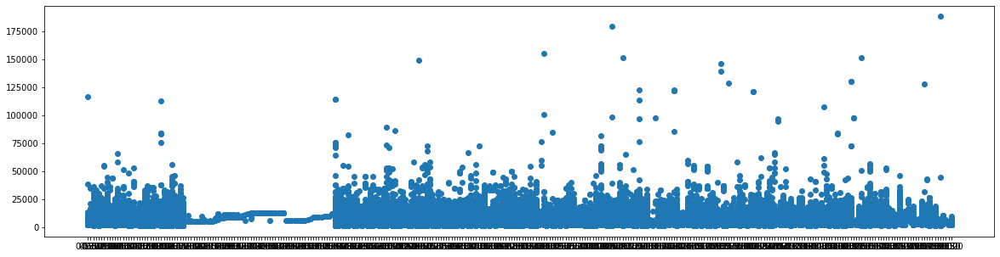

In [62]:
plt.figure(figsize=(20,5))
plt.scatter(df7.dep_time, df7.price)

In [49]:
def f(x):
    if (x > 4) and (x <= 8):
        return 'Early Morning'
    elif (x > 8) and (x <= 12 ):
        return 'Morning'
    elif (x > 12) and (x <= 16):
        return'Noon'
    elif (x > 16) and (x <= 20) :
        return 'Eve'
    elif (x > 20) and (x <= 24):
        return'Night'
    elif (x <= 4):
        return'Late Night'

df7['day_time'] = df7['dep_time'].astype(str).str.split(":", expand=True)[0].astype(int).apply(f)

In [50]:
df7['dep_time'] = df7.dep_time.str.strip()
# df7['dep_time'] = pd.to_datetime(df7['dep_time'], format='%H:%M').dt.time

df7['arr_time'] = df7.arr_time.str.strip()
df7['arr_time'] = df7.arr_time.str.split("+", expand=True)[0]
# df7['arr_time'] = pd.to_datetime(df7['arr_time'], format='%H:%M').dt.time

In [65]:
df7['arr_time'].unique()

array(['06:30', '07:40', '08:00', '17:10', '18:15', '19:55', '21:35',
       '23:05', '23:15', '01:00', '17:40', '11:50', '09:15', '12:30',
       '12:00', '08:50', '18:30', '22:05', '00:05', '00:35', '15:10',
       '06:40', '20:35', '22:25', '18:55', '22:15', '02:50', '22:50',
       '22:00', '17:45', '20:45', '22:30', '07:50', '03:45', '10:45',
       '14:45', '08:30', '16:05', '00:25', '20:05', '18:35', '21:25',
       '08:45', '14:05', '12:05', '20:55', '07:35', '12:15', '11:55',
       '10:30', '17:25', '19:15', '09:05', '01:15', '12:35', '23:40',
       '08:40', '09:00', '15:40', '00:10', '08:55', '18:45', '19:00',
       '10:35', '19:30', '18:50', '22:40', '10:50', '08:15', '17:15',
       '12:10', '07:00', '15:55', '08:05', '19:40', '12:25', '20:10',
       '03:20', '11:15', '13:50', '13:00', '20:15', '22:20', '07:45',
       '16:20', '23:35', '07:25', '22:45', '09:55', '12:40', '23:50',
       '00:15', '21:30', '18:25', '21:10', '23:30', '17:00', '14:00',
       '14:15', '11:

In [66]:
df7.head()

,dep_date,airline,dep_time,duration,stops,arr_time,price,source,destination,dateofbooking,days_to_dep,day_time
0,2022-03-14,IndiGo,04:35,01 h 55 m,0.0,06:30,7308,Mumbai,Chennai,2022-03-13,1,Late Night
1,2022-03-14,Go First,05:50,01 h 50 m,0.0,07:40,7308,Mumbai,Chennai,2022-03-13,1,Early Morning
2,2022-03-14,SpiceJet,06:00,02 h,0.0,08:00,7308,Mumbai,Chennai,2022-03-13,1,Early Morning
3,2022-03-14,IndiGo,15:15,01 h 55 m,0.0,17:10,7308,Mumbai,Chennai,2022-03-13,1,Noon
4,2022-03-14,IndiGo,16:25,01 h 50 m,0.0,18:15,7308,Mumbai,Chennai,2022-03-13,1,Noon


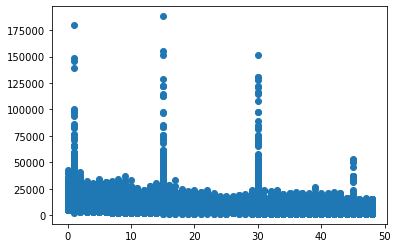

In [67]:
plt.scatter(df7.days_to_dep, df7.price)

<AxesSubplot:>

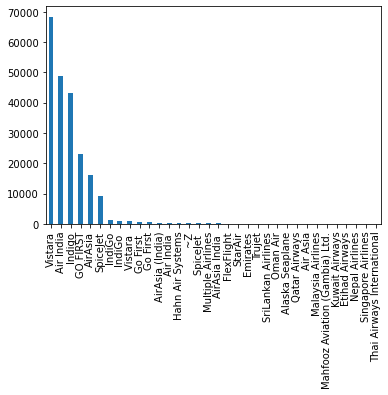

In [68]:
df7['airline'].value_counts().plot.bar()

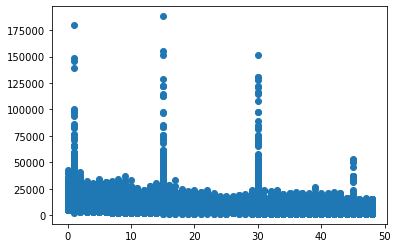

In [69]:
plt.scatter(df7.days_to_dep, df7.price)

<AxesSubplot:>

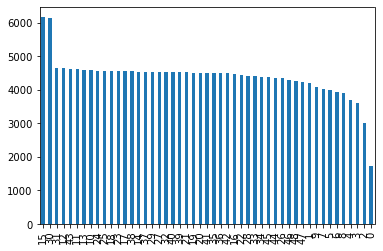

In [70]:
df7['days_to_dep'].value_counts().plot.bar()

[]

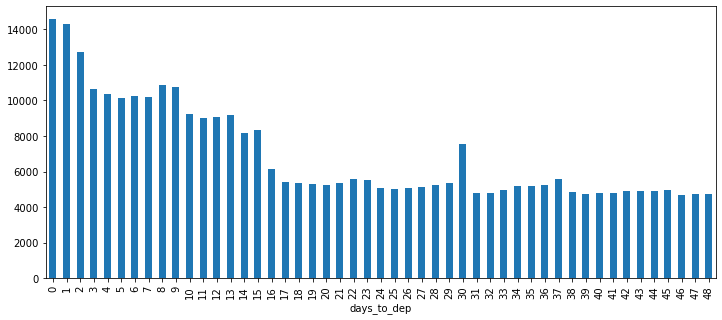

In [71]:
plt.figure(figsize=(12,5))
df7.groupby('days_to_dep')['price'].mean().plot.bar()
plt.plot()

In [72]:
df7.isnull().sum()

dep_date            0
airline             0
dep_time            0
duration            0
stops            2906
arr_time            0
price               0
source              0
destination         0
dateofbooking       0
days_to_dep         0
day_time            0
dtype: int64

<AxesSubplot:xlabel='stops'>

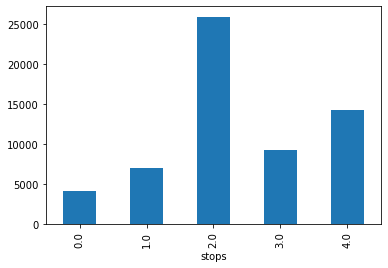

In [73]:
df7.groupby('stops')['price'].mean().plot.bar()

In [51]:
df8 = df7.copy()

In [52]:
df8.isnull().sum()

dep_date            0
airline             0
dep_time            0
duration            0
stops            2906
arr_time            0
price               0
source              0
destination         0
dateofbooking       0
days_to_dep         0
day_time            0
dtype: int64

In [53]:
df8['airline'].value_counts()

Vistara                           68350
Air India                         48928
Indigo                            43120
GO FIRST                          23189
AirAsia                           16100
SpiceJet                           9246
IndiGo                             1112
IndiGo                              975
Vistara                             799
Go First                            535
Go First                            442
AirAsia (India)                     429
Air India                           343
Hahn Air Systems                    312
~Z                                  184
SpiceJet                            150
Multiple Airlines                   123
AirAsia India                       104
FlexFlight                           82
StarAir                              61
Emirates                             47
Trujet                               41
SriLankan Airlines                   20
Oman Air                             18
Alaska Seaplane                      16


In [54]:
df8['airline'] = df8['airline'].str.strip()

In [55]:
df8['airline'] = df8['airline'].replace(to_replace = ['Air Asia','AirAsia (India)','AirAsia India'], value = 'AirAsia')
df8['airline'] = df8['airline'].replace(to_replace = ['Go First','GO FIRST'], value = 'GO FIRST')
df8['airline'] = df8['airline'].replace(to_replace = ['Indigo'], value = 'IndiGo')

In [56]:
df8['airline'].value_counts()

Vistara                           69149
Air India                         49271
IndiGo                            45207
GO FIRST                          24166
AirAsia                           16643
SpiceJet                           9396
Hahn Air Systems                    312
~Z                                  184
Multiple Airlines                   123
FlexFlight                           82
StarAir                              61
Emirates                             47
Trujet                               41
SriLankan Airlines                   20
Oman Air                             18
Alaska Seaplane                      16
Qatar Airways                        10
Malaysia Airlines                     7
Mahfooz Aviation (Gambia) Ltd.        5
Kuwait Airways                        3
Etihad Airways                        3
Nepal Airlines                        3
Singapore Airlines                    3
Thai Airways International            2
Name: airline, dtype: int64

In [57]:
airlines = ['IndiGo', 'GO FIRST', 'SpiceJet', 'Vistara', 'Air India','AirAsia']

In [58]:
df8 = df8[df8.airline.isin(airlines)]

In [59]:
df8.reset_index(inplace=True)

In [60]:
df8

,index,dep_date,airline,dep_time,duration,stops,arr_time,price,source,destination,dateofbooking,days_to_dep,day_time
0,0,2022-03-14,IndiGo,04:35,01 h 55 m,0.0,06:30,7308,Mumbai,Chennai,2022-03-13,1,Late Night
1,1,2022-03-14,GO FIRST,05:50,01 h 50 m,0.0,07:40,7308,Mumbai,Chennai,2022-03-13,1,Early Morning
2,2,2022-03-14,SpiceJet,06:00,02 h,0.0,08:00,7308,Mumbai,Chennai,2022-03-13,1,Early Morning
3,3,2022-03-14,IndiGo,15:15,01 h 55 m,0.0,17:10,7308,Mumbai,Chennai,2022-03-13,1,Noon
4,4,2022-03-14,IndiGo,16:25,01 h 50 m,0.0,18:15,7308,Mumbai,Chennai,2022-03-13,1,Noon
...,...,...,...,...,...,...,...,...,...,...,...,...,...
213827,214768,2022-03-31,Vistara,07:05,13h 50m,1.0,20:55,7697,Chennai,Hyderabad,2022-02-11,48,Early Morning
213828,214769,2022-03-31,Vistara,07:05,13h 50m,1.0,20:55,7709,Chennai,Hyderabad,2022-02-11,48,Early Morning
213829,214770,2022-03-31,Vistara,12:30,20h 35m,1.0,09:05,8640,Chennai,Hyderabad,2022-02-11,48,Morning
213830,214771,2022-03-31,Vistara,09:45,23h 20m,1.0,09:05,8640,Chennai,Hyderabad,2022-02-11,48,Morning


In [61]:
df8.head()

,index,dep_date,airline,dep_time,duration,stops,arr_time,price,source,destination,dateofbooking,days_to_dep,day_time
0,0,2022-03-14,IndiGo,04:35,01 h 55 m,0.0,06:30,7308,Mumbai,Chennai,2022-03-13,1,Late Night
1,1,2022-03-14,GO FIRST,05:50,01 h 50 m,0.0,07:40,7308,Mumbai,Chennai,2022-03-13,1,Early Morning
2,2,2022-03-14,SpiceJet,06:00,02 h,0.0,08:00,7308,Mumbai,Chennai,2022-03-13,1,Early Morning
3,3,2022-03-14,IndiGo,15:15,01 h 55 m,0.0,17:10,7308,Mumbai,Chennai,2022-03-13,1,Noon
4,4,2022-03-14,IndiGo,16:25,01 h 50 m,0.0,18:15,7308,Mumbai,Chennai,2022-03-13,1,Noon


<AxesSubplot:xlabel='day_time'>

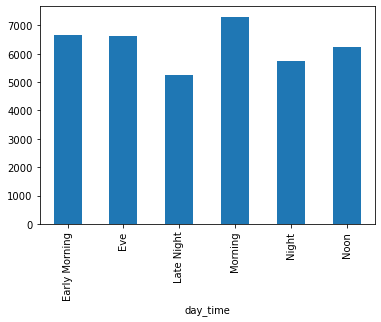

In [62]:
df8.groupby('day_time')['price'].mean().plot.bar()

<AxesSubplot:>

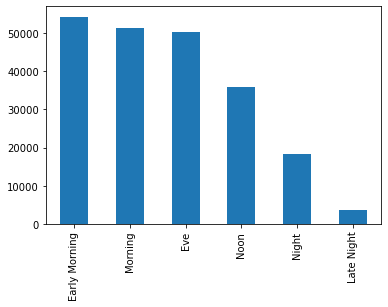

In [63]:
df8['day_time'].value_counts().plot.bar()

In [278]:
df8['duration'].unique()

array(['01 h 55 m ', '01 h 50 m ', '02 h ', '02 h 05 m ', '04 h 55 m ',
       '07 h 10 m ', '01 h 35 m ', '01 h 45 m ', '03 h 40 m ',
       '09 h 15 m ', '05 h 35 m ', '03 h 45 m ', '04 h ', '01 h 40 m ',
       '6h 35m', '7h 55m', '8h 5m', '9h 5m', '9h 55m', '10h 50m',
       '1h 20m', '1h 25m', '1h 30m', '12h 35m', '1h 35m', '14h 25m',
       '16h 55m', '17h 55m', '19h 55m', '1d 1h 55m', '4h 40m', '13h',
       '15h 30m', '16h 30m', '18h 30m', '1d 30m', '1d 3h 30m', '15h 5m',
       '8h 40m', '23h 55m', '14h 30m', '12h 5m', '3h 25m', '13h 50m',
       '14h 40m', '15h 40m', '16h 50m', '18h 5m', '19h', '20h 50m',
       '21h 10m', '21h 55m', '22h', '23h', '1d 10m', '1d 40m', '1h 45m',
       '1h 50m', '1h 55m', '3h 40m', '4h 5m', '4h 25m', '5h 10m',
       '6h 45m', '7h 30m', '9h 15m', '9h 30m', '17h 30m', '21h 25m',
       '1h 40m', '8h 10m', '10h 5m', '11h 25m', '13h 5m', '13h 55m',
       '14h 10m', '14h 55m', '17h 10m', '22h 55m', '1d 2h 40m',
       '1d 5h 10m', '3h 45m', '1d 1h

In [279]:
df8['duration'].str.split('h')[0]

['01 ', ' 55 m ']

In [280]:
df8.head()

,index,dep_date,airline,dep_time,duration,stops,arr_time,price,source,destination,dateofbooking,days_to_dep,day_time
0,0,2022-03-14,IndiGo,04:35,01 h 55 m,0.0,06:30,7308,Mumbai,Chennai,2022-03-13,1,Late Night
1,1,2022-03-14,GO FIRST,05:50,01 h 50 m,0.0,07:40,7308,Mumbai,Chennai,2022-03-13,1,Early Morning
2,2,2022-03-14,SpiceJet,06:00,02 h,0.0,08:00,7308,Mumbai,Chennai,2022-03-13,1,Early Morning
3,3,2022-03-14,IndiGo,15:15,01 h 55 m,0.0,17:10,7308,Mumbai,Chennai,2022-03-13,1,Noon
4,4,2022-03-14,IndiGo,16:25,01 h 50 m,0.0,18:15,7308,Mumbai,Chennai,2022-03-13,1,Noon


In [64]:
dur_list = list(df8['duration'])
# print(dur_list)

In [65]:
res=dur_list.copy()
for i in range(len(dur_list)):
    if 'd' in dur_list[i]:
        res[i] = dur_list[i].split('d')[1].strip()
        if 'h' in dur_list[i]:
            dur_list[i] = str(int(dur_list[i].split('d')[0].strip())*24) + 'h' + res[i].split('h')[0].strip() + 'h'
        elif 'm' in dur_list[i]:
            dur_list[i] = str(int(dur_list[i].split('d')[0].strip())*24) + 'h' + res[i].split('m')[0].strip()
    elif 'h' in dur_list[i]:
        res[i] = dur_list[i].split('h')[1].strip()
        dur_list[i] = dur_list[i].split('h')[0].strip() + 'h' + res[i].split('m')[0].strip()
    else:
        dur_list[i] = dur_list[i].split('m')[0].strip()

In [66]:
df8['d3'] = dur_list

In [284]:
df8['d3'].unique()

array(['01h55', '01h50', '02h', '02h05', '04h55', '07h10', '01h35',
       '01h45', '03h40', '09h15', '05h35', '03h45', '04h', '01h40',
       '6h35', '7h55', '8h5', '9h5', '9h55', '10h50', '1h20', '1h25',
       '1h30', '12h35', '1h35', '14h25', '16h55', '17h55', '19h55',
       '24h1h', '4h40', '13h', '15h30', '16h30', '18h30', '24h30',
       '24h3h', '15h5', '8h40', '23h55', '14h30', '12h5', '3h25', '13h50',
       '14h40', '15h40', '16h50', '18h5', '19h', '20h50', '21h10',
       '21h55', '22h', '23h', '24h10', '24h40', '1h45', '1h50', '1h55',
       '3h40', '4h5', '4h25', '5h10', '6h45', '7h30', '9h15', '9h30',
       '17h30', '21h25', '1h40', '8h10', '10h5', '11h25', '13h5', '13h55',
       '14h10', '14h55', '17h10', '22h55', '24h2h', '24h5h', '3h45',
       '5h15', '4h', '22h35', '24h4h', '4h20', '13h30', '14h45', '17h15',
       '18h15', '20h15', '3h55', '6h25', '6h55', '10h15', '10h45',
       '11h45', '12h55', '16h5', '1h', '1h15', '1h5', '4h50', '4h15',
       '5h50', '7h15

In [67]:
df9 = df8.d3.str.split('h', expand=True)

In [68]:
df9.iloc[200:250]

,0,1,2
200,10,15,None
201,8,45,None
202,12,15,None
203,12,,None
204,11,15,None
205,11,10,None
206,10,10,None
207,12,45,None
208,9,40,None
209,13,55,None


In [287]:
df8.d3.unique()

array(['01h55', '01h50', '02h', '02h05', '04h55', '07h10', '01h35',
       '01h45', '03h40', '09h15', '05h35', '03h45', '04h', '01h40',
       '6h35', '7h55', '8h5', '9h5', '9h55', '10h50', '1h20', '1h25',
       '1h30', '12h35', '1h35', '14h25', '16h55', '17h55', '19h55',
       '24h1h', '4h40', '13h', '15h30', '16h30', '18h30', '24h30',
       '24h3h', '15h5', '8h40', '23h55', '14h30', '12h5', '3h25', '13h50',
       '14h40', '15h40', '16h50', '18h5', '19h', '20h50', '21h10',
       '21h55', '22h', '23h', '24h10', '24h40', '1h45', '1h50', '1h55',
       '3h40', '4h5', '4h25', '5h10', '6h45', '7h30', '9h15', '9h30',
       '17h30', '21h25', '1h40', '8h10', '10h5', '11h25', '13h5', '13h55',
       '14h10', '14h55', '17h10', '22h55', '24h2h', '24h5h', '3h45',
       '5h15', '4h', '22h35', '24h4h', '4h20', '13h30', '14h45', '17h15',
       '18h15', '20h15', '3h55', '6h25', '6h55', '10h15', '10h45',
       '11h45', '12h55', '16h5', '1h', '1h15', '1h5', '4h50', '4h15',
       '5h50', '7h15

In [69]:
df9 = df9.drop([2], axis=1)

In [70]:
df9 = df9.replace(['',np.nan], float(0))

In [71]:
df9['duration'] = round((df9[0].astype(float) + df9[1].astype(float)/60), 2)

In [72]:
df8 = df8.drop(['d3'], axis=1)

In [73]:
df8['duration_h'] = df9['duration']

In [74]:
df8.isnull().sum()

index               0
dep_date            0
airline             0
dep_time            0
duration            0
stops            2906
arr_time            0
price               0
source              0
destination         0
dateofbooking       0
days_to_dep         0
day_time            0
duration_h          0
dtype: int64

In [75]:
df8

,index,dep_date,airline,dep_time,duration,stops,arr_time,price,source,destination,dateofbooking,days_to_dep,day_time,duration_h
0,0,2022-03-14,IndiGo,04:35,01 h 55 m,0.0,06:30,7308,Mumbai,Chennai,2022-03-13,1,Late Night,1.92
1,1,2022-03-14,GO FIRST,05:50,01 h 50 m,0.0,07:40,7308,Mumbai,Chennai,2022-03-13,1,Early Morning,1.83
2,2,2022-03-14,SpiceJet,06:00,02 h,0.0,08:00,7308,Mumbai,Chennai,2022-03-13,1,Early Morning,2.00
3,3,2022-03-14,IndiGo,15:15,01 h 55 m,0.0,17:10,7308,Mumbai,Chennai,2022-03-13,1,Noon,1.92
4,4,2022-03-14,IndiGo,16:25,01 h 50 m,0.0,18:15,7308,Mumbai,Chennai,2022-03-13,1,Noon,1.83
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
213827,214768,2022-03-31,Vistara,07:05,13h 50m,1.0,20:55,7697,Chennai,Hyderabad,2022-02-11,48,Early Morning,13.83
213828,214769,2022-03-31,Vistara,07:05,13h 50m,1.0,20:55,7709,Chennai,Hyderabad,2022-02-11,48,Early Morning,13.83
213829,214770,2022-03-31,Vistara,12:30,20h 35m,1.0,09:05,8640,Chennai,Hyderabad,2022-02-11,48,Morning,20.58
213830,214771,2022-03-31,Vistara,09:45,23h 20m,1.0,09:05,8640,Chennai,Hyderabad,2022-02-11,48,Morning,23.33


In [76]:
df8['arr_day_time'] = df8['arr_time'].astype(str).str.split(":", expand=True)[0].astype(int).apply(f)

In [77]:
df8

,index,dep_date,airline,dep_time,duration,stops,arr_time,price,source,destination,dateofbooking,days_to_dep,day_time,duration_h,arr_day_time
0,0,2022-03-14,IndiGo,04:35,01 h 55 m,0.0,06:30,7308,Mumbai,Chennai,2022-03-13,1,Late Night,1.92,Early Morning
1,1,2022-03-14,GO FIRST,05:50,01 h 50 m,0.0,07:40,7308,Mumbai,Chennai,2022-03-13,1,Early Morning,1.83,Early Morning
2,2,2022-03-14,SpiceJet,06:00,02 h,0.0,08:00,7308,Mumbai,Chennai,2022-03-13,1,Early Morning,2.00,Early Morning
3,3,2022-03-14,IndiGo,15:15,01 h 55 m,0.0,17:10,7308,Mumbai,Chennai,2022-03-13,1,Noon,1.92,Eve
4,4,2022-03-14,IndiGo,16:25,01 h 50 m,0.0,18:15,7308,Mumbai,Chennai,2022-03-13,1,Noon,1.83,Eve
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
213827,214768,2022-03-31,Vistara,07:05,13h 50m,1.0,20:55,7697,Chennai,Hyderabad,2022-02-11,48,Early Morning,13.83,Eve
213828,214769,2022-03-31,Vistara,07:05,13h 50m,1.0,20:55,7709,Chennai,Hyderabad,2022-02-11,48,Early Morning,13.83,Eve
213829,214770,2022-03-31,Vistara,12:30,20h 35m,1.0,09:05,8640,Chennai,Hyderabad,2022-02-11,48,Morning,20.58,Morning
213830,214771,2022-03-31,Vistara,09:45,23h 20m,1.0,09:05,8640,Chennai,Hyderabad,2022-02-11,48,Morning,23.33,Morning


<AxesSubplot:>

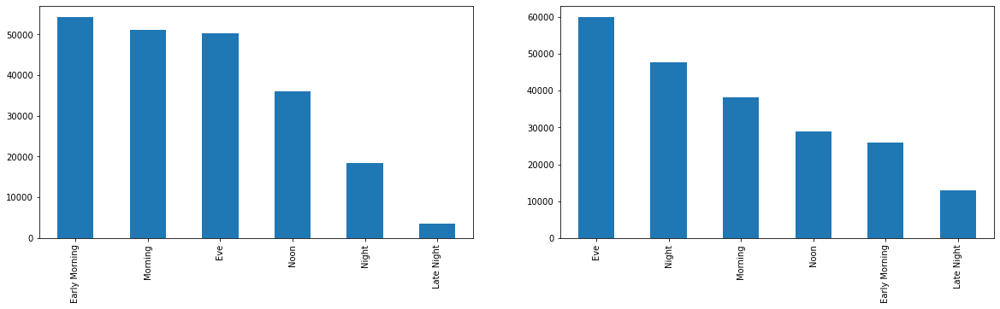

In [78]:
plt.figure(figsize=(20,5))
plt.subplot(1,2,1)
df8.day_time.value_counts().plot.bar()
plt.subplot(1,2,2)
df8.arr_day_time.value_counts().plot.bar()

<AxesSubplot:>

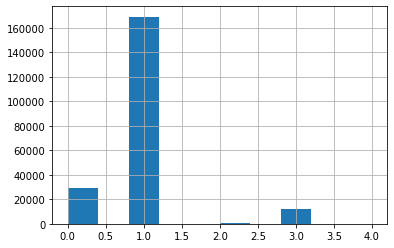

In [241]:
df8.stops.hist(bins=10)

In [79]:
df8.stops = df8['stops'].fillna(df8.stops.median())

<AxesSubplot:>

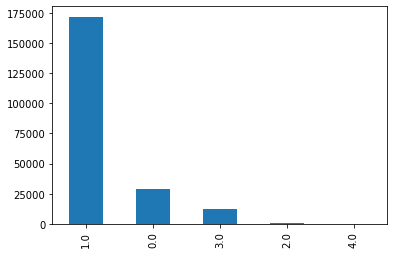

In [80]:
df8.stops.value_counts().plot.bar()

In [81]:
df8.stops.value_counts()

1.0    171850
0.0     28966
3.0     12319
2.0       688
4.0         9
Name: stops, dtype: int64

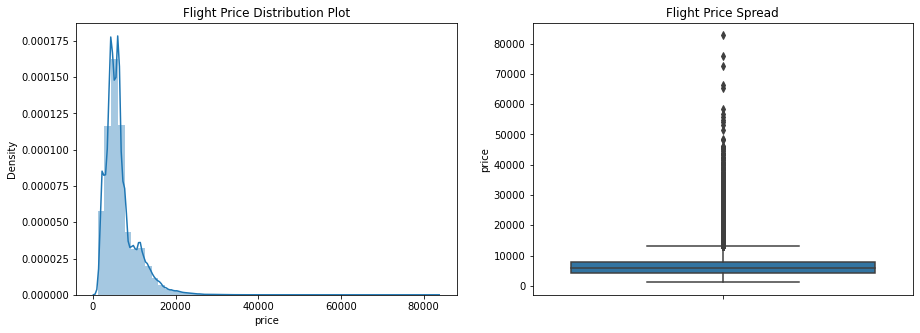

In [302]:
plt.figure(figsize=(15,5))

plt.subplot(1,2,1)
plt.title('Flight Price Distribution Plot')
sns.distplot(df8.price)

plt.subplot(1,2,2)
plt.title('Flight Price Spread')
sns.boxplot(y=df8.price)

plt.show()

<AxesSubplot:xlabel='airline'>

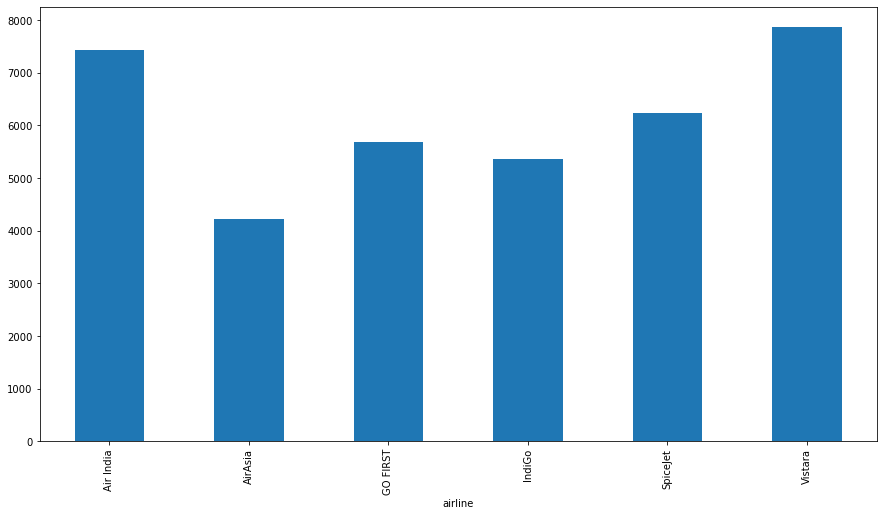

In [303]:
plt.figure(figsize=(15, 8))
df8.groupby('airline')['price'].mean().plot.bar()

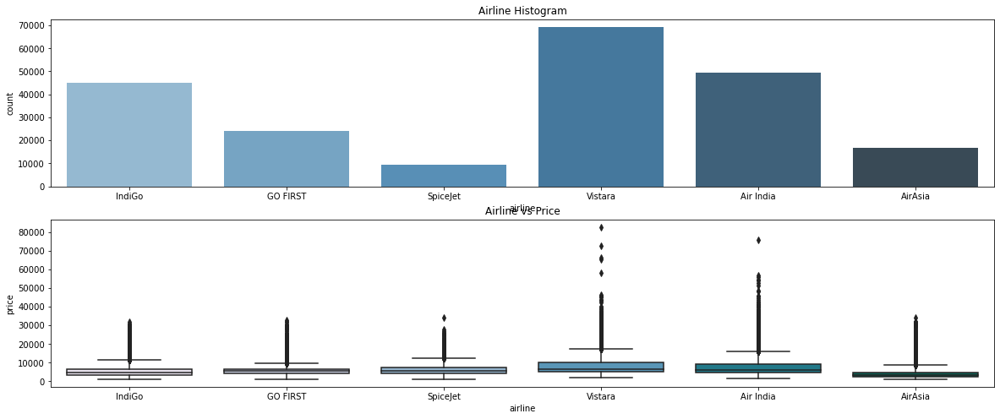

In [121]:
plt.figure(figsize=(20,8))

plt.subplot(2,1,1)
plt.title('Airline Histogram')
sns.countplot(df8.airline, palette=("Blues_d"))

plt.subplot(2,1,2)
plt.title('Airline vs Price')
sns.boxplot(x=df8.airline, y=df8.price, palette=("PuBuGn"))

plt.show()

In [122]:
gby1 = df8.groupby(['source', 'destination', 'days_to_dep'])['price'].mean()
gby1.head(60)

source     destination  days_to_dep
Bangalore  Chennai      0              15478.878788
                        1              16074.196429
                        2              13756.047619
                        3              12409.484848
                        4              12159.291139
                        5              11050.175676
                        6              11310.492537
                        7              11886.338028
                        8              13167.134146
                        9              11966.904110
                        10             10728.906977
                        11             10715.089888
                        12             10686.705882
                        13             10958.098765
                        14             10716.666667
                        15              8153.079710
                        16              6609.500000
                        17              5504.090909
                        18  

In [92]:
gby1 = gby1.reset_index()

In [93]:
gby1['combined_col'] = gby1['source'] + '_' + gby1['destination']

In [94]:
gby1.combined_col.nunique()

34

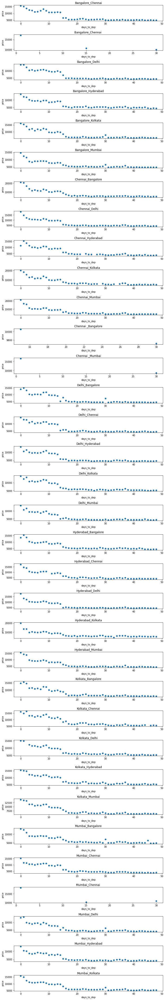

In [95]:
plt.figure(figsize=(10,60))
for indx, val in enumerate(gby1.combined_col.unique()):
    plt.subplot(34,1,indx+1)
    temp_df = gby1.loc[gby1['combined_col'] == val]
    plt.scatter(temp_df['days_to_dep'], temp_df['price'])
    plt.title(val)
    plt.xlabel('days_to_dep')
    plt.ylabel('price')

plt.tight_layout()

In [96]:
df8['price_per_minute'] = df8['price']/df8['duration_h']*60

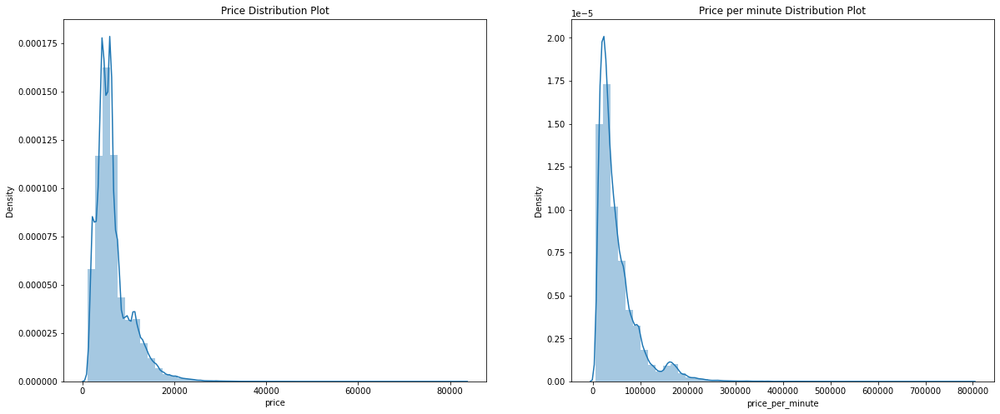

In [101]:
plt.figure(figsize=(20,8))

plt.subplot(1,2,1)
plt.title('Price Distribution Plot')
sns.distplot(df8.price)

plt.subplot(1,2,2)
plt.title('Price per minute Distribution Plot')
sns.distplot(df8.price_per_minute)

plt.show()

In [82]:
df8.source = df8.source.str.strip()
df8.destination = df8.destination.str.strip()

<AxesSubplot:xlabel='destination', ylabel='count'>

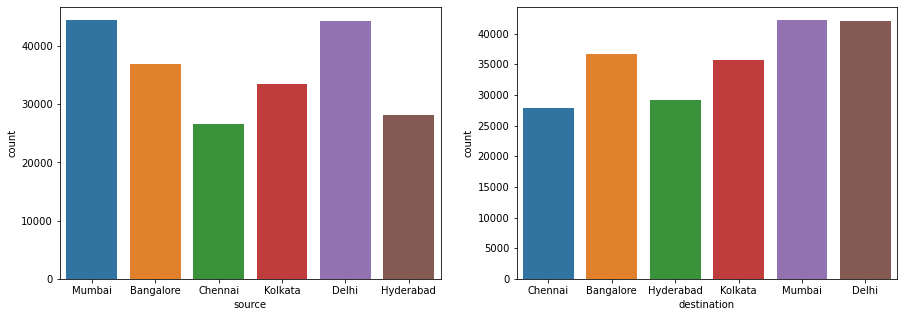

In [83]:
plt.figure(figsize=(15,5))
plt.subplot(1,2,1)
sns.countplot(x='source',data=df8)
plt.subplot(1,2,2)
sns.countplot(x='destination',data=df8)

In [84]:
df10 = df8.copy()

In [85]:
def days_left_cat(row):  
    if row['days_to_dep'] >= 0 and row['days_to_dep'] < 3:
        return '0-2 Days'
    elif row['days_to_dep'] >= 3 and row['days_to_dep'] <= 10:
        return '3-9 Days'
    elif row['days_to_dep'] >= 11  and row['days_to_dep'] <= 15:
        return '11-15 Days'
    elif row['days_to_dep'] > 15  and row['days_to_dep'] <= 48:
        return '15-48 Days'

In [86]:
df10['days_left_cat'] = df10.apply(lambda row: days_left_cat(row), axis = 1)

In [87]:
df10

,index,dep_date,airline,dep_time,duration,stops,arr_time,price,source,destination,dateofbooking,days_to_dep,day_time,duration_h,arr_day_time,days_left_cat
0,0,2022-03-14,IndiGo,04:35,01 h 55 m,0.0,06:30,7308,Mumbai,Chennai,2022-03-13,1,Late Night,1.92,Early Morning,0-2 Days
1,1,2022-03-14,GO FIRST,05:50,01 h 50 m,0.0,07:40,7308,Mumbai,Chennai,2022-03-13,1,Early Morning,1.83,Early Morning,0-2 Days
2,2,2022-03-14,SpiceJet,06:00,02 h,0.0,08:00,7308,Mumbai,Chennai,2022-03-13,1,Early Morning,2.00,Early Morning,0-2 Days
3,3,2022-03-14,IndiGo,15:15,01 h 55 m,0.0,17:10,7308,Mumbai,Chennai,2022-03-13,1,Noon,1.92,Eve,0-2 Days
4,4,2022-03-14,IndiGo,16:25,01 h 50 m,0.0,18:15,7308,Mumbai,Chennai,2022-03-13,1,Noon,1.83,Eve,0-2 Days
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
213827,214768,2022-03-31,Vistara,07:05,13h 50m,1.0,20:55,7697,Chennai,Hyderabad,2022-02-11,48,Early Morning,13.83,Eve,15-48 Days
213828,214769,2022-03-31,Vistara,07:05,13h 50m,1.0,20:55,7709,Chennai,Hyderabad,2022-02-11,48,Early Morning,13.83,Eve,15-48 Days
213829,214770,2022-03-31,Vistara,12:30,20h 35m,1.0,09:05,8640,Chennai,Hyderabad,2022-02-11,48,Morning,20.58,Morning,15-48 Days
213830,214771,2022-03-31,Vistara,09:45,23h 20m,1.0,09:05,8640,Chennai,Hyderabad,2022-02-11,48,Morning,23.33,Morning,15-48 Days


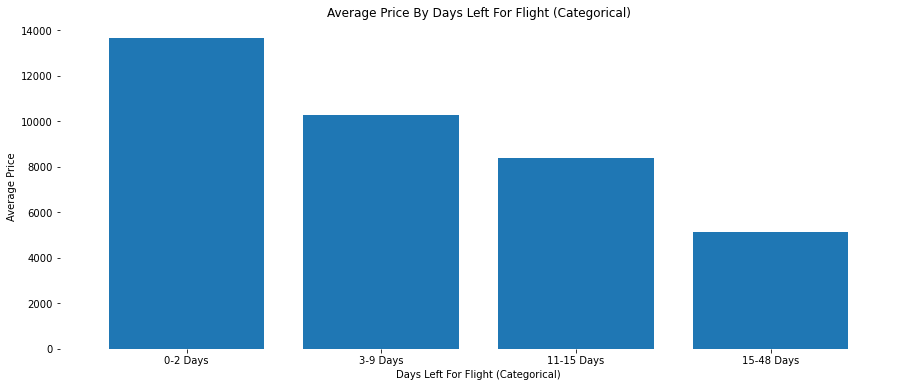

In [88]:
fig, ax = plt.subplots(figsize=(15, 6))
df10.groupby(['days_left_cat'])['price'].mean().sort_values(ascending=False).plot(kind = 'bar', width= 0.8)#, color = (0.99,0.82,0.011),  edgecolor = (0.98,0.66,0.01))
ax.set(title = "Average Price By Days Left For Flight (Categorical)",
       xlabel = "Days Left For Flight (Categorical)",
       ylabel = "Average Price")
plt.setp(ax.get_xticklabels(), rotation = 0)
plt.box(False)
plt.show()

In [89]:
df10.groupby(['days_left_cat'])['price'].mean().sort_values(ascending = False)

days_left_cat
0-2 Days      13660.556322
3-9 Days      10283.965443
11-15 Days     8411.154700
15-48 Days     5139.853079
Name: price, dtype: float64

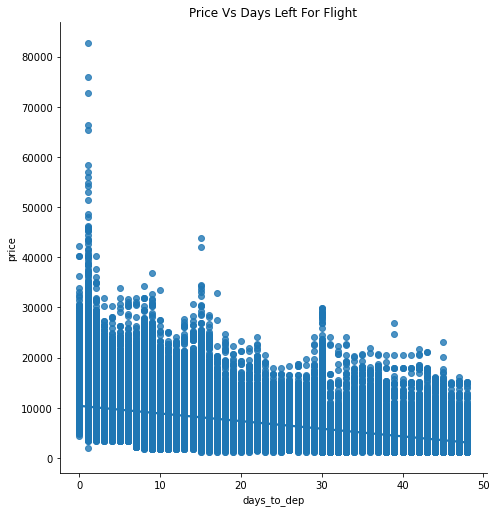

In [131]:
fig=sns.lmplot(data=df10,x="days_to_dep",y="price", height=7)
plt.title('Price Vs Days Left For Flight')
plt.show(fig)

In [109]:
import statsmodels.api as sm

In [110]:
days_left1 = sm.add_constant(df10['days_to_dep'], prepend=False)
model = sm.OLS(df10['price'], days_left1)
res = model.fit()
print(res.summary())

                            OLS Regression Results                            
Dep. Variable:                  price   R-squared:                       0.285
Model:                            OLS   Adj. R-squared:                  0.285
Method:                 Least Squares   F-statistic:                 8.544e+04
Date:                Tue, 03 May 2022   Prob (F-statistic):               0.00
Time:                        23:33:38   Log-Likelihood:            -2.0346e+06
No. Observations:              213832   AIC:                         4.069e+06
Df Residuals:                  213830   BIC:                         4.069e+06
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                  coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------
days_to_dep  -152.1154      0.520   -292.295      

In [111]:
# dur_mins1 = sm.add_constant(df10['duration_h'], prepend=False)
# model = sm.OLS(df10['price'], dur_mins1)
# res = model.fit()
# print(res.summary())

MissingDataError: exog contains inf or nans

In [91]:
df10.isnull().sum()

index            0
dep_date         0
airline          0
dep_time         0
duration         0
stops            0
arr_time         0
price            0
source           0
destination      0
dateofbooking    0
days_to_dep      0
day_time         0
duration_h       0
arr_day_time     0
days_left_cat    0
dtype: int64

<AxesSubplot:>

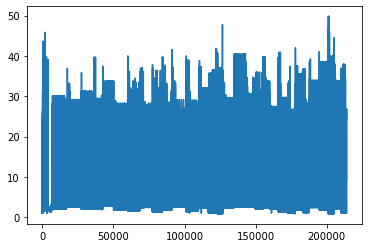

In [160]:
df10['duration_h'].plot()

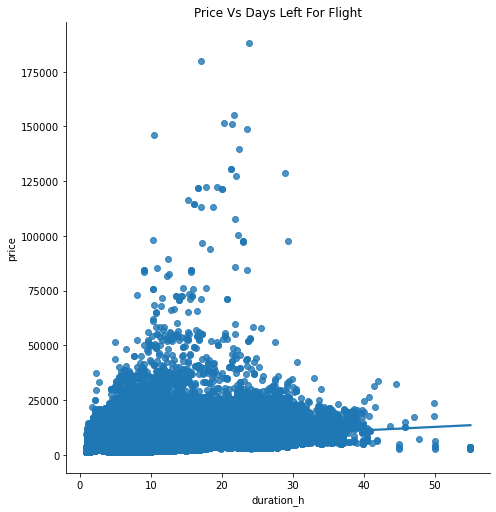

In [121]:
fig=sns.lmplot(data=df10,x="duration_h",y="price", height=7)
plt.title('Price Vs Days Left For Flight')
plt.show(fig)

In [122]:
df10

,dep_date,airline,dep_time,duration,stops,arr_time,price,source,destination,dateofbooking,days_to_dep,day_time,duration_h,arr_day_time,days_left_cat
0,2022-03-14,IndiGo,04:35,01 h 55 m,0.0,06:30,7308,Mumbai,Chennai,2022-03-13,1,Late Night,1.92,Early Morning,1-3 Days
1,2022-03-14,Go First,05:50,01 h 50 m,0.0,07:40,7308,Mumbai,Chennai,2022-03-13,1,Early Morning,1.83,Early Morning,1-3 Days
2,2022-03-14,SpiceJet,06:00,02 h,0.0,08:00,7308,Mumbai,Chennai,2022-03-13,1,Early Morning,2.00,Early Morning,1-3 Days
3,2022-03-14,IndiGo,15:15,01 h 55 m,0.0,17:10,7308,Mumbai,Chennai,2022-03-13,1,Noon,1.92,Eve,1-3 Days
4,2022-03-14,IndiGo,16:25,01 h 50 m,0.0,18:15,7308,Mumbai,Chennai,2022-03-13,1,Noon,1.83,Eve,1-3 Days
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
214768,2022-03-31,Vistara,07:05,13h 50m,1.0,20:55,7697,Chennai,Hyderabad,2022-02-11,48,Early Morning,13.83,Eve,15-49 Days
214769,2022-03-31,Vistara,07:05,13h 50m,1.0,20:55,7709,Chennai,Hyderabad,2022-02-11,48,Early Morning,13.83,Eve,15-49 Days
214770,2022-03-31,Vistara,12:30,20h 35m,1.0,09:05,8640,Chennai,Hyderabad,2022-02-11,48,Morning,20.58,Morning,15-49 Days
214771,2022-03-31,Vistara,09:45,23h 20m,1.0,09:05,8640,Chennai,Hyderabad,2022-02-11,48,Morning,23.33,Morning,15-49 Days


<AxesSubplot:xlabel='day_time'>

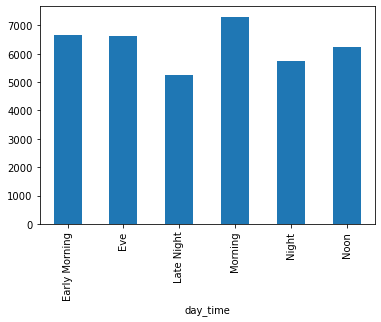

In [133]:
df10.groupby('day_time')['price'].mean().plot.bar()

In [134]:
df10.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 213832 entries, 0 to 213831
Data columns (total 16 columns):
 #   Column         Non-Null Count   Dtype         
---  ------         --------------   -----         
 0   index          213832 non-null  int64         
 1   dep_date       213832 non-null  datetime64[ns]
 2   airline        213832 non-null  object        
 3   dep_time       213832 non-null  object        
 4   duration       213832 non-null  object        
 5   stops          213832 non-null  float64       
 6   arr_time       213832 non-null  object        
 7   price          213832 non-null  int64         
 8   source         213832 non-null  object        
 9   destination    213832 non-null  object        
 10  dateofbooking  213832 non-null  datetime64[ns]
 11  days_to_dep    213832 non-null  int64         
 12  day_time       213832 non-null  object        
 13  duration_h     213832 non-null  float64       
 14  arr_day_time   213832 non-null  object        
 15  

In [135]:
df10.isnull().sum()

index            0
dep_date         0
airline          0
dep_time         0
duration         0
stops            0
arr_time         0
price            0
source           0
destination      0
dateofbooking    0
days_to_dep      0
day_time         0
duration_h       0
arr_day_time     0
days_left_cat    0
dtype: int64

In [313]:
df10.dtypes

index                     int64
dep_date         datetime64[ns]
airline                  object
dep_time                 object
duration                 object
stops                   float64
arr_time                 object
price                     int64
source                   object
destination              object
dateofbooking    datetime64[ns]
days_to_dep               int64
day_time                 object
duration_h              float64
arr_day_time             object
days_left_cat            object
dtype: object

In [92]:
df10['stops'] = df10['stops'].astype(int)

In [93]:
df10['day_time'] = 'dep_' + df10['day_time']

In [94]:
df10['arr_day_time'] = 'arr_' + df10['arr_day_time']

In [95]:
df_final = df10.copy()

In [96]:
df_final

,index,dep_date,airline,dep_time,duration,stops,arr_time,price,source,destination,dateofbooking,days_to_dep,day_time,duration_h,arr_day_time,days_left_cat
0,0,2022-03-14,IndiGo,04:35,01 h 55 m,0,06:30,7308,Mumbai,Chennai,2022-03-13,1,dep_Late Night,1.92,arr_Early Morning,0-2 Days
1,1,2022-03-14,GO FIRST,05:50,01 h 50 m,0,07:40,7308,Mumbai,Chennai,2022-03-13,1,dep_Early Morning,1.83,arr_Early Morning,0-2 Days
2,2,2022-03-14,SpiceJet,06:00,02 h,0,08:00,7308,Mumbai,Chennai,2022-03-13,1,dep_Early Morning,2.00,arr_Early Morning,0-2 Days
3,3,2022-03-14,IndiGo,15:15,01 h 55 m,0,17:10,7308,Mumbai,Chennai,2022-03-13,1,dep_Noon,1.92,arr_Eve,0-2 Days
4,4,2022-03-14,IndiGo,16:25,01 h 50 m,0,18:15,7308,Mumbai,Chennai,2022-03-13,1,dep_Noon,1.83,arr_Eve,0-2 Days
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
213827,214768,2022-03-31,Vistara,07:05,13h 50m,1,20:55,7697,Chennai,Hyderabad,2022-02-11,48,dep_Early Morning,13.83,arr_Eve,15-48 Days
213828,214769,2022-03-31,Vistara,07:05,13h 50m,1,20:55,7709,Chennai,Hyderabad,2022-02-11,48,dep_Early Morning,13.83,arr_Eve,15-48 Days
213829,214770,2022-03-31,Vistara,12:30,20h 35m,1,09:05,8640,Chennai,Hyderabad,2022-02-11,48,dep_Morning,20.58,arr_Morning,15-48 Days
213830,214771,2022-03-31,Vistara,09:45,23h 20m,1,09:05,8640,Chennai,Hyderabad,2022-02-11,48,dep_Morning,23.33,arr_Morning,15-48 Days


In [97]:
df_final.drop(['dep_date','dep_time','duration','arr_time','dateofbooking','days_to_dep','index'], axis=1, inplace=True)

In [98]:
df_final_copy = df_final.copy()

In [99]:
df_final = df_final_copy.copy()

In [100]:
from sklearn import preprocessing

In [101]:
df_final['source'] = df_final['source'].str.strip()

In [102]:
df_final['source'] = 'source_' + df_final['source']

In [103]:
df_final['destination'] = 'destination_' + df_final['destination']

In [104]:
categorical_data = ['airline','source','destination','days_left_cat','day_time','arr_day_time']

In [105]:
df_final.source.unique()

array(['source_Mumbai', 'source_Bangalore', 'source_Chennai',
       'source_Kolkata', 'source_Delhi', 'source_Hyderabad'], dtype=object)

In [106]:
df_final.destination.unique()

array(['destination_Chennai', 'destination_Bangalore',
       'destination_Hyderabad', 'destination_Kolkata',
       'destination_Mumbai', 'destination_Delhi'], dtype=object)

In [107]:
days_left_cat = pd.get_dummies(df_final['days_left_cat'], drop_first=True)
airline = pd.get_dummies(df_final['airline'], drop_first=True)
source = pd.get_dummies(df_final['source'], drop_first=True)
destination = pd.get_dummies(df_final['destination'], drop_first=True)
day_time = pd.get_dummies(df_final['day_time'], drop_first=True)
arr_day_time = pd.get_dummies(df_final['arr_day_time'], drop_first=True)

In [108]:
df_final

,airline,stops,price,source,destination,day_time,duration_h,arr_day_time,days_left_cat
0,IndiGo,0,7308,source_Mumbai,destination_Chennai,dep_Late Night,1.92,arr_Early Morning,0-2 Days
1,GO FIRST,0,7308,source_Mumbai,destination_Chennai,dep_Early Morning,1.83,arr_Early Morning,0-2 Days
2,SpiceJet,0,7308,source_Mumbai,destination_Chennai,dep_Early Morning,2.00,arr_Early Morning,0-2 Days
3,IndiGo,0,7308,source_Mumbai,destination_Chennai,dep_Noon,1.92,arr_Eve,0-2 Days
4,IndiGo,0,7308,source_Mumbai,destination_Chennai,dep_Noon,1.83,arr_Eve,0-2 Days
...,...,...,...,...,...,...,...,...,...
213827,Vistara,1,7697,source_Chennai,destination_Hyderabad,dep_Early Morning,13.83,arr_Eve,15-48 Days
213828,Vistara,1,7709,source_Chennai,destination_Hyderabad,dep_Early Morning,13.83,arr_Eve,15-48 Days
213829,Vistara,1,8640,source_Chennai,destination_Hyderabad,dep_Morning,20.58,arr_Morning,15-48 Days
213830,Vistara,1,8640,source_Chennai,destination_Hyderabad,dep_Morning,23.33,arr_Morning,15-48 Days


In [109]:
df_final = pd.concat([df_final,airline,source,destination,days_left_cat,day_time,arr_day_time], axis=1)

In [110]:
df_final.drop(['airline','source','destination','days_left_cat','day_time','arr_day_time'], axis=1, inplace=True)

In [111]:
df_final

,stops,price,duration_h,AirAsia,GO FIRST,IndiGo,SpiceJet,Vistara,source_Chennai,source_Delhi,source_Hyderabad,source_Kolkata,source_Mumbai,destination_Chennai,destination_Delhi,destination_Hyderabad,destination_Kolkata,destination_Mumbai,11-15 Days,15-48 Days,3-9 Days,dep_Eve,dep_Late Night,dep_Morning,dep_Night,dep_Noon,arr_Eve,arr_Late Night,arr_Morning,arr_Night,arr_Noon
0,0,7308,1.92,0,0,1,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0
1,0,7308,1.83,0,1,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,0,7308,2.00,0,0,0,1,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,0,7308,1.92,0,0,1,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0
4,0,7308,1.83,0,0,1,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
213827,1,7697,13.83,0,0,0,0,1,1,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0
213828,1,7709,13.83,0,0,0,0,1,1,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0
213829,1,8640,20.58,0,0,0,0,1,1,0,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0
213830,1,8640,23.33,0,0,0,0,1,1,0,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0


In [114]:
df_final.columns

Index(['stops', 'price', 'duration_h', 'AirAsia', 'GO FIRST', 'IndiGo',
       'SpiceJet', 'Vistara', 'source_Chennai', 'source_Delhi',
       'source_Hyderabad', 'source_Kolkata', 'source_Mumbai',
       'destination_Chennai', 'destination_Delhi', 'destination_Hyderabad',
       'destination_Kolkata', 'destination_Mumbai', '11-15 Days', '15-48 Days',
       '3-9 Days', 'dep_Eve', 'dep_Late Night', 'dep_Morning', 'dep_Night',
       'dep_Noon', 'arr_Eve', 'arr_Late Night', 'arr_Morning', 'arr_Night',
       'arr_Noon'],
      dtype='object')

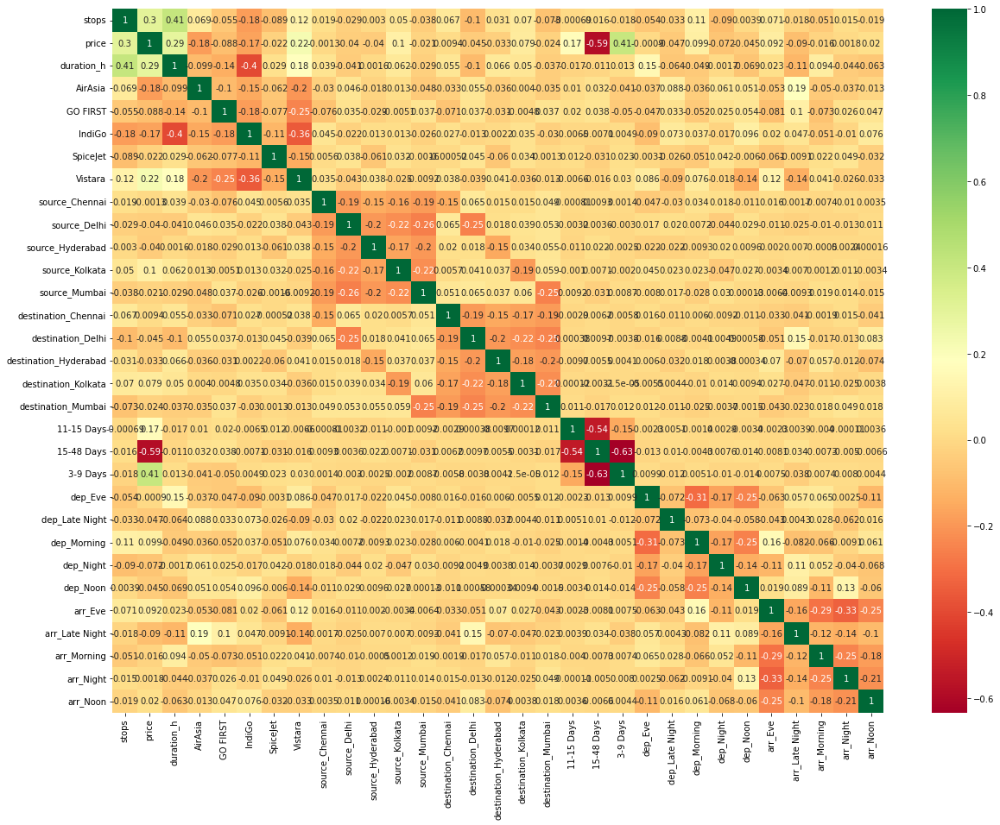

In [185]:
plt.figure(figsize=(20,15))

sns.heatmap(df_final.corr(), annot=True, cmap='RdYlGn')
plt.show()

In [118]:
from sklearn.ensemble import ExtraTreesRegressor
selection = ExtraTreesRegressor()
selection.fit(X, y)

print(selection.feature_importances_)

NameError: name 'X' is not defined

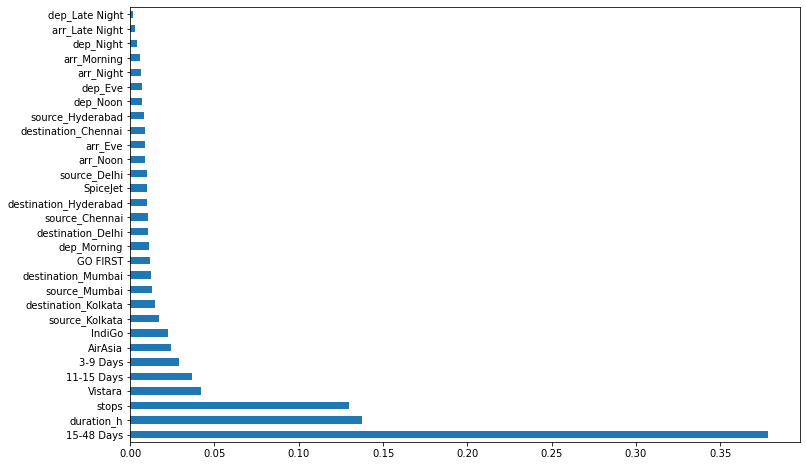

In [187]:
#plot graph of feature importances for better visualization
plt.figure(figsize = (12,8))
feat_importances = pd.Series(selection.feature_importances_, index=X.columns)
feat_importances.nlargest(30).plot(kind='barh')
plt.show()

<AxesSubplot:xlabel='price', ylabel='Density'>

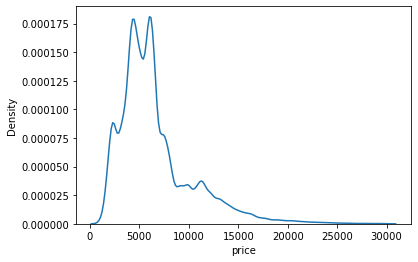

In [178]:
sns.distplot(df_final['price'], hist=False, kde=True)

<AxesSubplot:xlabel='price'>

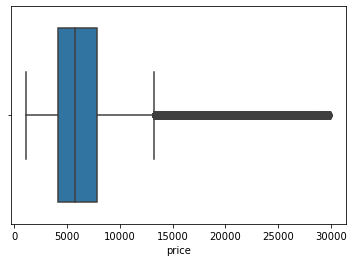

In [179]:
sns.boxplot(df_final['price'])

In [128]:
def plot(data,col):
    fig,(ax1,ax2)=plt.subplots(2,1)
    sns.distplot(data[col],ax=ax1,color='m')
    sns.boxplot(data[col],ax=ax2,color='darkred')

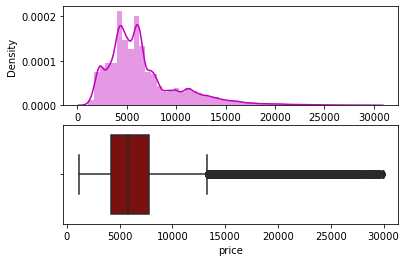

In [129]:
plot(df_final, 'price')

In [124]:
df_final['price']=np.where(df_final['price']>=30000,df_final['price'].median(),df_final['price'])

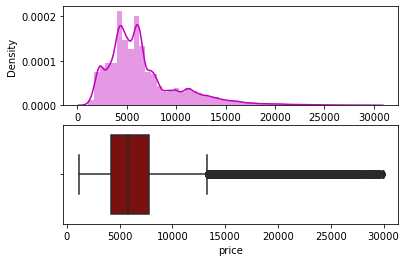

In [130]:
plot(df_final, 'price')

In [241]:
df_final.to_csv('df_final.csv', index=False)

PermissionError: [Errno 13] Permission denied: 'df_final.csv'

In [3]:
df_final = pd.read_csv(r'C:\Users\prati\Project\df_final.csv')

In [4]:
X = df_final.drop(['price'],axis=1)
y = df_final['price']

In [5]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [8]:
print(X_train.shape)
print(X_test.shape)
print(y_train.shape)
print(y_test.shape)

(171065, 30)
(42767, 30)
(171065,)
(42767,)


# Model Building

In [9]:
from sklearn import metrics
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score
from sklearn.ensemble import RandomForestRegressor
import xgboost as xgb
import pickle
from sklearn.model_selection import RandomizedSearchCV

# Linear Regression

In [10]:
model = LinearRegression()
model.fit(X_train,y_train)
y_pred = model.predict(X_test)
accuracy = model.score(X_test,y_test)
print("ML model Accuracy is",accuracy,'%')

ML model Accuracy is 0.5868989397661947 %


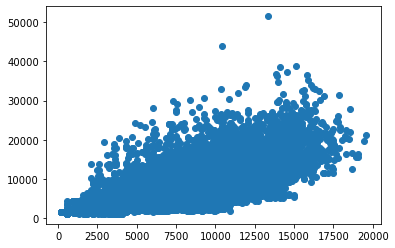

In [11]:
plt.scatter(y_pred,y_test)

In [12]:
r2_score(y_train, y_train)

1.0

# XGBOOST

In [13]:
model_xgb = xgb.XGBRegressor(objective = 'reg:squarederror', learning_rate = 0.1, max_depth = 25, n_estimators = 50)
model_xgb.fit(X_train, y_train)

XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, enable_categorical=False,
             gamma=0, gpu_id=-1, importance_type=None,
             interaction_constraints='', learning_rate=0.1, max_delta_step=0,
             max_depth=25, min_child_weight=1, missing=nan,
             monotone_constraints='()', n_estimators=50, n_jobs=4,
             num_parallel_tree=1, predictor='auto', random_state=0, reg_alpha=0,
             reg_lambda=1, scale_pos_weight=1, subsample=1, tree_method='exact',
             validate_parameters=1, verbosity=None)

In [14]:
model_xgb.score(X_train, y_train) #0.8959828824507207, 0.8965881528428422

0.8986155365310087

In [15]:
result = model_xgb.score(X_test, y_test)
print("Accuracy  {}".format(result)) #0.7755531062926144, 0.7766211335600167

Accuracy  0.7767270043462424


In [16]:
y_pred_xgb = model_xgb.predict(X_test)

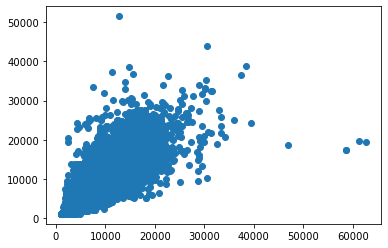

In [17]:
plt.scatter(y_pred_xgb,y_test)

# Random Forest

In [25]:
reg_rf = RandomForestRegressor()
reg_rf.fit(X_train, y_train)

RandomForestRegressor()

In [26]:
y_pred = reg_rf.predict(X_test)

In [27]:
reg_rf.score(X_train, y_train) #0.8906433556739851, 0.8914403245562669

0.8931581463007531

In [28]:
reg_rf.score(X_test, y_test) #0.7865839141435534, 0.7848240629913498

0.78647007364506

In [29]:
print('MAE:', metrics.mean_absolute_error(y_test, y_pred))
print('MSE:', metrics.mean_squared_error(y_test, y_pred))
print('RMSE:', np.sqrt(metrics.mean_squared_error(y_test, y_pred)))

MAE: 876.0289250323401
MSE: 3185715.8840099494
RMSE: 1784.8573847817504


# Hyperparameter Tuning

In [198]:
n_estimators = [int(x) for x in np.linspace(start = 100, stop = 1200, num = 12)]
max_features = ['auto', 'sqrt']
max_depth = [int(x) for x in range(20, 30)]
min_samples_split = [1, 2, 3, 4, 5]
min_samples_leaf = [1, 2]

In [199]:
random_grid = {'n_estimators': n_estimators,
               'max_features': max_features,
               'max_depth': max_depth,
               'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf}

In [200]:
rf_random = RandomizedSearchCV(estimator = reg_rf, param_distributions = random_grid,scoring='neg_mean_squared_error', n_iter = 10, cv = 5, verbose=2, random_state=42, n_jobs = 1)

In [201]:
rf_random.fit(X_train,y_train)

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV] END max_depth=23, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=900; total time= 5.5min
[CV] END max_depth=23, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=900; total time= 5.3min
[CV] END max_depth=23, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=900; total time= 5.3min
[CV] END max_depth=23, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=900; total time= 5.3min
[CV] END max_depth=23, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=900; total time= 5.3min
[CV] END max_depth=25, max_features=auto, min_samples_leaf=2, min_samples_split=3, n_estimators=1100; total time=20.2min
[CV] END max_depth=25, max_features=auto, min_samples_leaf=2, min_samples_split=3, n_estimators=1100; total time=38.9min
[CV] END max_depth=25, max_features=auto, min_samples_leaf=2, min_samples_split=3, n_estimators=1

KeyboardInterrupt: 

In [ ]:
rf_random.best_params_

In [ ]:
prediction = rf_random.predict(X_test)

In [ ]:
rf_random.score(X_train, y_train)

In [ ]:
rf_random.score(X_test, y_test)

In [ ]:
print('MAE:', metrics.mean_absolute_error(y_test, y_pred))
print('MSE:', metrics.mean_squared_error(y_test, y_pred))
print('RMSE:', np.sqrt(metrics.mean_squared_error(y_test, y_pred)))

In [ ]:
plt.scatter(prediction,y_test)

# Pickle model

In [18]:
pickle.dump(model_xgb, open("model.pkl", "wb"))

# load the model
model2 = pickle.load(open("model.pkl", "rb"))

# use model to predict
y_pred = model2.predict(X_test)

In [20]:
metrics.r2_score(y_test, y_pred)

0.7767270043462424

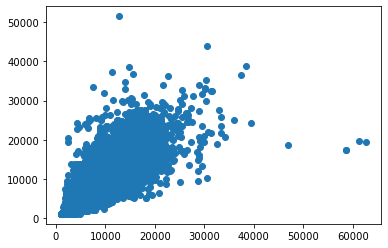

In [23]:
plt.scatter(y_pred,y_test)

In [30]:
pickle.dump(reg_rf, open("model_rf.pkl", "wb"))

# load the model
model_rf = pickle.load(open("model_rf.pkl", "rb"))

# use model to predict
y_pred = model_rf.predict(X_test)

In [31]:
metrics.r2_score(y_test, y_pred)

0.78647007364506